# Suo

In [1]:
import warnings
import os
import sys
import gc
import warnings

In [2]:
import anndata as ad
import scanpy as sc
import copy
import torch
from pathlib import Path
import networkx as nx
from sklearn.neighbors import kneighbors_graph
import numpy as np
import scanpy as sc
import pandas as pd
import numpy as np
import scipy.stats

sys.path.append("/home/icb/kemal.inecik/work/codes/tardis")
import tardis
tardis.config = tardis.config_server

In [3]:
print(f"CUDA used: {torch.cuda.is_available()}")

CUDA used: True


In [4]:
%matplotlib inline
%config InlineBackend.figure_format='retina'
import matplotlib.pyplot as plt
import seaborn as sns

import pickle
_rcparams_path = "/home/icb/kemal.inecik/work/codes/tardis/training/local/figures/rcparams.pickle"
with open(_rcparams_path, 'rb') as file:
    _rcparams = pickle.load(file)
plt.rcParams.update(_rcparams)

In [5]:
adata_file_path = os.path.join(tardis.config.io_directories["processed"], "dataset_complete_Suo_age.h5ad")
assert os.path.isfile(adata_file_path), f"File not already exist: `{adata_file_path}`"
adata = ad.read_h5ad(adata_file_path)
adata.obs["age"] = adata.obs["age"].astype(float)
adata.obs["age_categorical"] = adata.obs["age"].astype(str)
print(adata_file_path, flush=True)
print(adata, flush=True)

/lustre/groups/ml01/workspace/kemal.inecik/tardis_data/processed/dataset_complete_Suo_age.h5ad


AnnData object with n_obs × n_vars = 73697 × 8192
    obs: 'sample_ID', 'organ', 'age', 'cell_type', 'sex', 'sex_inferred', 'concatenated_integration_covariates', 'integration_donor', 'integration_biological_unit', 'integration_sample_status', 'integration_library_platform_coarse', 'n_genes', 'age_categorical'
    uns: 'rank_genes_groups'
    obsm: 'Unintegrated', 'X_pca', 'harmony'


In [6]:
model_level_metrics = [
    dict(
        metric_identifier = "metric_mi|age_categorical",
        training_set = ["train", "validation"],
        every_n_epoch = 5,
        subsample = 0.25,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 512,
            latent_subset=None,
            reduce=np.mean
        )
    )
]

In [7]:
warmup_epoch_range = [6, 48]
dtc_w1 = 100
dtc_w2 = 10

counteractive_minibatch_settings = dict(
    method = "categorical_random",
    method_kwargs = dict(
        within_labels = False,
        within_batch = False,
        within_categorical_covs = None,
        seed = "forward",
    )
)

disentenglement_targets_configurations=[
    dict(
        obs_key = "age_categorical",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="pseudo_categorical",
                non_categorical_coefficient_method="squared_difference",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2 * 1,
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "negative",
                transformation = "none", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1 * 1, 
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "positive",
                transformation = "inverse",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
        ]
    )
]

In [8]:
n_epochs_kl_warmup = 600

model_params = dict(
    n_hidden=512,
    n_layers=3, 
    n_latent=(12 + 8 * len(disentenglement_targets_configurations)),
    gene_likelihood = "nb",
    use_batch_norm = "none",
    use_layer_norm = "both",
    dropout_rate = 0.5,
    deeply_inject_disentengled_latents = True,
    include_auxillary_loss = True,
    beta_kl_weight = 0.5,
    encode_covariates=False
)

train_params = dict(
    max_epochs=600,
    train_size=0.8,
    batch_size=64,
    check_val_every_n_epoch=10,
    limit_train_batches=1.0, 
    limit_val_batches=1.0,
    learning_rate_monitor=True,
    # early stopping:
    early_stopping=False,
    early_stopping_patience=150,
    early_stopping_monitor="elbo_train",
    plan_kwargs = dict(
        n_epochs_kl_warmup=n_epochs_kl_warmup,
        lr=5e-5,
        weight_decay=1e-2,
        optimizer="AdamW",
        # lr-scheduler:
        reduce_lr_on_plateau=True,
        lr_patience=100,
        lr_scheduler_metric="elbo_train",
    )
)

dataset_params = dict(
    layer=None, 
    labels_key=None,
    batch_key=None,
    categorical_covariate_keys=None,
    disentenglement_targets_configurations=disentenglement_targets_configurations,
    model_level_metrics=model_level_metrics,
    model_level_metrics_helper_covariates=['age_categorical']
)

tardis.MyModel.setup_anndata(adata, **dataset_params)
dataset_params["adata_path"] = adata_file_path
dataset_params["adata"] = os.path.split(adata_file_path)[1]

tardis.MyModel.setup_wandb(
    wandb_configurations=tardis.config.wandb,
    hyperparams=dict(
        model_params=model_params,
        train_params=train_params,
        dataset_params=dataset_params,
    )
)

vae = tardis.MyModel(
    adata,
    **model_params
)
vae.train(**train_params)

dir_path = os.path.join(
    tardis.config.io_directories["models"],
    "suo_age-continuous_4_encode"
)

vae.save(
    dir_path,
    overwrite=True,
)

CUDA backend failed to initialize: Found cuDNN version 8700, but JAX was built against version 8907, which is newer. The copy of cuDNN that is installed must be at least as new as the version against which JAX was built. (Set TF_CPP_MIN_LOG_LEVEL=0 and rerun for more info.)


W&B logger initialized with the following parameters: 
Entity: inecik-academic
Project: tardis_figures
ID: tr2iy05o
Name: olive-grass-149
Tags: tardis, conference, figures, final
Notes: Final runs for Tardis before conference.
URL: https://wandb.ai/inecik-academic/tardis_figures/runs/tr2iy05o
Directory: /lustre/groups/ml01/workspace/kemal.inecik/wandb/run-20240503_170121-tr2iy05o/files



/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...


GPU available: True (cuda), used: True


TPU available: False, using: 0 TPU cores


IPU available: False, using: 0 IPUs


HPU available: False, using: 0 HPUs


`Trainer(limit_train_batches=1.0)` was configured so 100% of the batches per epoch will be used..


`Trainer(limit_val_batches=1.0)` was configured so 100% of the batches will be used..


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...
You are using a CUDA device ('NVIDIA A100-PCIE-40GB MIG 3g.20gb') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [MIG-d7527232-b423-53a6-b24b-0b680aeec10f]


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


Training:   0%|          | 0/600 [00:00<?, ?it/s]

Epoch 1/600:   0%|          | 0/600 [00:00<?, ?it/s]

/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `age_categorical` for `training` set. Number of elements in each group: 4799,7563,5875,6676,15275,18770
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `age_categorical` for `validation` set. Number of elements in each group: 1214,1881,1444,1668,3690,4842
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


Epoch 1/600:   0%|          | 1/600 [00:23<3:53:49, 23.42s/it]

Epoch 1/600:   0%|          | 1/600 [00:23<3:53:49, 23.42s/it, v_num=5o_1, total_loss_train=622, kl_local_train=34.6]

Epoch 2/600:   0%|          | 1/600 [00:23<3:53:49, 23.42s/it, v_num=5o_1, total_loss_train=622, kl_local_train=34.6]

Epoch 2/600:   0%|          | 2/600 [00:42<3:28:00, 20.87s/it, v_num=5o_1, total_loss_train=622, kl_local_train=34.6]

Epoch 2/600:   0%|          | 2/600 [00:42<3:28:00, 20.87s/it, v_num=5o_1, total_loss_train=482, kl_local_train=63.9]

Epoch 3/600:   0%|          | 2/600 [00:42<3:28:00, 20.87s/it, v_num=5o_1, total_loss_train=482, kl_local_train=63.9]

Epoch 3/600:   0%|          | 3/600 [00:59<3:10:14, 19.12s/it, v_num=5o_1, total_loss_train=482, kl_local_train=63.9]

Epoch 3/600:   0%|          | 3/600 [00:59<3:10:14, 19.12s/it, v_num=5o_1, total_loss_train=452, kl_local_train=74.2]

Epoch 4/600:   0%|          | 3/600 [00:59<3:10:14, 19.12s/it, v_num=5o_1, total_loss_train=452, kl_local_train=74.2]

Epoch 4/600:   1%|          | 4/600 [01:17<3:06:25, 18.77s/it, v_num=5o_1, total_loss_train=452, kl_local_train=74.2]

Epoch 4/600:   1%|          | 4/600 [01:17<3:06:25, 18.77s/it, v_num=5o_1, total_loss_train=442, kl_local_train=79.5]

Epoch 5/600:   1%|          | 4/600 [01:17<3:06:25, 18.77s/it, v_num=5o_1, total_loss_train=442, kl_local_train=79.5]

Epoch 5/600:   1%|          | 5/600 [01:35<3:01:06, 18.26s/it, v_num=5o_1, total_loss_train=442, kl_local_train=79.5]

Epoch 5/600:   1%|          | 5/600 [01:35<3:01:06, 18.26s/it, v_num=5o_1, total_loss_train=438, kl_local_train=80.6]

Epoch 6/600:   1%|          | 5/600 [01:35<3:01:06, 18.26s/it, v_num=5o_1, total_loss_train=438, kl_local_train=80.6]

Epoch 6/600:   1%|          | 6/600 [01:54<3:04:51, 18.67s/it, v_num=5o_1, total_loss_train=438, kl_local_train=80.6]

Epoch 6/600:   1%|          | 6/600 [01:54<3:04:51, 18.67s/it, v_num=5o_1, total_loss_train=434, kl_local_train=79.2, metric_mi|age_categorical_train=0.0702]

Epoch 7/600:   1%|          | 6/600 [01:54<3:04:51, 18.67s/it, v_num=5o_1, total_loss_train=434, kl_local_train=79.2, metric_mi|age_categorical_train=0.0702]

Epoch 7/600:   1%|          | 7/600 [02:15<3:11:22, 19.36s/it, v_num=5o_1, total_loss_train=434, kl_local_train=79.2, metric_mi|age_categorical_train=0.0702]

Epoch 7/600:   1%|          | 7/600 [02:15<3:11:22, 19.36s/it, v_num=5o_1, total_loss_train=432, kl_local_train=77.7, metric_mi|age_categorical_train=0.0702]

Epoch 8/600:   1%|          | 7/600 [02:15<3:11:22, 19.36s/it, v_num=5o_1, total_loss_train=432, kl_local_train=77.7, metric_mi|age_categorical_train=0.0702]

Epoch 8/600:   1%|▏         | 8/600 [02:35<3:13:34, 19.62s/it, v_num=5o_1, total_loss_train=432, kl_local_train=77.7, metric_mi|age_categorical_train=0.0702]

Epoch 8/600:   1%|▏         | 8/600 [02:35<3:13:34, 19.62s/it, v_num=5o_1, total_loss_train=441, kl_local_train=91.7, metric_mi|age_categorical_train=0.0702]

Epoch 9/600:   1%|▏         | 8/600 [02:35<3:13:34, 19.62s/it, v_num=5o_1, total_loss_train=441, kl_local_train=91.7, metric_mi|age_categorical_train=0.0702]

Epoch 9/600:   2%|▏         | 9/600 [02:53<3:07:16, 19.01s/it, v_num=5o_1, total_loss_train=441, kl_local_train=91.7, metric_mi|age_categorical_train=0.0702]

Epoch 9/600:   2%|▏         | 9/600 [02:53<3:07:16, 19.01s/it, v_num=5o_1, total_loss_train=450, kl_local_train=85.5, metric_mi|age_categorical_train=0.0702]

Epoch 10/600:   2%|▏         | 9/600 [02:53<3:07:16, 19.01s/it, v_num=5o_1, total_loss_train=450, kl_local_train=85.5, metric_mi|age_categorical_train=0.0702]

Epoch 10/600:   2%|▏         | 10/600 [03:12<3:08:26, 19.16s/it, v_num=5o_1, total_loss_train=450, kl_local_train=85.5, metric_mi|age_categorical_train=0.0702]

Epoch 10/600:   2%|▏         | 10/600 [03:12<3:08:26, 19.16s/it, v_num=5o_1, total_loss_train=459, kl_local_train=81.4, metric_mi|age_categorical_train=0.0702]

Epoch 11/600:   2%|▏         | 10/600 [03:13<3:08:26, 19.16s/it, v_num=5o_1, total_loss_train=459, kl_local_train=81.4, metric_mi|age_categorical_train=0.0702]

Epoch 11/600:   2%|▏         | 11/600 [03:31<3:07:35, 19.11s/it, v_num=5o_1, total_loss_train=459, kl_local_train=81.4, metric_mi|age_categorical_train=0.0702]

Epoch 11/600:   2%|▏         | 11/600 [03:31<3:07:35, 19.11s/it, v_num=5o_1, total_loss_train=468, kl_local_train=79.8, metric_mi|age_categorical_train=0.0688]

Epoch 12/600:   2%|▏         | 11/600 [03:31<3:07:35, 19.11s/it, v_num=5o_1, total_loss_train=468, kl_local_train=79.8, metric_mi|age_categorical_train=0.0688]

Epoch 12/600:   2%|▏         | 12/600 [03:51<3:08:09, 19.20s/it, v_num=5o_1, total_loss_train=468, kl_local_train=79.8, metric_mi|age_categorical_train=0.0688]

Epoch 12/600:   2%|▏         | 12/600 [03:51<3:08:09, 19.20s/it, v_num=5o_1, total_loss_train=477, kl_local_train=79.5, metric_mi|age_categorical_train=0.0688]

Epoch 13/600:   2%|▏         | 12/600 [03:51<3:08:09, 19.20s/it, v_num=5o_1, total_loss_train=477, kl_local_train=79.5, metric_mi|age_categorical_train=0.0688]

Epoch 13/600:   2%|▏         | 13/600 [04:11<3:10:54, 19.51s/it, v_num=5o_1, total_loss_train=477, kl_local_train=79.5, metric_mi|age_categorical_train=0.0688]

Epoch 13/600:   2%|▏         | 13/600 [04:11<3:10:54, 19.51s/it, v_num=5o_1, total_loss_train=486, kl_local_train=78.8, metric_mi|age_categorical_train=0.0688]

Epoch 14/600:   2%|▏         | 13/600 [04:11<3:10:54, 19.51s/it, v_num=5o_1, total_loss_train=486, kl_local_train=78.8, metric_mi|age_categorical_train=0.0688]

Epoch 14/600:   2%|▏         | 14/600 [04:28<3:04:10, 18.86s/it, v_num=5o_1, total_loss_train=486, kl_local_train=78.8, metric_mi|age_categorical_train=0.0688]

Epoch 14/600:   2%|▏         | 14/600 [04:28<3:04:10, 18.86s/it, v_num=5o_1, total_loss_train=496, kl_local_train=79.5, metric_mi|age_categorical_train=0.0688]

Epoch 15/600:   2%|▏         | 14/600 [04:28<3:04:10, 18.86s/it, v_num=5o_1, total_loss_train=496, kl_local_train=79.5, metric_mi|age_categorical_train=0.0688]

Epoch 15/600:   2%|▎         | 15/600 [04:48<3:06:49, 19.16s/it, v_num=5o_1, total_loss_train=496, kl_local_train=79.5, metric_mi|age_categorical_train=0.0688]

Epoch 15/600:   2%|▎         | 15/600 [04:48<3:06:49, 19.16s/it, v_num=5o_1, total_loss_train=505, kl_local_train=80.7, metric_mi|age_categorical_train=0.0688]

Epoch 16/600:   2%|▎         | 15/600 [04:49<3:06:49, 19.16s/it, v_num=5o_1, total_loss_train=505, kl_local_train=80.7, metric_mi|age_categorical_train=0.0688]

Epoch 16/600:   3%|▎         | 16/600 [05:10<3:13:51, 19.92s/it, v_num=5o_1, total_loss_train=505, kl_local_train=80.7, metric_mi|age_categorical_train=0.0688]

Epoch 16/600:   3%|▎         | 16/600 [05:10<3:13:51, 19.92s/it, v_num=5o_1, total_loss_train=515, kl_local_train=83.5, metric_mi|age_categorical_train=0.0678]

Epoch 17/600:   3%|▎         | 16/600 [05:10<3:13:51, 19.92s/it, v_num=5o_1, total_loss_train=515, kl_local_train=83.5, metric_mi|age_categorical_train=0.0678]

Epoch 17/600:   3%|▎         | 17/600 [05:29<3:11:15, 19.68s/it, v_num=5o_1, total_loss_train=515, kl_local_train=83.5, metric_mi|age_categorical_train=0.0678]

Epoch 17/600:   3%|▎         | 17/600 [05:29<3:11:15, 19.68s/it, v_num=5o_1, total_loss_train=523, kl_local_train=89.9, metric_mi|age_categorical_train=0.0678]

Epoch 18/600:   3%|▎         | 17/600 [05:29<3:11:15, 19.68s/it, v_num=5o_1, total_loss_train=523, kl_local_train=89.9, metric_mi|age_categorical_train=0.0678]

Epoch 18/600:   3%|▎         | 18/600 [05:47<3:07:31, 19.33s/it, v_num=5o_1, total_loss_train=523, kl_local_train=89.9, metric_mi|age_categorical_train=0.0678]

Epoch 18/600:   3%|▎         | 18/600 [05:47<3:07:31, 19.33s/it, v_num=5o_1, total_loss_train=531, kl_local_train=102, metric_mi|age_categorical_train=0.0678] 

Epoch 19/600:   3%|▎         | 18/600 [05:47<3:07:31, 19.33s/it, v_num=5o_1, total_loss_train=531, kl_local_train=102, metric_mi|age_categorical_train=0.0678]

Epoch 19/600:   3%|▎         | 19/600 [06:08<3:10:20, 19.66s/it, v_num=5o_1, total_loss_train=531, kl_local_train=102, metric_mi|age_categorical_train=0.0678]

Epoch 19/600:   3%|▎         | 19/600 [06:08<3:10:20, 19.66s/it, v_num=5o_1, total_loss_train=529, kl_local_train=135, metric_mi|age_categorical_train=0.0678]

Epoch 20/600:   3%|▎         | 19/600 [06:08<3:10:20, 19.66s/it, v_num=5o_1, total_loss_train=529, kl_local_train=135, metric_mi|age_categorical_train=0.0678]

Epoch 20/600:   3%|▎         | 20/600 [06:28<3:10:47, 19.74s/it, v_num=5o_1, total_loss_train=529, kl_local_train=135, metric_mi|age_categorical_train=0.0678]

Epoch 20/600:   3%|▎         | 20/600 [06:28<3:10:47, 19.74s/it, v_num=5o_1, total_loss_train=516, kl_local_train=195, metric_mi|age_categorical_train=0.0678]

Epoch 21/600:   3%|▎         | 20/600 [06:28<3:10:47, 19.74s/it, v_num=5o_1, total_loss_train=516, kl_local_train=195, metric_mi|age_categorical_train=0.0678]

Epoch 21/600:   4%|▎         | 21/600 [06:47<3:07:43, 19.45s/it, v_num=5o_1, total_loss_train=516, kl_local_train=195, metric_mi|age_categorical_train=0.0678]

Epoch 21/600:   4%|▎         | 21/600 [06:47<3:07:43, 19.45s/it, v_num=5o_1, total_loss_train=510, kl_local_train=240, metric_mi|age_categorical_train=0.103] 

Epoch 22/600:   4%|▎         | 21/600 [06:47<3:07:43, 19.45s/it, v_num=5o_1, total_loss_train=510, kl_local_train=240, metric_mi|age_categorical_train=0.103]

Epoch 22/600:   4%|▎         | 22/600 [07:05<3:04:14, 19.13s/it, v_num=5o_1, total_loss_train=510, kl_local_train=240, metric_mi|age_categorical_train=0.103]

Epoch 22/600:   4%|▎         | 22/600 [07:05<3:04:14, 19.13s/it, v_num=5o_1, total_loss_train=510, kl_local_train=271, metric_mi|age_categorical_train=0.103]

Epoch 23/600:   4%|▎         | 22/600 [07:05<3:04:14, 19.13s/it, v_num=5o_1, total_loss_train=510, kl_local_train=271, metric_mi|age_categorical_train=0.103]

Epoch 23/600:   4%|▍         | 23/600 [07:23<3:02:08, 18.94s/it, v_num=5o_1, total_loss_train=510, kl_local_train=271, metric_mi|age_categorical_train=0.103]

Epoch 23/600:   4%|▍         | 23/600 [07:23<3:02:08, 18.94s/it, v_num=5o_1, total_loss_train=513, kl_local_train=303, metric_mi|age_categorical_train=0.103]

Epoch 24/600:   4%|▍         | 23/600 [07:23<3:02:08, 18.94s/it, v_num=5o_1, total_loss_train=513, kl_local_train=303, metric_mi|age_categorical_train=0.103]

Epoch 24/600:   4%|▍         | 24/600 [07:45<3:08:21, 19.62s/it, v_num=5o_1, total_loss_train=513, kl_local_train=303, metric_mi|age_categorical_train=0.103]

Epoch 24/600:   4%|▍         | 24/600 [07:45<3:08:21, 19.62s/it, v_num=5o_1, total_loss_train=514, kl_local_train=331, metric_mi|age_categorical_train=0.103]

Epoch 25/600:   4%|▍         | 24/600 [07:45<3:08:21, 19.62s/it, v_num=5o_1, total_loss_train=514, kl_local_train=331, metric_mi|age_categorical_train=0.103]

Epoch 25/600:   4%|▍         | 25/600 [08:04<3:06:02, 19.41s/it, v_num=5o_1, total_loss_train=514, kl_local_train=331, metric_mi|age_categorical_train=0.103]

Epoch 25/600:   4%|▍         | 25/600 [08:04<3:06:02, 19.41s/it, v_num=5o_1, total_loss_train=516, kl_local_train=352, metric_mi|age_categorical_train=0.103]

Epoch 26/600:   4%|▍         | 25/600 [08:04<3:06:02, 19.41s/it, v_num=5o_1, total_loss_train=516, kl_local_train=352, metric_mi|age_categorical_train=0.103]

Epoch 26/600:   4%|▍         | 26/600 [08:22<3:01:55, 19.02s/it, v_num=5o_1, total_loss_train=516, kl_local_train=352, metric_mi|age_categorical_train=0.103]

Epoch 26/600:   4%|▍         | 26/600 [08:22<3:01:55, 19.02s/it, v_num=5o_1, total_loss_train=518, kl_local_train=366, metric_mi|age_categorical_train=0.127]

Epoch 27/600:   4%|▍         | 26/600 [08:22<3:01:55, 19.02s/it, v_num=5o_1, total_loss_train=518, kl_local_train=366, metric_mi|age_categorical_train=0.127]

Epoch 27/600:   4%|▍         | 27/600 [08:40<2:59:47, 18.83s/it, v_num=5o_1, total_loss_train=518, kl_local_train=366, metric_mi|age_categorical_train=0.127]

Epoch 27/600:   4%|▍         | 27/600 [08:40<2:59:47, 18.83s/it, v_num=5o_1, total_loss_train=520, kl_local_train=389, metric_mi|age_categorical_train=0.127]

Epoch 28/600:   4%|▍         | 27/600 [08:40<2:59:47, 18.83s/it, v_num=5o_1, total_loss_train=520, kl_local_train=389, metric_mi|age_categorical_train=0.127]

Epoch 28/600:   5%|▍         | 28/600 [08:59<2:59:41, 18.85s/it, v_num=5o_1, total_loss_train=520, kl_local_train=389, metric_mi|age_categorical_train=0.127]

Epoch 28/600:   5%|▍         | 28/600 [08:59<2:59:41, 18.85s/it, v_num=5o_1, total_loss_train=523, kl_local_train=401, metric_mi|age_categorical_train=0.127]

Epoch 29/600:   5%|▍         | 28/600 [08:59<2:59:41, 18.85s/it, v_num=5o_1, total_loss_train=523, kl_local_train=401, metric_mi|age_categorical_train=0.127]

Epoch 29/600:   5%|▍         | 29/600 [09:19<3:03:23, 19.27s/it, v_num=5o_1, total_loss_train=523, kl_local_train=401, metric_mi|age_categorical_train=0.127]

Epoch 29/600:   5%|▍         | 29/600 [09:19<3:03:23, 19.27s/it, v_num=5o_1, total_loss_train=524, kl_local_train=402, metric_mi|age_categorical_train=0.127]

Epoch 30/600:   5%|▍         | 29/600 [09:19<3:03:23, 19.27s/it, v_num=5o_1, total_loss_train=524, kl_local_train=402, metric_mi|age_categorical_train=0.127]

Epoch 30/600:   5%|▌         | 30/600 [09:42<3:13:42, 20.39s/it, v_num=5o_1, total_loss_train=524, kl_local_train=402, metric_mi|age_categorical_train=0.127]

Epoch 30/600:   5%|▌         | 30/600 [09:42<3:13:42, 20.39s/it, v_num=5o_1, total_loss_train=524, kl_local_train=393, metric_mi|age_categorical_train=0.127]

Epoch 31/600:   5%|▌         | 30/600 [09:43<3:13:42, 20.39s/it, v_num=5o_1, total_loss_train=524, kl_local_train=393, metric_mi|age_categorical_train=0.127]

Epoch 31/600:   5%|▌         | 31/600 [10:00<3:07:04, 19.73s/it, v_num=5o_1, total_loss_train=524, kl_local_train=393, metric_mi|age_categorical_train=0.127]

Epoch 31/600:   5%|▌         | 31/600 [10:00<3:07:04, 19.73s/it, v_num=5o_1, total_loss_train=527, kl_local_train=411, metric_mi|age_categorical_train=0.14] 

Epoch 32/600:   5%|▌         | 31/600 [10:00<3:07:04, 19.73s/it, v_num=5o_1, total_loss_train=527, kl_local_train=411, metric_mi|age_categorical_train=0.14]

Epoch 32/600:   5%|▌         | 32/600 [10:18<3:00:58, 19.12s/it, v_num=5o_1, total_loss_train=527, kl_local_train=411, metric_mi|age_categorical_train=0.14]

Epoch 32/600:   5%|▌         | 32/600 [10:18<3:00:58, 19.12s/it, v_num=5o_1, total_loss_train=528, kl_local_train=413, metric_mi|age_categorical_train=0.14]

Epoch 33/600:   5%|▌         | 32/600 [10:18<3:00:58, 19.12s/it, v_num=5o_1, total_loss_train=528, kl_local_train=413, metric_mi|age_categorical_train=0.14]

Epoch 33/600:   6%|▌         | 33/600 [10:35<2:55:47, 18.60s/it, v_num=5o_1, total_loss_train=528, kl_local_train=413, metric_mi|age_categorical_train=0.14]

Epoch 33/600:   6%|▌         | 33/600 [10:35<2:55:47, 18.60s/it, v_num=5o_1, total_loss_train=529, kl_local_train=396, metric_mi|age_categorical_train=0.14]

Epoch 34/600:   6%|▌         | 33/600 [10:35<2:55:47, 18.60s/it, v_num=5o_1, total_loss_train=529, kl_local_train=396, metric_mi|age_categorical_train=0.14]

Epoch 34/600:   6%|▌         | 34/600 [10:55<2:58:59, 18.97s/it, v_num=5o_1, total_loss_train=529, kl_local_train=396, metric_mi|age_categorical_train=0.14]

Epoch 34/600:   6%|▌         | 34/600 [10:55<2:58:59, 18.97s/it, v_num=5o_1, total_loss_train=531, kl_local_train=399, metric_mi|age_categorical_train=0.14]

Epoch 35/600:   6%|▌         | 34/600 [10:55<2:58:59, 18.97s/it, v_num=5o_1, total_loss_train=531, kl_local_train=399, metric_mi|age_categorical_train=0.14]

Epoch 35/600:   6%|▌         | 35/600 [11:15<3:00:39, 19.18s/it, v_num=5o_1, total_loss_train=531, kl_local_train=399, metric_mi|age_categorical_train=0.14]

Epoch 35/600:   6%|▌         | 35/600 [11:15<3:00:39, 19.18s/it, v_num=5o_1, total_loss_train=531, kl_local_train=392, metric_mi|age_categorical_train=0.14]

Epoch 36/600:   6%|▌         | 35/600 [11:16<3:00:39, 19.18s/it, v_num=5o_1, total_loss_train=531, kl_local_train=392, metric_mi|age_categorical_train=0.14]

Epoch 36/600:   6%|▌         | 36/600 [11:36<3:05:58, 19.78s/it, v_num=5o_1, total_loss_train=531, kl_local_train=392, metric_mi|age_categorical_train=0.14]

Epoch 36/600:   6%|▌         | 36/600 [11:36<3:05:58, 19.78s/it, v_num=5o_1, total_loss_train=532, kl_local_train=392, metric_mi|age_categorical_train=0.15]

Epoch 37/600:   6%|▌         | 36/600 [11:36<3:05:58, 19.78s/it, v_num=5o_1, total_loss_train=532, kl_local_train=392, metric_mi|age_categorical_train=0.15]

Epoch 37/600:   6%|▌         | 37/600 [11:53<2:57:25, 18.91s/it, v_num=5o_1, total_loss_train=532, kl_local_train=392, metric_mi|age_categorical_train=0.15]

Epoch 37/600:   6%|▌         | 37/600 [11:53<2:57:25, 18.91s/it, v_num=5o_1, total_loss_train=533, kl_local_train=383, metric_mi|age_categorical_train=0.15]

Epoch 38/600:   6%|▌         | 37/600 [11:53<2:57:25, 18.91s/it, v_num=5o_1, total_loss_train=533, kl_local_train=383, metric_mi|age_categorical_train=0.15]

Epoch 38/600:   6%|▋         | 38/600 [12:14<3:01:42, 19.40s/it, v_num=5o_1, total_loss_train=533, kl_local_train=383, metric_mi|age_categorical_train=0.15]

Epoch 38/600:   6%|▋         | 38/600 [12:14<3:01:42, 19.40s/it, v_num=5o_1, total_loss_train=536, kl_local_train=374, metric_mi|age_categorical_train=0.15]

Epoch 39/600:   6%|▋         | 38/600 [12:14<3:01:42, 19.40s/it, v_num=5o_1, total_loss_train=536, kl_local_train=374, metric_mi|age_categorical_train=0.15]

Epoch 39/600:   6%|▋         | 39/600 [12:33<3:00:45, 19.33s/it, v_num=5o_1, total_loss_train=536, kl_local_train=374, metric_mi|age_categorical_train=0.15]

Epoch 39/600:   6%|▋         | 39/600 [12:33<3:00:45, 19.33s/it, v_num=5o_1, total_loss_train=536, kl_local_train=357, metric_mi|age_categorical_train=0.15]

Epoch 40/600:   6%|▋         | 39/600 [12:33<3:00:45, 19.33s/it, v_num=5o_1, total_loss_train=536, kl_local_train=357, metric_mi|age_categorical_train=0.15]

Epoch 40/600:   7%|▋         | 40/600 [12:52<3:01:03, 19.40s/it, v_num=5o_1, total_loss_train=536, kl_local_train=357, metric_mi|age_categorical_train=0.15]

Epoch 40/600:   7%|▋         | 40/600 [12:52<3:01:03, 19.40s/it, v_num=5o_1, total_loss_train=536, kl_local_train=348, metric_mi|age_categorical_train=0.15]

Epoch 41/600:   7%|▋         | 40/600 [12:53<3:01:03, 19.40s/it, v_num=5o_1, total_loss_train=536, kl_local_train=348, metric_mi|age_categorical_train=0.15]

Epoch 41/600:   7%|▋         | 41/600 [13:11<2:59:40, 19.29s/it, v_num=5o_1, total_loss_train=536, kl_local_train=348, metric_mi|age_categorical_train=0.15]

Epoch 41/600:   7%|▋         | 41/600 [13:11<2:59:40, 19.29s/it, v_num=5o_1, total_loss_train=538, kl_local_train=346, metric_mi|age_categorical_train=0.166]

Epoch 42/600:   7%|▋         | 41/600 [13:11<2:59:40, 19.29s/it, v_num=5o_1, total_loss_train=538, kl_local_train=346, metric_mi|age_categorical_train=0.166]

Epoch 42/600:   7%|▋         | 42/600 [13:30<2:57:31, 19.09s/it, v_num=5o_1, total_loss_train=538, kl_local_train=346, metric_mi|age_categorical_train=0.166]

Epoch 42/600:   7%|▋         | 42/600 [13:30<2:57:31, 19.09s/it, v_num=5o_1, total_loss_train=540, kl_local_train=340, metric_mi|age_categorical_train=0.166]

Epoch 43/600:   7%|▋         | 42/600 [13:30<2:57:31, 19.09s/it, v_num=5o_1, total_loss_train=540, kl_local_train=340, metric_mi|age_categorical_train=0.166]

Epoch 43/600:   7%|▋         | 43/600 [13:49<2:57:55, 19.17s/it, v_num=5o_1, total_loss_train=540, kl_local_train=340, metric_mi|age_categorical_train=0.166]

Epoch 43/600:   7%|▋         | 43/600 [13:49<2:57:55, 19.17s/it, v_num=5o_1, total_loss_train=541, kl_local_train=333, metric_mi|age_categorical_train=0.166]

Epoch 44/600:   7%|▋         | 43/600 [13:49<2:57:55, 19.17s/it, v_num=5o_1, total_loss_train=541, kl_local_train=333, metric_mi|age_categorical_train=0.166]

Epoch 44/600:   7%|▋         | 44/600 [14:07<2:52:28, 18.61s/it, v_num=5o_1, total_loss_train=541, kl_local_train=333, metric_mi|age_categorical_train=0.166]

Epoch 44/600:   7%|▋         | 44/600 [14:07<2:52:28, 18.61s/it, v_num=5o_1, total_loss_train=544, kl_local_train=325, metric_mi|age_categorical_train=0.166]

Epoch 45/600:   7%|▋         | 44/600 [14:07<2:52:28, 18.61s/it, v_num=5o_1, total_loss_train=544, kl_local_train=325, metric_mi|age_categorical_train=0.166]

Epoch 45/600:   8%|▊         | 45/600 [14:25<2:51:30, 18.54s/it, v_num=5o_1, total_loss_train=544, kl_local_train=325, metric_mi|age_categorical_train=0.166]

Epoch 45/600:   8%|▊         | 45/600 [14:25<2:51:30, 18.54s/it, v_num=5o_1, total_loss_train=546, kl_local_train=327, metric_mi|age_categorical_train=0.166]

Epoch 46/600:   8%|▊         | 45/600 [14:26<2:51:30, 18.54s/it, v_num=5o_1, total_loss_train=546, kl_local_train=327, metric_mi|age_categorical_train=0.166]

Epoch 46/600:   8%|▊         | 46/600 [14:45<2:54:01, 18.85s/it, v_num=5o_1, total_loss_train=546, kl_local_train=327, metric_mi|age_categorical_train=0.166]

Epoch 46/600:   8%|▊         | 46/600 [14:45<2:54:01, 18.85s/it, v_num=5o_1, total_loss_train=547, kl_local_train=320, metric_mi|age_categorical_train=0.172]

Epoch 47/600:   8%|▊         | 46/600 [14:45<2:54:01, 18.85s/it, v_num=5o_1, total_loss_train=547, kl_local_train=320, metric_mi|age_categorical_train=0.172]

Epoch 47/600:   8%|▊         | 47/600 [15:04<2:55:35, 19.05s/it, v_num=5o_1, total_loss_train=547, kl_local_train=320, metric_mi|age_categorical_train=0.172]

Epoch 47/600:   8%|▊         | 47/600 [15:04<2:55:35, 19.05s/it, v_num=5o_1, total_loss_train=549, kl_local_train=321, metric_mi|age_categorical_train=0.172]

Epoch 48/600:   8%|▊         | 47/600 [15:04<2:55:35, 19.05s/it, v_num=5o_1, total_loss_train=549, kl_local_train=321, metric_mi|age_categorical_train=0.172]

Epoch 48/600:   8%|▊         | 48/600 [15:22<2:53:05, 18.81s/it, v_num=5o_1, total_loss_train=549, kl_local_train=321, metric_mi|age_categorical_train=0.172]

Epoch 48/600:   8%|▊         | 48/600 [15:22<2:53:05, 18.81s/it, v_num=5o_1, total_loss_train=551, kl_local_train=314, metric_mi|age_categorical_train=0.172]

Epoch 49/600:   8%|▊         | 48/600 [15:22<2:53:05, 18.81s/it, v_num=5o_1, total_loss_train=551, kl_local_train=314, metric_mi|age_categorical_train=0.172]

Epoch 49/600:   8%|▊         | 49/600 [15:42<2:54:11, 18.97s/it, v_num=5o_1, total_loss_train=551, kl_local_train=314, metric_mi|age_categorical_train=0.172]

Epoch 49/600:   8%|▊         | 49/600 [15:42<2:54:11, 18.97s/it, v_num=5o_1, total_loss_train=553, kl_local_train=314, metric_mi|age_categorical_train=0.172]

Epoch 50/600:   8%|▊         | 49/600 [15:42<2:54:11, 18.97s/it, v_num=5o_1, total_loss_train=553, kl_local_train=314, metric_mi|age_categorical_train=0.172]

Epoch 50/600:   8%|▊         | 50/600 [16:00<2:51:02, 18.66s/it, v_num=5o_1, total_loss_train=553, kl_local_train=314, metric_mi|age_categorical_train=0.172]

Epoch 50/600:   8%|▊         | 50/600 [16:00<2:51:02, 18.66s/it, v_num=5o_1, total_loss_train=555, kl_local_train=313, metric_mi|age_categorical_train=0.172]

Epoch 51/600:   8%|▊         | 50/600 [16:00<2:51:02, 18.66s/it, v_num=5o_1, total_loss_train=555, kl_local_train=313, metric_mi|age_categorical_train=0.172]

Epoch 51/600:   8%|▊         | 51/600 [16:19<2:53:55, 19.01s/it, v_num=5o_1, total_loss_train=555, kl_local_train=313, metric_mi|age_categorical_train=0.172]

Epoch 51/600:   8%|▊         | 51/600 [16:19<2:53:55, 19.01s/it, v_num=5o_1, total_loss_train=554, kl_local_train=317, metric_mi|age_categorical_train=0.168]

Epoch 52/600:   8%|▊         | 51/600 [16:19<2:53:55, 19.01s/it, v_num=5o_1, total_loss_train=554, kl_local_train=317, metric_mi|age_categorical_train=0.168]

Epoch 52/600:   9%|▊         | 52/600 [16:36<2:47:34, 18.35s/it, v_num=5o_1, total_loss_train=554, kl_local_train=317, metric_mi|age_categorical_train=0.168]

Epoch 52/600:   9%|▊         | 52/600 [16:36<2:47:34, 18.35s/it, v_num=5o_1, total_loss_train=552, kl_local_train=314, metric_mi|age_categorical_train=0.168]

Epoch 53/600:   9%|▊         | 52/600 [16:36<2:47:34, 18.35s/it, v_num=5o_1, total_loss_train=552, kl_local_train=314, metric_mi|age_categorical_train=0.168]

Epoch 53/600:   9%|▉         | 53/600 [16:53<2:43:26, 17.93s/it, v_num=5o_1, total_loss_train=552, kl_local_train=314, metric_mi|age_categorical_train=0.168]

Epoch 53/600:   9%|▉         | 53/600 [16:53<2:43:26, 17.93s/it, v_num=5o_1, total_loss_train=552, kl_local_train=308, metric_mi|age_categorical_train=0.168]

Epoch 54/600:   9%|▉         | 53/600 [16:53<2:43:26, 17.93s/it, v_num=5o_1, total_loss_train=552, kl_local_train=308, metric_mi|age_categorical_train=0.168]

Epoch 54/600:   9%|▉         | 54/600 [17:12<2:46:23, 18.28s/it, v_num=5o_1, total_loss_train=552, kl_local_train=308, metric_mi|age_categorical_train=0.168]

Epoch 54/600:   9%|▉         | 54/600 [17:12<2:46:23, 18.28s/it, v_num=5o_1, total_loss_train=551, kl_local_train=287, metric_mi|age_categorical_train=0.168]

Epoch 55/600:   9%|▉         | 54/600 [17:12<2:46:23, 18.28s/it, v_num=5o_1, total_loss_train=551, kl_local_train=287, metric_mi|age_categorical_train=0.168]

Epoch 55/600:   9%|▉         | 55/600 [17:30<2:45:19, 18.20s/it, v_num=5o_1, total_loss_train=551, kl_local_train=287, metric_mi|age_categorical_train=0.168]

Epoch 55/600:   9%|▉         | 55/600 [17:30<2:45:19, 18.20s/it, v_num=5o_1, total_loss_train=550, kl_local_train=279, metric_mi|age_categorical_train=0.168]

Epoch 56/600:   9%|▉         | 55/600 [17:31<2:45:19, 18.20s/it, v_num=5o_1, total_loss_train=550, kl_local_train=279, metric_mi|age_categorical_train=0.168]

Epoch 56/600:   9%|▉         | 56/600 [17:48<2:43:38, 18.05s/it, v_num=5o_1, total_loss_train=550, kl_local_train=279, metric_mi|age_categorical_train=0.168]

Epoch 56/600:   9%|▉         | 56/600 [17:48<2:43:38, 18.05s/it, v_num=5o_1, total_loss_train=549, kl_local_train=282, metric_mi|age_categorical_train=0.154]

Epoch 57/600:   9%|▉         | 56/600 [17:48<2:43:38, 18.05s/it, v_num=5o_1, total_loss_train=549, kl_local_train=282, metric_mi|age_categorical_train=0.154]

Epoch 57/600:  10%|▉         | 57/600 [18:05<2:41:21, 17.83s/it, v_num=5o_1, total_loss_train=549, kl_local_train=282, metric_mi|age_categorical_train=0.154]

Epoch 57/600:  10%|▉         | 57/600 [18:05<2:41:21, 17.83s/it, v_num=5o_1, total_loss_train=549, kl_local_train=284, metric_mi|age_categorical_train=0.154]

Epoch 58/600:  10%|▉         | 57/600 [18:05<2:41:21, 17.83s/it, v_num=5o_1, total_loss_train=549, kl_local_train=284, metric_mi|age_categorical_train=0.154]

Epoch 58/600:  10%|▉         | 58/600 [18:23<2:41:44, 17.91s/it, v_num=5o_1, total_loss_train=549, kl_local_train=284, metric_mi|age_categorical_train=0.154]

Epoch 58/600:  10%|▉         | 58/600 [18:23<2:41:44, 17.91s/it, v_num=5o_1, total_loss_train=549, kl_local_train=289, metric_mi|age_categorical_train=0.154]

Epoch 59/600:  10%|▉         | 58/600 [18:23<2:41:44, 17.91s/it, v_num=5o_1, total_loss_train=549, kl_local_train=289, metric_mi|age_categorical_train=0.154]

Epoch 59/600:  10%|▉         | 59/600 [18:43<2:44:47, 18.28s/it, v_num=5o_1, total_loss_train=549, kl_local_train=289, metric_mi|age_categorical_train=0.154]

Epoch 59/600:  10%|▉         | 59/600 [18:43<2:44:47, 18.28s/it, v_num=5o_1, total_loss_train=548, kl_local_train=284, metric_mi|age_categorical_train=0.154]

Epoch 60/600:  10%|▉         | 59/600 [18:43<2:44:47, 18.28s/it, v_num=5o_1, total_loss_train=548, kl_local_train=284, metric_mi|age_categorical_train=0.154]

Epoch 60/600:  10%|█         | 60/600 [19:01<2:45:52, 18.43s/it, v_num=5o_1, total_loss_train=548, kl_local_train=284, metric_mi|age_categorical_train=0.154]

Epoch 60/600:  10%|█         | 60/600 [19:01<2:45:52, 18.43s/it, v_num=5o_1, total_loss_train=547, kl_local_train=275, metric_mi|age_categorical_train=0.154]

Epoch 61/600:  10%|█         | 60/600 [19:02<2:45:52, 18.43s/it, v_num=5o_1, total_loss_train=547, kl_local_train=275, metric_mi|age_categorical_train=0.154]

Epoch 61/600:  10%|█         | 61/600 [19:19<2:43:03, 18.15s/it, v_num=5o_1, total_loss_train=547, kl_local_train=275, metric_mi|age_categorical_train=0.154]

Epoch 61/600:  10%|█         | 61/600 [19:19<2:43:03, 18.15s/it, v_num=5o_1, total_loss_train=546, kl_local_train=265, metric_mi|age_categorical_train=0.177]

Epoch 62/600:  10%|█         | 61/600 [19:19<2:43:03, 18.15s/it, v_num=5o_1, total_loss_train=546, kl_local_train=265, metric_mi|age_categorical_train=0.177]

Epoch 62/600:  10%|█         | 62/600 [19:38<2:46:05, 18.52s/it, v_num=5o_1, total_loss_train=546, kl_local_train=265, metric_mi|age_categorical_train=0.177]

Epoch 62/600:  10%|█         | 62/600 [19:38<2:46:05, 18.52s/it, v_num=5o_1, total_loss_train=546, kl_local_train=261, metric_mi|age_categorical_train=0.177]

Epoch 63/600:  10%|█         | 62/600 [19:38<2:46:05, 18.52s/it, v_num=5o_1, total_loss_train=546, kl_local_train=261, metric_mi|age_categorical_train=0.177]

Epoch 63/600:  10%|█         | 63/600 [19:56<2:44:22, 18.37s/it, v_num=5o_1, total_loss_train=546, kl_local_train=261, metric_mi|age_categorical_train=0.177]

Epoch 63/600:  10%|█         | 63/600 [19:56<2:44:22, 18.37s/it, v_num=5o_1, total_loss_train=544, kl_local_train=263, metric_mi|age_categorical_train=0.177]

Epoch 64/600:  10%|█         | 63/600 [19:56<2:44:22, 18.37s/it, v_num=5o_1, total_loss_train=544, kl_local_train=263, metric_mi|age_categorical_train=0.177]

Epoch 64/600:  11%|█         | 64/600 [20:15<2:45:11, 18.49s/it, v_num=5o_1, total_loss_train=544, kl_local_train=263, metric_mi|age_categorical_train=0.177]

Epoch 64/600:  11%|█         | 64/600 [20:15<2:45:11, 18.49s/it, v_num=5o_1, total_loss_train=544, kl_local_train=256, metric_mi|age_categorical_train=0.177]

Epoch 65/600:  11%|█         | 64/600 [20:15<2:45:11, 18.49s/it, v_num=5o_1, total_loss_train=544, kl_local_train=256, metric_mi|age_categorical_train=0.177]

Epoch 65/600:  11%|█         | 65/600 [20:36<2:50:17, 19.10s/it, v_num=5o_1, total_loss_train=544, kl_local_train=256, metric_mi|age_categorical_train=0.177]

Epoch 65/600:  11%|█         | 65/600 [20:36<2:50:17, 19.10s/it, v_num=5o_1, total_loss_train=543, kl_local_train=246, metric_mi|age_categorical_train=0.177]

Epoch 66/600:  11%|█         | 65/600 [20:36<2:50:17, 19.10s/it, v_num=5o_1, total_loss_train=543, kl_local_train=246, metric_mi|age_categorical_train=0.177]

Epoch 66/600:  11%|█         | 66/600 [20:53<2:45:42, 18.62s/it, v_num=5o_1, total_loss_train=543, kl_local_train=246, metric_mi|age_categorical_train=0.177]

Epoch 66/600:  11%|█         | 66/600 [20:53<2:45:42, 18.62s/it, v_num=5o_1, total_loss_train=542, kl_local_train=246, metric_mi|age_categorical_train=0.187]

Epoch 67/600:  11%|█         | 66/600 [20:53<2:45:42, 18.62s/it, v_num=5o_1, total_loss_train=542, kl_local_train=246, metric_mi|age_categorical_train=0.187]

Epoch 67/600:  11%|█         | 67/600 [21:11<2:43:25, 18.40s/it, v_num=5o_1, total_loss_train=542, kl_local_train=246, metric_mi|age_categorical_train=0.187]

Epoch 67/600:  11%|█         | 67/600 [21:11<2:43:25, 18.40s/it, v_num=5o_1, total_loss_train=541, kl_local_train=244, metric_mi|age_categorical_train=0.187]

Epoch 68/600:  11%|█         | 67/600 [21:11<2:43:25, 18.40s/it, v_num=5o_1, total_loss_train=541, kl_local_train=244, metric_mi|age_categorical_train=0.187]

Epoch 68/600:  11%|█▏        | 68/600 [21:28<2:39:30, 17.99s/it, v_num=5o_1, total_loss_train=541, kl_local_train=244, metric_mi|age_categorical_train=0.187]

Epoch 68/600:  11%|█▏        | 68/600 [21:28<2:39:30, 17.99s/it, v_num=5o_1, total_loss_train=540, kl_local_train=241, metric_mi|age_categorical_train=0.187]

Epoch 69/600:  11%|█▏        | 68/600 [21:28<2:39:30, 17.99s/it, v_num=5o_1, total_loss_train=540, kl_local_train=241, metric_mi|age_categorical_train=0.187]

Epoch 69/600:  12%|█▏        | 69/600 [21:46<2:39:28, 18.02s/it, v_num=5o_1, total_loss_train=540, kl_local_train=241, metric_mi|age_categorical_train=0.187]

Epoch 69/600:  12%|█▏        | 69/600 [21:46<2:39:28, 18.02s/it, v_num=5o_1, total_loss_train=539, kl_local_train=240, metric_mi|age_categorical_train=0.187]

Epoch 70/600:  12%|█▏        | 69/600 [21:46<2:39:28, 18.02s/it, v_num=5o_1, total_loss_train=539, kl_local_train=240, metric_mi|age_categorical_train=0.187]

Epoch 70/600:  12%|█▏        | 70/600 [22:04<2:39:27, 18.05s/it, v_num=5o_1, total_loss_train=539, kl_local_train=240, metric_mi|age_categorical_train=0.187]

Epoch 70/600:  12%|█▏        | 70/600 [22:04<2:39:27, 18.05s/it, v_num=5o_1, total_loss_train=540, kl_local_train=231, metric_mi|age_categorical_train=0.187]

Epoch 71/600:  12%|█▏        | 70/600 [22:05<2:39:27, 18.05s/it, v_num=5o_1, total_loss_train=540, kl_local_train=231, metric_mi|age_categorical_train=0.187]

Epoch 71/600:  12%|█▏        | 71/600 [22:22<2:37:59, 17.92s/it, v_num=5o_1, total_loss_train=540, kl_local_train=231, metric_mi|age_categorical_train=0.187]

Epoch 71/600:  12%|█▏        | 71/600 [22:22<2:37:59, 17.92s/it, v_num=5o_1, total_loss_train=539, kl_local_train=233, metric_mi|age_categorical_train=0.187]

Epoch 72/600:  12%|█▏        | 71/600 [22:22<2:37:59, 17.92s/it, v_num=5o_1, total_loss_train=539, kl_local_train=233, metric_mi|age_categorical_train=0.187]

Epoch 72/600:  12%|█▏        | 72/600 [22:39<2:34:41, 17.58s/it, v_num=5o_1, total_loss_train=539, kl_local_train=233, metric_mi|age_categorical_train=0.187]

Epoch 72/600:  12%|█▏        | 72/600 [22:39<2:34:41, 17.58s/it, v_num=5o_1, total_loss_train=539, kl_local_train=235, metric_mi|age_categorical_train=0.187]

Epoch 73/600:  12%|█▏        | 72/600 [22:39<2:34:41, 17.58s/it, v_num=5o_1, total_loss_train=539, kl_local_train=235, metric_mi|age_categorical_train=0.187]

Epoch 73/600:  12%|█▏        | 73/600 [23:00<2:45:07, 18.80s/it, v_num=5o_1, total_loss_train=539, kl_local_train=235, metric_mi|age_categorical_train=0.187]

Epoch 73/600:  12%|█▏        | 73/600 [23:00<2:45:07, 18.80s/it, v_num=5o_1, total_loss_train=538, kl_local_train=230, metric_mi|age_categorical_train=0.187]

Epoch 74/600:  12%|█▏        | 73/600 [23:00<2:45:07, 18.80s/it, v_num=5o_1, total_loss_train=538, kl_local_train=230, metric_mi|age_categorical_train=0.187]

Epoch 74/600:  12%|█▏        | 74/600 [23:18<2:43:01, 18.60s/it, v_num=5o_1, total_loss_train=538, kl_local_train=230, metric_mi|age_categorical_train=0.187]

Epoch 74/600:  12%|█▏        | 74/600 [23:18<2:43:01, 18.60s/it, v_num=5o_1, total_loss_train=537, kl_local_train=227, metric_mi|age_categorical_train=0.187]

Epoch 75/600:  12%|█▏        | 74/600 [23:18<2:43:01, 18.60s/it, v_num=5o_1, total_loss_train=537, kl_local_train=227, metric_mi|age_categorical_train=0.187]

Epoch 75/600:  12%|█▎        | 75/600 [23:37<2:41:44, 18.48s/it, v_num=5o_1, total_loss_train=537, kl_local_train=227, metric_mi|age_categorical_train=0.187]

Epoch 75/600:  12%|█▎        | 75/600 [23:37<2:41:44, 18.48s/it, v_num=5o_1, total_loss_train=536, kl_local_train=226, metric_mi|age_categorical_train=0.187]

Epoch 76/600:  12%|█▎        | 75/600 [23:37<2:41:44, 18.48s/it, v_num=5o_1, total_loss_train=536, kl_local_train=226, metric_mi|age_categorical_train=0.187]

Epoch 76/600:  13%|█▎        | 76/600 [23:55<2:42:19, 18.59s/it, v_num=5o_1, total_loss_train=536, kl_local_train=226, metric_mi|age_categorical_train=0.187]

Epoch 76/600:  13%|█▎        | 76/600 [23:55<2:42:19, 18.59s/it, v_num=5o_1, total_loss_train=536, kl_local_train=224, metric_mi|age_categorical_train=0.17] 

Epoch 77/600:  13%|█▎        | 76/600 [23:55<2:42:19, 18.59s/it, v_num=5o_1, total_loss_train=536, kl_local_train=224, metric_mi|age_categorical_train=0.17]

Epoch 77/600:  13%|█▎        | 77/600 [24:14<2:41:17, 18.50s/it, v_num=5o_1, total_loss_train=536, kl_local_train=224, metric_mi|age_categorical_train=0.17]

Epoch 77/600:  13%|█▎        | 77/600 [24:14<2:41:17, 18.50s/it, v_num=5o_1, total_loss_train=536, kl_local_train=226, metric_mi|age_categorical_train=0.17]

Epoch 78/600:  13%|█▎        | 77/600 [24:14<2:41:17, 18.50s/it, v_num=5o_1, total_loss_train=536, kl_local_train=226, metric_mi|age_categorical_train=0.17]

Epoch 78/600:  13%|█▎        | 78/600 [24:33<2:42:12, 18.64s/it, v_num=5o_1, total_loss_train=536, kl_local_train=226, metric_mi|age_categorical_train=0.17]

Epoch 78/600:  13%|█▎        | 78/600 [24:33<2:42:12, 18.64s/it, v_num=5o_1, total_loss_train=536, kl_local_train=228, metric_mi|age_categorical_train=0.17]

Epoch 79/600:  13%|█▎        | 78/600 [24:33<2:42:12, 18.64s/it, v_num=5o_1, total_loss_train=536, kl_local_train=228, metric_mi|age_categorical_train=0.17]

Epoch 79/600:  13%|█▎        | 79/600 [24:52<2:42:32, 18.72s/it, v_num=5o_1, total_loss_train=536, kl_local_train=228, metric_mi|age_categorical_train=0.17]

Epoch 79/600:  13%|█▎        | 79/600 [24:52<2:42:32, 18.72s/it, v_num=5o_1, total_loss_train=536, kl_local_train=227, metric_mi|age_categorical_train=0.17]

Epoch 80/600:  13%|█▎        | 79/600 [24:52<2:42:32, 18.72s/it, v_num=5o_1, total_loss_train=536, kl_local_train=227, metric_mi|age_categorical_train=0.17]

Epoch 80/600:  13%|█▎        | 80/600 [25:10<2:41:22, 18.62s/it, v_num=5o_1, total_loss_train=536, kl_local_train=227, metric_mi|age_categorical_train=0.17]

Epoch 80/600:  13%|█▎        | 80/600 [25:10<2:41:22, 18.62s/it, v_num=5o_1, total_loss_train=536, kl_local_train=226, metric_mi|age_categorical_train=0.17]

Epoch 81/600:  13%|█▎        | 80/600 [25:11<2:41:22, 18.62s/it, v_num=5o_1, total_loss_train=536, kl_local_train=226, metric_mi|age_categorical_train=0.17]

Epoch 81/600:  14%|█▎        | 81/600 [25:31<2:47:17, 19.34s/it, v_num=5o_1, total_loss_train=536, kl_local_train=226, metric_mi|age_categorical_train=0.17]

Epoch 81/600:  14%|█▎        | 81/600 [25:31<2:47:17, 19.34s/it, v_num=5o_1, total_loss_train=534, kl_local_train=220, metric_mi|age_categorical_train=0.184]

Epoch 82/600:  14%|█▎        | 81/600 [25:31<2:47:17, 19.34s/it, v_num=5o_1, total_loss_train=534, kl_local_train=220, metric_mi|age_categorical_train=0.184]

Epoch 82/600:  14%|█▎        | 82/600 [25:51<2:47:52, 19.45s/it, v_num=5o_1, total_loss_train=534, kl_local_train=220, metric_mi|age_categorical_train=0.184]

Epoch 82/600:  14%|█▎        | 82/600 [25:51<2:47:52, 19.45s/it, v_num=5o_1, total_loss_train=534, kl_local_train=215, metric_mi|age_categorical_train=0.184]

Epoch 83/600:  14%|█▎        | 82/600 [25:51<2:47:52, 19.45s/it, v_num=5o_1, total_loss_train=534, kl_local_train=215, metric_mi|age_categorical_train=0.184]

Epoch 83/600:  14%|█▍        | 83/600 [26:09<2:44:40, 19.11s/it, v_num=5o_1, total_loss_train=534, kl_local_train=215, metric_mi|age_categorical_train=0.184]

Epoch 83/600:  14%|█▍        | 83/600 [26:09<2:44:40, 19.11s/it, v_num=5o_1, total_loss_train=534, kl_local_train=216, metric_mi|age_categorical_train=0.184]

Epoch 84/600:  14%|█▍        | 83/600 [26:09<2:44:40, 19.11s/it, v_num=5o_1, total_loss_train=534, kl_local_train=216, metric_mi|age_categorical_train=0.184]

Epoch 84/600:  14%|█▍        | 84/600 [26:26<2:37:56, 18.37s/it, v_num=5o_1, total_loss_train=534, kl_local_train=216, metric_mi|age_categorical_train=0.184]

Epoch 84/600:  14%|█▍        | 84/600 [26:26<2:37:56, 18.37s/it, v_num=5o_1, total_loss_train=534, kl_local_train=212, metric_mi|age_categorical_train=0.184]

Epoch 85/600:  14%|█▍        | 84/600 [26:26<2:37:56, 18.37s/it, v_num=5o_1, total_loss_train=534, kl_local_train=212, metric_mi|age_categorical_train=0.184]

Epoch 85/600:  14%|█▍        | 85/600 [26:45<2:41:33, 18.82s/it, v_num=5o_1, total_loss_train=534, kl_local_train=212, metric_mi|age_categorical_train=0.184]

Epoch 85/600:  14%|█▍        | 85/600 [26:45<2:41:33, 18.82s/it, v_num=5o_1, total_loss_train=533, kl_local_train=213, metric_mi|age_categorical_train=0.184]

Epoch 86/600:  14%|█▍        | 85/600 [26:46<2:41:33, 18.82s/it, v_num=5o_1, total_loss_train=533, kl_local_train=213, metric_mi|age_categorical_train=0.184]

Epoch 86/600:  14%|█▍        | 86/600 [27:05<2:43:20, 19.07s/it, v_num=5o_1, total_loss_train=533, kl_local_train=213, metric_mi|age_categorical_train=0.184]

Epoch 86/600:  14%|█▍        | 86/600 [27:05<2:43:20, 19.07s/it, v_num=5o_1, total_loss_train=532, kl_local_train=208, metric_mi|age_categorical_train=0.202]

Epoch 87/600:  14%|█▍        | 86/600 [27:05<2:43:20, 19.07s/it, v_num=5o_1, total_loss_train=532, kl_local_train=208, metric_mi|age_categorical_train=0.202]

Epoch 87/600:  14%|█▍        | 87/600 [27:22<2:37:28, 18.42s/it, v_num=5o_1, total_loss_train=532, kl_local_train=208, metric_mi|age_categorical_train=0.202]

Epoch 87/600:  14%|█▍        | 87/600 [27:22<2:37:28, 18.42s/it, v_num=5o_1, total_loss_train=532, kl_local_train=205, metric_mi|age_categorical_train=0.202]

Epoch 88/600:  14%|█▍        | 87/600 [27:22<2:37:28, 18.42s/it, v_num=5o_1, total_loss_train=532, kl_local_train=205, metric_mi|age_categorical_train=0.202]

Epoch 88/600:  15%|█▍        | 88/600 [27:41<2:37:52, 18.50s/it, v_num=5o_1, total_loss_train=532, kl_local_train=205, metric_mi|age_categorical_train=0.202]

Epoch 88/600:  15%|█▍        | 88/600 [27:41<2:37:52, 18.50s/it, v_num=5o_1, total_loss_train=532, kl_local_train=205, metric_mi|age_categorical_train=0.202]

Epoch 89/600:  15%|█▍        | 88/600 [27:41<2:37:52, 18.50s/it, v_num=5o_1, total_loss_train=532, kl_local_train=205, metric_mi|age_categorical_train=0.202]

Epoch 89/600:  15%|█▍        | 89/600 [28:02<2:44:07, 19.27s/it, v_num=5o_1, total_loss_train=532, kl_local_train=205, metric_mi|age_categorical_train=0.202]

Epoch 89/600:  15%|█▍        | 89/600 [28:02<2:44:07, 19.27s/it, v_num=5o_1, total_loss_train=531, kl_local_train=204, metric_mi|age_categorical_train=0.202]

Epoch 90/600:  15%|█▍        | 89/600 [28:02<2:44:07, 19.27s/it, v_num=5o_1, total_loss_train=531, kl_local_train=204, metric_mi|age_categorical_train=0.202]

Epoch 90/600:  15%|█▌        | 90/600 [28:22<2:47:03, 19.65s/it, v_num=5o_1, total_loss_train=531, kl_local_train=204, metric_mi|age_categorical_train=0.202]

Epoch 90/600:  15%|█▌        | 90/600 [28:22<2:47:03, 19.65s/it, v_num=5o_1, total_loss_train=532, kl_local_train=204, metric_mi|age_categorical_train=0.202]

Epoch 91/600:  15%|█▌        | 90/600 [28:23<2:47:03, 19.65s/it, v_num=5o_1, total_loss_train=532, kl_local_train=204, metric_mi|age_categorical_train=0.202]

Epoch 91/600:  15%|█▌        | 91/600 [28:41<2:44:34, 19.40s/it, v_num=5o_1, total_loss_train=532, kl_local_train=204, metric_mi|age_categorical_train=0.202]

Epoch 91/600:  15%|█▌        | 91/600 [28:41<2:44:34, 19.40s/it, v_num=5o_1, total_loss_train=531, kl_local_train=205, metric_mi|age_categorical_train=0.211]

Epoch 92/600:  15%|█▌        | 91/600 [28:41<2:44:34, 19.40s/it, v_num=5o_1, total_loss_train=531, kl_local_train=205, metric_mi|age_categorical_train=0.211]

Epoch 92/600:  15%|█▌        | 92/600 [28:59<2:41:24, 19.06s/it, v_num=5o_1, total_loss_train=531, kl_local_train=205, metric_mi|age_categorical_train=0.211]

Epoch 92/600:  15%|█▌        | 92/600 [28:59<2:41:24, 19.06s/it, v_num=5o_1, total_loss_train=531, kl_local_train=199, metric_mi|age_categorical_train=0.211]

Epoch 93/600:  15%|█▌        | 92/600 [28:59<2:41:24, 19.06s/it, v_num=5o_1, total_loss_train=531, kl_local_train=199, metric_mi|age_categorical_train=0.211]

wandb: Network error (ConnectTimeout), entering retry loop.


Epoch 93/600:  16%|█▌        | 93/600 [29:17<2:38:22, 18.74s/it, v_num=5o_1, total_loss_train=531, kl_local_train=199, metric_mi|age_categorical_train=0.211]

Epoch 93/600:  16%|█▌        | 93/600 [29:17<2:38:22, 18.74s/it, v_num=5o_1, total_loss_train=530, kl_local_train=198, metric_mi|age_categorical_train=0.211]

Epoch 94/600:  16%|█▌        | 93/600 [29:17<2:38:22, 18.74s/it, v_num=5o_1, total_loss_train=530, kl_local_train=198, metric_mi|age_categorical_train=0.211]

Epoch 94/600:  16%|█▌        | 94/600 [29:34<2:32:59, 18.14s/it, v_num=5o_1, total_loss_train=530, kl_local_train=198, metric_mi|age_categorical_train=0.211]

Epoch 94/600:  16%|█▌        | 94/600 [29:34<2:32:59, 18.14s/it, v_num=5o_1, total_loss_train=530, kl_local_train=197, metric_mi|age_categorical_train=0.211]

Epoch 95/600:  16%|█▌        | 94/600 [29:34<2:32:59, 18.14s/it, v_num=5o_1, total_loss_train=530, kl_local_train=197, metric_mi|age_categorical_train=0.211]

Epoch 95/600:  16%|█▌        | 95/600 [29:55<2:39:16, 18.92s/it, v_num=5o_1, total_loss_train=530, kl_local_train=197, metric_mi|age_categorical_train=0.211]

Epoch 95/600:  16%|█▌        | 95/600 [29:55<2:39:16, 18.92s/it, v_num=5o_1, total_loss_train=529, kl_local_train=193, metric_mi|age_categorical_train=0.211]

Epoch 96/600:  16%|█▌        | 95/600 [29:56<2:39:16, 18.92s/it, v_num=5o_1, total_loss_train=529, kl_local_train=193, metric_mi|age_categorical_train=0.211]

Epoch 96/600:  16%|█▌        | 96/600 [30:15<2:41:22, 19.21s/it, v_num=5o_1, total_loss_train=529, kl_local_train=193, metric_mi|age_categorical_train=0.211]

Epoch 96/600:  16%|█▌        | 96/600 [30:15<2:41:22, 19.21s/it, v_num=5o_1, total_loss_train=529, kl_local_train=194, metric_mi|age_categorical_train=0.207]

Epoch 97/600:  16%|█▌        | 96/600 [30:15<2:41:22, 19.21s/it, v_num=5o_1, total_loss_train=529, kl_local_train=194, metric_mi|age_categorical_train=0.207]

Epoch 97/600:  16%|█▌        | 97/600 [30:32<2:36:57, 18.72s/it, v_num=5o_1, total_loss_train=529, kl_local_train=194, metric_mi|age_categorical_train=0.207]

Epoch 97/600:  16%|█▌        | 97/600 [30:32<2:36:57, 18.72s/it, v_num=5o_1, total_loss_train=530, kl_local_train=195, metric_mi|age_categorical_train=0.207]

Epoch 98/600:  16%|█▌        | 97/600 [30:32<2:36:57, 18.72s/it, v_num=5o_1, total_loss_train=530, kl_local_train=195, metric_mi|age_categorical_train=0.207]

Epoch 98/600:  16%|█▋        | 98/600 [30:51<2:36:32, 18.71s/it, v_num=5o_1, total_loss_train=530, kl_local_train=195, metric_mi|age_categorical_train=0.207]

Epoch 98/600:  16%|█▋        | 98/600 [30:51<2:36:32, 18.71s/it, v_num=5o_1, total_loss_train=530, kl_local_train=194, metric_mi|age_categorical_train=0.207]

Epoch 99/600:  16%|█▋        | 98/600 [30:51<2:36:32, 18.71s/it, v_num=5o_1, total_loss_train=530, kl_local_train=194, metric_mi|age_categorical_train=0.207]

Epoch 99/600:  16%|█▋        | 99/600 [31:09<2:34:05, 18.45s/it, v_num=5o_1, total_loss_train=530, kl_local_train=194, metric_mi|age_categorical_train=0.207]

Epoch 99/600:  16%|█▋        | 99/600 [31:09<2:34:05, 18.45s/it, v_num=5o_1, total_loss_train=529, kl_local_train=192, metric_mi|age_categorical_train=0.207]

Epoch 100/600:  16%|█▋        | 99/600 [31:09<2:34:05, 18.45s/it, v_num=5o_1, total_loss_train=529, kl_local_train=192, metric_mi|age_categorical_train=0.207]

Epoch 100/600:  17%|█▋        | 100/600 [31:27<2:33:46, 18.45s/it, v_num=5o_1, total_loss_train=529, kl_local_train=192, metric_mi|age_categorical_train=0.207]

Epoch 100/600:  17%|█▋        | 100/600 [31:27<2:33:46, 18.45s/it, v_num=5o_1, total_loss_train=529, kl_local_train=191, metric_mi|age_categorical_train=0.207]

Epoch 101/600:  17%|█▋        | 100/600 [31:28<2:33:46, 18.45s/it, v_num=5o_1, total_loss_train=529, kl_local_train=191, metric_mi|age_categorical_train=0.207]

Epoch 101/600:  17%|█▋        | 101/600 [31:45<2:30:44, 18.13s/it, v_num=5o_1, total_loss_train=529, kl_local_train=191, metric_mi|age_categorical_train=0.207]

Epoch 101/600:  17%|█▋        | 101/600 [31:45<2:30:44, 18.13s/it, v_num=5o_1, total_loss_train=529, kl_local_train=188, metric_mi|age_categorical_train=0.211]

Epoch 102/600:  17%|█▋        | 101/600 [31:45<2:30:44, 18.13s/it, v_num=5o_1, total_loss_train=529, kl_local_train=188, metric_mi|age_categorical_train=0.211]

Epoch 102/600:  17%|█▋        | 102/600 [32:03<2:30:09, 18.09s/it, v_num=5o_1, total_loss_train=529, kl_local_train=188, metric_mi|age_categorical_train=0.211]

Epoch 102/600:  17%|█▋        | 102/600 [32:03<2:30:09, 18.09s/it, v_num=5o_1, total_loss_train=529, kl_local_train=189, metric_mi|age_categorical_train=0.211]

Epoch 103/600:  17%|█▋        | 102/600 [32:03<2:30:09, 18.09s/it, v_num=5o_1, total_loss_train=529, kl_local_train=189, metric_mi|age_categorical_train=0.211]

Epoch 103/600:  17%|█▋        | 103/600 [32:21<2:29:22, 18.03s/it, v_num=5o_1, total_loss_train=529, kl_local_train=189, metric_mi|age_categorical_train=0.211]

Epoch 103/600:  17%|█▋        | 103/600 [32:21<2:29:22, 18.03s/it, v_num=5o_1, total_loss_train=528, kl_local_train=190, metric_mi|age_categorical_train=0.211]

Epoch 104/600:  17%|█▋        | 103/600 [32:21<2:29:22, 18.03s/it, v_num=5o_1, total_loss_train=528, kl_local_train=190, metric_mi|age_categorical_train=0.211]

Epoch 104/600:  17%|█▋        | 104/600 [32:42<2:37:08, 19.01s/it, v_num=5o_1, total_loss_train=528, kl_local_train=190, metric_mi|age_categorical_train=0.211]

Epoch 104/600:  17%|█▋        | 104/600 [32:42<2:37:08, 19.01s/it, v_num=5o_1, total_loss_train=529, kl_local_train=184, metric_mi|age_categorical_train=0.211]

Epoch 105/600:  17%|█▋        | 104/600 [32:42<2:37:08, 19.01s/it, v_num=5o_1, total_loss_train=529, kl_local_train=184, metric_mi|age_categorical_train=0.211]

Epoch 105/600:  18%|█▊        | 105/600 [33:01<2:38:12, 19.18s/it, v_num=5o_1, total_loss_train=529, kl_local_train=184, metric_mi|age_categorical_train=0.211]

Epoch 105/600:  18%|█▊        | 105/600 [33:01<2:38:12, 19.18s/it, v_num=5o_1, total_loss_train=529, kl_local_train=183, metric_mi|age_categorical_train=0.211]

Epoch 106/600:  18%|█▊        | 105/600 [33:02<2:38:12, 19.18s/it, v_num=5o_1, total_loss_train=529, kl_local_train=183, metric_mi|age_categorical_train=0.211]

Epoch 106/600:  18%|█▊        | 106/600 [33:20<2:37:00, 19.07s/it, v_num=5o_1, total_loss_train=529, kl_local_train=183, metric_mi|age_categorical_train=0.211]

Epoch 106/600:  18%|█▊        | 106/600 [33:20<2:37:00, 19.07s/it, v_num=5o_1, total_loss_train=528, kl_local_train=186, metric_mi|age_categorical_train=0.219]

Epoch 107/600:  18%|█▊        | 106/600 [33:20<2:37:00, 19.07s/it, v_num=5o_1, total_loss_train=528, kl_local_train=186, metric_mi|age_categorical_train=0.219]

Epoch 107/600:  18%|█▊        | 107/600 [33:37<2:31:09, 18.40s/it, v_num=5o_1, total_loss_train=528, kl_local_train=186, metric_mi|age_categorical_train=0.219]

Epoch 107/600:  18%|█▊        | 107/600 [33:37<2:31:09, 18.40s/it, v_num=5o_1, total_loss_train=529, kl_local_train=186, metric_mi|age_categorical_train=0.219]

Epoch 108/600:  18%|█▊        | 107/600 [33:37<2:31:09, 18.40s/it, v_num=5o_1, total_loss_train=529, kl_local_train=186, metric_mi|age_categorical_train=0.219]

Epoch 108/600:  18%|█▊        | 108/600 [33:55<2:29:51, 18.28s/it, v_num=5o_1, total_loss_train=529, kl_local_train=186, metric_mi|age_categorical_train=0.219]

Epoch 108/600:  18%|█▊        | 108/600 [33:55<2:29:51, 18.28s/it, v_num=5o_1, total_loss_train=528, kl_local_train=185, metric_mi|age_categorical_train=0.219]

Epoch 109/600:  18%|█▊        | 108/600 [33:55<2:29:51, 18.28s/it, v_num=5o_1, total_loss_train=528, kl_local_train=185, metric_mi|age_categorical_train=0.219]

Epoch 109/600:  18%|█▊        | 109/600 [34:14<2:29:54, 18.32s/it, v_num=5o_1, total_loss_train=528, kl_local_train=185, metric_mi|age_categorical_train=0.219]

Epoch 109/600:  18%|█▊        | 109/600 [34:14<2:29:54, 18.32s/it, v_num=5o_1, total_loss_train=528, kl_local_train=182, metric_mi|age_categorical_train=0.219]

Epoch 110/600:  18%|█▊        | 109/600 [34:14<2:29:54, 18.32s/it, v_num=5o_1, total_loss_train=528, kl_local_train=182, metric_mi|age_categorical_train=0.219]

Epoch 110/600:  18%|█▊        | 110/600 [34:35<2:36:19, 19.14s/it, v_num=5o_1, total_loss_train=528, kl_local_train=182, metric_mi|age_categorical_train=0.219]

Epoch 110/600:  18%|█▊        | 110/600 [34:35<2:36:19, 19.14s/it, v_num=5o_1, total_loss_train=528, kl_local_train=180, metric_mi|age_categorical_train=0.219]

Epoch 111/600:  18%|█▊        | 110/600 [34:35<2:36:19, 19.14s/it, v_num=5o_1, total_loss_train=528, kl_local_train=180, metric_mi|age_categorical_train=0.219]

Epoch 111/600:  18%|█▊        | 111/600 [34:53<2:35:12, 19.04s/it, v_num=5o_1, total_loss_train=528, kl_local_train=180, metric_mi|age_categorical_train=0.219]

Epoch 111/600:  18%|█▊        | 111/600 [34:53<2:35:12, 19.04s/it, v_num=5o_1, total_loss_train=527, kl_local_train=184, metric_mi|age_categorical_train=0.217]

Epoch 112/600:  18%|█▊        | 111/600 [34:53<2:35:12, 19.04s/it, v_num=5o_1, total_loss_train=527, kl_local_train=184, metric_mi|age_categorical_train=0.217]

Epoch 112/600:  19%|█▊        | 112/600 [35:11<2:32:28, 18.75s/it, v_num=5o_1, total_loss_train=527, kl_local_train=184, metric_mi|age_categorical_train=0.217]

Epoch 112/600:  19%|█▊        | 112/600 [35:11<2:32:28, 18.75s/it, v_num=5o_1, total_loss_train=528, kl_local_train=181, metric_mi|age_categorical_train=0.217]

Epoch 113/600:  19%|█▊        | 112/600 [35:11<2:32:28, 18.75s/it, v_num=5o_1, total_loss_train=528, kl_local_train=181, metric_mi|age_categorical_train=0.217]

Epoch 113/600:  19%|█▉        | 113/600 [35:34<2:41:18, 19.87s/it, v_num=5o_1, total_loss_train=528, kl_local_train=181, metric_mi|age_categorical_train=0.217]

Epoch 113/600:  19%|█▉        | 113/600 [35:34<2:41:18, 19.87s/it, v_num=5o_1, total_loss_train=528, kl_local_train=179, metric_mi|age_categorical_train=0.217]

Epoch 114/600:  19%|█▉        | 113/600 [35:34<2:41:18, 19.87s/it, v_num=5o_1, total_loss_train=528, kl_local_train=179, metric_mi|age_categorical_train=0.217]

Epoch 114/600:  19%|█▉        | 114/600 [35:52<2:37:21, 19.43s/it, v_num=5o_1, total_loss_train=528, kl_local_train=179, metric_mi|age_categorical_train=0.217]

Epoch 114/600:  19%|█▉        | 114/600 [35:52<2:37:21, 19.43s/it, v_num=5o_1, total_loss_train=528, kl_local_train=181, metric_mi|age_categorical_train=0.217]

Epoch 115/600:  19%|█▉        | 114/600 [35:52<2:37:21, 19.43s/it, v_num=5o_1, total_loss_train=528, kl_local_train=181, metric_mi|age_categorical_train=0.217]

Epoch 115/600:  19%|█▉        | 115/600 [36:11<2:36:08, 19.32s/it, v_num=5o_1, total_loss_train=528, kl_local_train=181, metric_mi|age_categorical_train=0.217]

Epoch 115/600:  19%|█▉        | 115/600 [36:11<2:36:08, 19.32s/it, v_num=5o_1, total_loss_train=528, kl_local_train=181, metric_mi|age_categorical_train=0.217]

Epoch 116/600:  19%|█▉        | 115/600 [36:12<2:36:08, 19.32s/it, v_num=5o_1, total_loss_train=528, kl_local_train=181, metric_mi|age_categorical_train=0.217]

Epoch 116/600:  19%|█▉        | 116/600 [36:30<2:34:44, 19.18s/it, v_num=5o_1, total_loss_train=528, kl_local_train=181, metric_mi|age_categorical_train=0.217]

Epoch 116/600:  19%|█▉        | 116/600 [36:30<2:34:44, 19.18s/it, v_num=5o_1, total_loss_train=527, kl_local_train=177, metric_mi|age_categorical_train=0.202]

Epoch 117/600:  19%|█▉        | 116/600 [36:30<2:34:44, 19.18s/it, v_num=5o_1, total_loss_train=527, kl_local_train=177, metric_mi|age_categorical_train=0.202]

Epoch 117/600:  20%|█▉        | 117/600 [36:47<2:28:54, 18.50s/it, v_num=5o_1, total_loss_train=527, kl_local_train=177, metric_mi|age_categorical_train=0.202]

Epoch 117/600:  20%|█▉        | 117/600 [36:47<2:28:54, 18.50s/it, v_num=5o_1, total_loss_train=526, kl_local_train=175, metric_mi|age_categorical_train=0.202]

Epoch 118/600:  20%|█▉        | 117/600 [36:47<2:28:54, 18.50s/it, v_num=5o_1, total_loss_train=526, kl_local_train=175, metric_mi|age_categorical_train=0.202]

Epoch 118/600:  20%|█▉        | 118/600 [37:06<2:28:32, 18.49s/it, v_num=5o_1, total_loss_train=526, kl_local_train=175, metric_mi|age_categorical_train=0.202]

Epoch 118/600:  20%|█▉        | 118/600 [37:06<2:28:32, 18.49s/it, v_num=5o_1, total_loss_train=526, kl_local_train=175, metric_mi|age_categorical_train=0.202]

Epoch 119/600:  20%|█▉        | 118/600 [37:06<2:28:32, 18.49s/it, v_num=5o_1, total_loss_train=526, kl_local_train=175, metric_mi|age_categorical_train=0.202]

Epoch 119/600:  20%|█▉        | 119/600 [37:24<2:27:05, 18.35s/it, v_num=5o_1, total_loss_train=526, kl_local_train=175, metric_mi|age_categorical_train=0.202]

Epoch 119/600:  20%|█▉        | 119/600 [37:24<2:27:05, 18.35s/it, v_num=5o_1, total_loss_train=526, kl_local_train=174, metric_mi|age_categorical_train=0.202]

Epoch 120/600:  20%|█▉        | 119/600 [37:24<2:27:05, 18.35s/it, v_num=5o_1, total_loss_train=526, kl_local_train=174, metric_mi|age_categorical_train=0.202]

Epoch 120/600:  20%|██        | 120/600 [37:44<2:30:22, 18.80s/it, v_num=5o_1, total_loss_train=526, kl_local_train=174, metric_mi|age_categorical_train=0.202]

Epoch 120/600:  20%|██        | 120/600 [37:44<2:30:22, 18.80s/it, v_num=5o_1, total_loss_train=526, kl_local_train=175, metric_mi|age_categorical_train=0.202]

Epoch 121/600:  20%|██        | 120/600 [37:44<2:30:22, 18.80s/it, v_num=5o_1, total_loss_train=526, kl_local_train=175, metric_mi|age_categorical_train=0.202]

Epoch 121/600:  20%|██        | 121/600 [38:03<2:30:40, 18.87s/it, v_num=5o_1, total_loss_train=526, kl_local_train=175, metric_mi|age_categorical_train=0.202]

Epoch 121/600:  20%|██        | 121/600 [38:03<2:30:40, 18.87s/it, v_num=5o_1, total_loss_train=526, kl_local_train=173, metric_mi|age_categorical_train=0.204]

Epoch 122/600:  20%|██        | 121/600 [38:03<2:30:40, 18.87s/it, v_num=5o_1, total_loss_train=526, kl_local_train=173, metric_mi|age_categorical_train=0.204]

Epoch 122/600:  20%|██        | 122/600 [38:22<2:31:18, 18.99s/it, v_num=5o_1, total_loss_train=526, kl_local_train=173, metric_mi|age_categorical_train=0.204]

Epoch 122/600:  20%|██        | 122/600 [38:22<2:31:18, 18.99s/it, v_num=5o_1, total_loss_train=526, kl_local_train=173, metric_mi|age_categorical_train=0.204]

Epoch 123/600:  20%|██        | 122/600 [38:22<2:31:18, 18.99s/it, v_num=5o_1, total_loss_train=526, kl_local_train=173, metric_mi|age_categorical_train=0.204]

Epoch 123/600:  20%|██        | 123/600 [38:38<2:25:13, 18.27s/it, v_num=5o_1, total_loss_train=526, kl_local_train=173, metric_mi|age_categorical_train=0.204]

Epoch 123/600:  20%|██        | 123/600 [38:38<2:25:13, 18.27s/it, v_num=5o_1, total_loss_train=526, kl_local_train=171, metric_mi|age_categorical_train=0.204]

Epoch 124/600:  20%|██        | 123/600 [38:38<2:25:13, 18.27s/it, v_num=5o_1, total_loss_train=526, kl_local_train=171, metric_mi|age_categorical_train=0.204]

Epoch 124/600:  21%|██        | 124/600 [38:57<2:25:15, 18.31s/it, v_num=5o_1, total_loss_train=526, kl_local_train=171, metric_mi|age_categorical_train=0.204]

Epoch 124/600:  21%|██        | 124/600 [38:57<2:25:15, 18.31s/it, v_num=5o_1, total_loss_train=526, kl_local_train=172, metric_mi|age_categorical_train=0.204]

Epoch 125/600:  21%|██        | 124/600 [38:57<2:25:15, 18.31s/it, v_num=5o_1, total_loss_train=526, kl_local_train=172, metric_mi|age_categorical_train=0.204]

Epoch 125/600:  21%|██        | 125/600 [39:16<2:26:05, 18.45s/it, v_num=5o_1, total_loss_train=526, kl_local_train=172, metric_mi|age_categorical_train=0.204]

Epoch 125/600:  21%|██        | 125/600 [39:16<2:26:05, 18.45s/it, v_num=5o_1, total_loss_train=526, kl_local_train=172, metric_mi|age_categorical_train=0.204]

Epoch 126/600:  21%|██        | 125/600 [39:16<2:26:05, 18.45s/it, v_num=5o_1, total_loss_train=526, kl_local_train=172, metric_mi|age_categorical_train=0.204]

Epoch 126/600:  21%|██        | 126/600 [39:35<2:28:52, 18.84s/it, v_num=5o_1, total_loss_train=526, kl_local_train=172, metric_mi|age_categorical_train=0.204]

Epoch 126/600:  21%|██        | 126/600 [39:35<2:28:52, 18.84s/it, v_num=5o_1, total_loss_train=526, kl_local_train=170, metric_mi|age_categorical_train=0.207]

Epoch 127/600:  21%|██        | 126/600 [39:35<2:28:52, 18.84s/it, v_num=5o_1, total_loss_train=526, kl_local_train=170, metric_mi|age_categorical_train=0.207]

Epoch 127/600:  21%|██        | 127/600 [39:53<2:26:32, 18.59s/it, v_num=5o_1, total_loss_train=526, kl_local_train=170, metric_mi|age_categorical_train=0.207]

Epoch 127/600:  21%|██        | 127/600 [39:53<2:26:32, 18.59s/it, v_num=5o_1, total_loss_train=526, kl_local_train=168, metric_mi|age_categorical_train=0.207]

Epoch 128/600:  21%|██        | 127/600 [39:53<2:26:32, 18.59s/it, v_num=5o_1, total_loss_train=526, kl_local_train=168, metric_mi|age_categorical_train=0.207]

Epoch 128/600:  21%|██▏       | 128/600 [40:11<2:24:51, 18.41s/it, v_num=5o_1, total_loss_train=526, kl_local_train=168, metric_mi|age_categorical_train=0.207]

Epoch 128/600:  21%|██▏       | 128/600 [40:11<2:24:51, 18.41s/it, v_num=5o_1, total_loss_train=526, kl_local_train=170, metric_mi|age_categorical_train=0.207]

Epoch 129/600:  21%|██▏       | 128/600 [40:11<2:24:51, 18.41s/it, v_num=5o_1, total_loss_train=526, kl_local_train=170, metric_mi|age_categorical_train=0.207]

Epoch 129/600:  22%|██▏       | 129/600 [40:30<2:25:48, 18.57s/it, v_num=5o_1, total_loss_train=526, kl_local_train=170, metric_mi|age_categorical_train=0.207]

Epoch 129/600:  22%|██▏       | 129/600 [40:30<2:25:48, 18.57s/it, v_num=5o_1, total_loss_train=526, kl_local_train=170, metric_mi|age_categorical_train=0.207]

Epoch 130/600:  22%|██▏       | 129/600 [40:30<2:25:48, 18.57s/it, v_num=5o_1, total_loss_train=526, kl_local_train=170, metric_mi|age_categorical_train=0.207]

Epoch 130/600:  22%|██▏       | 130/600 [40:52<2:32:07, 19.42s/it, v_num=5o_1, total_loss_train=526, kl_local_train=170, metric_mi|age_categorical_train=0.207]

Epoch 130/600:  22%|██▏       | 130/600 [40:52<2:32:07, 19.42s/it, v_num=5o_1, total_loss_train=527, kl_local_train=169, metric_mi|age_categorical_train=0.207]

Epoch 131/600:  22%|██▏       | 130/600 [40:52<2:32:07, 19.42s/it, v_num=5o_1, total_loss_train=527, kl_local_train=169, metric_mi|age_categorical_train=0.207]

Epoch 131/600:  22%|██▏       | 131/600 [41:10<2:30:05, 19.20s/it, v_num=5o_1, total_loss_train=527, kl_local_train=169, metric_mi|age_categorical_train=0.207]

Epoch 131/600:  22%|██▏       | 131/600 [41:10<2:30:05, 19.20s/it, v_num=5o_1, total_loss_train=527, kl_local_train=167, metric_mi|age_categorical_train=0.219]

Epoch 132/600:  22%|██▏       | 131/600 [41:10<2:30:05, 19.20s/it, v_num=5o_1, total_loss_train=527, kl_local_train=167, metric_mi|age_categorical_train=0.219]

Epoch 132/600:  22%|██▏       | 132/600 [41:27<2:24:06, 18.48s/it, v_num=5o_1, total_loss_train=527, kl_local_train=167, metric_mi|age_categorical_train=0.219]

Epoch 132/600:  22%|██▏       | 132/600 [41:27<2:24:06, 18.48s/it, v_num=5o_1, total_loss_train=527, kl_local_train=166, metric_mi|age_categorical_train=0.219]

Epoch 133/600:  22%|██▏       | 132/600 [41:27<2:24:06, 18.48s/it, v_num=5o_1, total_loss_train=527, kl_local_train=166, metric_mi|age_categorical_train=0.219]

Epoch 133/600:  22%|██▏       | 133/600 [41:45<2:22:27, 18.30s/it, v_num=5o_1, total_loss_train=527, kl_local_train=166, metric_mi|age_categorical_train=0.219]

Epoch 133/600:  22%|██▏       | 133/600 [41:45<2:22:27, 18.30s/it, v_num=5o_1, total_loss_train=527, kl_local_train=166, metric_mi|age_categorical_train=0.219]

Epoch 134/600:  22%|██▏       | 133/600 [41:45<2:22:27, 18.30s/it, v_num=5o_1, total_loss_train=527, kl_local_train=166, metric_mi|age_categorical_train=0.219]

Epoch 134/600:  22%|██▏       | 134/600 [42:04<2:24:35, 18.62s/it, v_num=5o_1, total_loss_train=527, kl_local_train=166, metric_mi|age_categorical_train=0.219]

Epoch 134/600:  22%|██▏       | 134/600 [42:04<2:24:35, 18.62s/it, v_num=5o_1, total_loss_train=527, kl_local_train=166, metric_mi|age_categorical_train=0.219]

Epoch 135/600:  22%|██▏       | 134/600 [42:04<2:24:35, 18.62s/it, v_num=5o_1, total_loss_train=527, kl_local_train=166, metric_mi|age_categorical_train=0.219]

Epoch 135/600:  22%|██▎       | 135/600 [42:23<2:23:53, 18.57s/it, v_num=5o_1, total_loss_train=527, kl_local_train=166, metric_mi|age_categorical_train=0.219]

Epoch 135/600:  22%|██▎       | 135/600 [42:23<2:23:53, 18.57s/it, v_num=5o_1, total_loss_train=527, kl_local_train=166, metric_mi|age_categorical_train=0.219]

Epoch 136/600:  22%|██▎       | 135/600 [42:23<2:23:53, 18.57s/it, v_num=5o_1, total_loss_train=527, kl_local_train=166, metric_mi|age_categorical_train=0.219]

Epoch 136/600:  23%|██▎       | 136/600 [42:42<2:23:42, 18.58s/it, v_num=5o_1, total_loss_train=527, kl_local_train=166, metric_mi|age_categorical_train=0.219]

Epoch 136/600:  23%|██▎       | 136/600 [42:42<2:23:42, 18.58s/it, v_num=5o_1, total_loss_train=527, kl_local_train=167, metric_mi|age_categorical_train=0.224]

Epoch 137/600:  23%|██▎       | 136/600 [42:42<2:23:42, 18.58s/it, v_num=5o_1, total_loss_train=527, kl_local_train=167, metric_mi|age_categorical_train=0.224]

Epoch 137/600:  23%|██▎       | 137/600 [42:59<2:21:44, 18.37s/it, v_num=5o_1, total_loss_train=527, kl_local_train=167, metric_mi|age_categorical_train=0.224]

Epoch 137/600:  23%|██▎       | 137/600 [42:59<2:21:44, 18.37s/it, v_num=5o_1, total_loss_train=527, kl_local_train=166, metric_mi|age_categorical_train=0.224]

Epoch 138/600:  23%|██▎       | 137/600 [42:59<2:21:44, 18.37s/it, v_num=5o_1, total_loss_train=527, kl_local_train=166, metric_mi|age_categorical_train=0.224]

Epoch 138/600:  23%|██▎       | 138/600 [43:19<2:24:15, 18.74s/it, v_num=5o_1, total_loss_train=527, kl_local_train=166, metric_mi|age_categorical_train=0.224]

Epoch 138/600:  23%|██▎       | 138/600 [43:19<2:24:15, 18.74s/it, v_num=5o_1, total_loss_train=527, kl_local_train=164, metric_mi|age_categorical_train=0.224]

Epoch 139/600:  23%|██▎       | 138/600 [43:19<2:24:15, 18.74s/it, v_num=5o_1, total_loss_train=527, kl_local_train=164, metric_mi|age_categorical_train=0.224]

Epoch 139/600:  23%|██▎       | 139/600 [43:37<2:22:06, 18.50s/it, v_num=5o_1, total_loss_train=527, kl_local_train=164, metric_mi|age_categorical_train=0.224]

Epoch 139/600:  23%|██▎       | 139/600 [43:37<2:22:06, 18.50s/it, v_num=5o_1, total_loss_train=527, kl_local_train=164, metric_mi|age_categorical_train=0.224]

Epoch 140/600:  23%|██▎       | 139/600 [43:37<2:22:06, 18.50s/it, v_num=5o_1, total_loss_train=527, kl_local_train=164, metric_mi|age_categorical_train=0.224]

Epoch 140/600:  23%|██▎       | 140/600 [43:56<2:23:49, 18.76s/it, v_num=5o_1, total_loss_train=527, kl_local_train=164, metric_mi|age_categorical_train=0.224]

Epoch 140/600:  23%|██▎       | 140/600 [43:56<2:23:49, 18.76s/it, v_num=5o_1, total_loss_train=527, kl_local_train=160, metric_mi|age_categorical_train=0.224]

Epoch 141/600:  23%|██▎       | 140/600 [43:57<2:23:49, 18.76s/it, v_num=5o_1, total_loss_train=527, kl_local_train=160, metric_mi|age_categorical_train=0.224]

Epoch 141/600:  24%|██▎       | 141/600 [44:17<2:27:11, 19.24s/it, v_num=5o_1, total_loss_train=527, kl_local_train=160, metric_mi|age_categorical_train=0.224]

Epoch 141/600:  24%|██▎       | 141/600 [44:17<2:27:11, 19.24s/it, v_num=5o_1, total_loss_train=527, kl_local_train=161, metric_mi|age_categorical_train=0.231]

Epoch 142/600:  24%|██▎       | 141/600 [44:17<2:27:11, 19.24s/it, v_num=5o_1, total_loss_train=527, kl_local_train=161, metric_mi|age_categorical_train=0.231]

Epoch 142/600:  24%|██▎       | 142/600 [44:36<2:28:06, 19.40s/it, v_num=5o_1, total_loss_train=527, kl_local_train=161, metric_mi|age_categorical_train=0.231]

Epoch 142/600:  24%|██▎       | 142/600 [44:36<2:28:06, 19.40s/it, v_num=5o_1, total_loss_train=527, kl_local_train=161, metric_mi|age_categorical_train=0.231]

Epoch 143/600:  24%|██▎       | 142/600 [44:36<2:28:06, 19.40s/it, v_num=5o_1, total_loss_train=527, kl_local_train=161, metric_mi|age_categorical_train=0.231]

Epoch 143/600:  24%|██▍       | 143/600 [44:53<2:22:05, 18.66s/it, v_num=5o_1, total_loss_train=527, kl_local_train=161, metric_mi|age_categorical_train=0.231]

Epoch 143/600:  24%|██▍       | 143/600 [44:53<2:22:05, 18.66s/it, v_num=5o_1, total_loss_train=527, kl_local_train=158, metric_mi|age_categorical_train=0.231]

Epoch 144/600:  24%|██▍       | 143/600 [44:53<2:22:05, 18.66s/it, v_num=5o_1, total_loss_train=527, kl_local_train=158, metric_mi|age_categorical_train=0.231]

Epoch 144/600:  24%|██▍       | 144/600 [45:15<2:28:54, 19.59s/it, v_num=5o_1, total_loss_train=527, kl_local_train=158, metric_mi|age_categorical_train=0.231]

Epoch 144/600:  24%|██▍       | 144/600 [45:15<2:28:54, 19.59s/it, v_num=5o_1, total_loss_train=527, kl_local_train=157, metric_mi|age_categorical_train=0.231]

Epoch 145/600:  24%|██▍       | 144/600 [45:15<2:28:54, 19.59s/it, v_num=5o_1, total_loss_train=527, kl_local_train=157, metric_mi|age_categorical_train=0.231]

Epoch 145/600:  24%|██▍       | 145/600 [45:32<2:22:52, 18.84s/it, v_num=5o_1, total_loss_train=527, kl_local_train=157, metric_mi|age_categorical_train=0.231]

Epoch 145/600:  24%|██▍       | 145/600 [45:32<2:22:52, 18.84s/it, v_num=5o_1, total_loss_train=527, kl_local_train=158, metric_mi|age_categorical_train=0.231]

Epoch 146/600:  24%|██▍       | 145/600 [45:33<2:22:52, 18.84s/it, v_num=5o_1, total_loss_train=527, kl_local_train=158, metric_mi|age_categorical_train=0.231]

Epoch 146/600:  24%|██▍       | 146/600 [45:51<2:21:39, 18.72s/it, v_num=5o_1, total_loss_train=527, kl_local_train=158, metric_mi|age_categorical_train=0.231]

Epoch 146/600:  24%|██▍       | 146/600 [45:51<2:21:39, 18.72s/it, v_num=5o_1, total_loss_train=528, kl_local_train=158, metric_mi|age_categorical_train=0.237]

Epoch 147/600:  24%|██▍       | 146/600 [45:51<2:21:39, 18.72s/it, v_num=5o_1, total_loss_train=528, kl_local_train=158, metric_mi|age_categorical_train=0.237]

Epoch 147/600:  24%|██▍       | 147/600 [46:14<2:31:46, 20.10s/it, v_num=5o_1, total_loss_train=528, kl_local_train=158, metric_mi|age_categorical_train=0.237]

Epoch 147/600:  24%|██▍       | 147/600 [46:14<2:31:46, 20.10s/it, v_num=5o_1, total_loss_train=528, kl_local_train=160, metric_mi|age_categorical_train=0.237]

Epoch 148/600:  24%|██▍       | 147/600 [46:14<2:31:46, 20.10s/it, v_num=5o_1, total_loss_train=528, kl_local_train=160, metric_mi|age_categorical_train=0.237]

Epoch 148/600:  25%|██▍       | 148/600 [46:35<2:32:35, 20.26s/it, v_num=5o_1, total_loss_train=528, kl_local_train=160, metric_mi|age_categorical_train=0.237]

Epoch 148/600:  25%|██▍       | 148/600 [46:35<2:32:35, 20.26s/it, v_num=5o_1, total_loss_train=527, kl_local_train=158, metric_mi|age_categorical_train=0.237]

Epoch 149/600:  25%|██▍       | 148/600 [46:35<2:32:35, 20.26s/it, v_num=5o_1, total_loss_train=527, kl_local_train=158, metric_mi|age_categorical_train=0.237]

Epoch 149/600:  25%|██▍       | 149/600 [46:56<2:35:47, 20.73s/it, v_num=5o_1, total_loss_train=527, kl_local_train=158, metric_mi|age_categorical_train=0.237]

Epoch 149/600:  25%|██▍       | 149/600 [46:56<2:35:47, 20.73s/it, v_num=5o_1, total_loss_train=527, kl_local_train=158, metric_mi|age_categorical_train=0.237]

Epoch 150/600:  25%|██▍       | 149/600 [46:56<2:35:47, 20.73s/it, v_num=5o_1, total_loss_train=527, kl_local_train=158, metric_mi|age_categorical_train=0.237]

Epoch 150/600:  25%|██▌       | 150/600 [47:15<2:30:21, 20.05s/it, v_num=5o_1, total_loss_train=527, kl_local_train=158, metric_mi|age_categorical_train=0.237]

Epoch 150/600:  25%|██▌       | 150/600 [47:15<2:30:21, 20.05s/it, v_num=5o_1, total_loss_train=528, kl_local_train=158, metric_mi|age_categorical_train=0.237]

Epoch 151/600:  25%|██▌       | 150/600 [47:15<2:30:21, 20.05s/it, v_num=5o_1, total_loss_train=528, kl_local_train=158, metric_mi|age_categorical_train=0.237]

Epoch 151/600:  25%|██▌       | 151/600 [47:34<2:29:03, 19.92s/it, v_num=5o_1, total_loss_train=528, kl_local_train=158, metric_mi|age_categorical_train=0.237]

Epoch 151/600:  25%|██▌       | 151/600 [47:34<2:29:03, 19.92s/it, v_num=5o_1, total_loss_train=527, kl_local_train=156, metric_mi|age_categorical_train=0.237]

Epoch 152/600:  25%|██▌       | 151/600 [47:34<2:29:03, 19.92s/it, v_num=5o_1, total_loss_train=527, kl_local_train=156, metric_mi|age_categorical_train=0.237]

Epoch 152/600:  25%|██▌       | 152/600 [47:51<2:22:12, 19.05s/it, v_num=5o_1, total_loss_train=527, kl_local_train=156, metric_mi|age_categorical_train=0.237]

Epoch 152/600:  25%|██▌       | 152/600 [47:51<2:22:12, 19.05s/it, v_num=5o_1, total_loss_train=527, kl_local_train=154, metric_mi|age_categorical_train=0.237]

Epoch 153/600:  25%|██▌       | 152/600 [47:51<2:22:12, 19.05s/it, v_num=5o_1, total_loss_train=527, kl_local_train=154, metric_mi|age_categorical_train=0.237]

Epoch 153/600:  26%|██▌       | 153/600 [48:08<2:17:07, 18.41s/it, v_num=5o_1, total_loss_train=527, kl_local_train=154, metric_mi|age_categorical_train=0.237]

Epoch 153/600:  26%|██▌       | 153/600 [48:08<2:17:07, 18.41s/it, v_num=5o_1, total_loss_train=528, kl_local_train=155, metric_mi|age_categorical_train=0.237]

Epoch 154/600:  26%|██▌       | 153/600 [48:08<2:17:07, 18.41s/it, v_num=5o_1, total_loss_train=528, kl_local_train=155, metric_mi|age_categorical_train=0.237]

Epoch 154/600:  26%|██▌       | 154/600 [48:25<2:12:46, 17.86s/it, v_num=5o_1, total_loss_train=528, kl_local_train=155, metric_mi|age_categorical_train=0.237]

Epoch 154/600:  26%|██▌       | 154/600 [48:25<2:12:46, 17.86s/it, v_num=5o_1, total_loss_train=527, kl_local_train=153, metric_mi|age_categorical_train=0.237]

Epoch 155/600:  26%|██▌       | 154/600 [48:25<2:12:46, 17.86s/it, v_num=5o_1, total_loss_train=527, kl_local_train=153, metric_mi|age_categorical_train=0.237]

Epoch 155/600:  26%|██▌       | 155/600 [48:45<2:16:34, 18.42s/it, v_num=5o_1, total_loss_train=527, kl_local_train=153, metric_mi|age_categorical_train=0.237]

Epoch 155/600:  26%|██▌       | 155/600 [48:45<2:16:34, 18.42s/it, v_num=5o_1, total_loss_train=527, kl_local_train=154, metric_mi|age_categorical_train=0.237]

Epoch 156/600:  26%|██▌       | 155/600 [48:45<2:16:34, 18.42s/it, v_num=5o_1, total_loss_train=527, kl_local_train=154, metric_mi|age_categorical_train=0.237]

Epoch 156/600:  26%|██▌       | 156/600 [49:03<2:16:25, 18.44s/it, v_num=5o_1, total_loss_train=527, kl_local_train=154, metric_mi|age_categorical_train=0.237]

Epoch 156/600:  26%|██▌       | 156/600 [49:03<2:16:25, 18.44s/it, v_num=5o_1, total_loss_train=527, kl_local_train=153, metric_mi|age_categorical_train=0.242]

Epoch 157/600:  26%|██▌       | 156/600 [49:03<2:16:25, 18.44s/it, v_num=5o_1, total_loss_train=527, kl_local_train=153, metric_mi|age_categorical_train=0.242]

Epoch 157/600:  26%|██▌       | 157/600 [49:23<2:19:27, 18.89s/it, v_num=5o_1, total_loss_train=527, kl_local_train=153, metric_mi|age_categorical_train=0.242]

Epoch 157/600:  26%|██▌       | 157/600 [49:23<2:19:27, 18.89s/it, v_num=5o_1, total_loss_train=527, kl_local_train=152, metric_mi|age_categorical_train=0.242]

Epoch 158/600:  26%|██▌       | 157/600 [49:23<2:19:27, 18.89s/it, v_num=5o_1, total_loss_train=527, kl_local_train=152, metric_mi|age_categorical_train=0.242]

Epoch 158/600:  26%|██▋       | 158/600 [49:43<2:20:35, 19.09s/it, v_num=5o_1, total_loss_train=527, kl_local_train=152, metric_mi|age_categorical_train=0.242]

Epoch 158/600:  26%|██▋       | 158/600 [49:43<2:20:35, 19.09s/it, v_num=5o_1, total_loss_train=528, kl_local_train=152, metric_mi|age_categorical_train=0.242]

Epoch 159/600:  26%|██▋       | 158/600 [49:43<2:20:35, 19.09s/it, v_num=5o_1, total_loss_train=528, kl_local_train=152, metric_mi|age_categorical_train=0.242]

Epoch 159/600:  26%|██▋       | 159/600 [50:00<2:15:23, 18.42s/it, v_num=5o_1, total_loss_train=528, kl_local_train=152, metric_mi|age_categorical_train=0.242]

Epoch 159/600:  26%|██▋       | 159/600 [50:00<2:15:23, 18.42s/it, v_num=5o_1, total_loss_train=527, kl_local_train=150, metric_mi|age_categorical_train=0.242]

Epoch 160/600:  26%|██▋       | 159/600 [50:00<2:15:23, 18.42s/it, v_num=5o_1, total_loss_train=527, kl_local_train=150, metric_mi|age_categorical_train=0.242]

Epoch 160/600:  27%|██▋       | 160/600 [50:18<2:14:04, 18.28s/it, v_num=5o_1, total_loss_train=527, kl_local_train=150, metric_mi|age_categorical_train=0.242]

Epoch 160/600:  27%|██▋       | 160/600 [50:18<2:14:04, 18.28s/it, v_num=5o_1, total_loss_train=527, kl_local_train=149, metric_mi|age_categorical_train=0.242]

Epoch 161/600:  27%|██▋       | 160/600 [50:18<2:14:04, 18.28s/it, v_num=5o_1, total_loss_train=527, kl_local_train=149, metric_mi|age_categorical_train=0.242]

Epoch 161/600:  27%|██▋       | 161/600 [50:36<2:15:00, 18.45s/it, v_num=5o_1, total_loss_train=527, kl_local_train=149, metric_mi|age_categorical_train=0.242]

Epoch 161/600:  27%|██▋       | 161/600 [50:36<2:15:00, 18.45s/it, v_num=5o_1, total_loss_train=528, kl_local_train=149, metric_mi|age_categorical_train=0.232]

Epoch 162/600:  27%|██▋       | 161/600 [50:36<2:15:00, 18.45s/it, v_num=5o_1, total_loss_train=528, kl_local_train=149, metric_mi|age_categorical_train=0.232]

Epoch 162/600:  27%|██▋       | 162/600 [50:56<2:16:45, 18.73s/it, v_num=5o_1, total_loss_train=528, kl_local_train=149, metric_mi|age_categorical_train=0.232]

Epoch 162/600:  27%|██▋       | 162/600 [50:56<2:16:45, 18.73s/it, v_num=5o_1, total_loss_train=527, kl_local_train=148, metric_mi|age_categorical_train=0.232]

Epoch 163/600:  27%|██▋       | 162/600 [50:56<2:16:45, 18.73s/it, v_num=5o_1, total_loss_train=527, kl_local_train=148, metric_mi|age_categorical_train=0.232]

Epoch 163/600:  27%|██▋       | 163/600 [51:15<2:18:17, 18.99s/it, v_num=5o_1, total_loss_train=527, kl_local_train=148, metric_mi|age_categorical_train=0.232]

Epoch 163/600:  27%|██▋       | 163/600 [51:15<2:18:17, 18.99s/it, v_num=5o_1, total_loss_train=528, kl_local_train=148, metric_mi|age_categorical_train=0.232]

Epoch 164/600:  27%|██▋       | 163/600 [51:15<2:18:17, 18.99s/it, v_num=5o_1, total_loss_train=528, kl_local_train=148, metric_mi|age_categorical_train=0.232]

Epoch 164/600:  27%|██▋       | 164/600 [51:35<2:19:44, 19.23s/it, v_num=5o_1, total_loss_train=528, kl_local_train=148, metric_mi|age_categorical_train=0.232]

Epoch 164/600:  27%|██▋       | 164/600 [51:35<2:19:44, 19.23s/it, v_num=5o_1, total_loss_train=528, kl_local_train=148, metric_mi|age_categorical_train=0.232]

Epoch 165/600:  27%|██▋       | 164/600 [51:35<2:19:44, 19.23s/it, v_num=5o_1, total_loss_train=528, kl_local_train=148, metric_mi|age_categorical_train=0.232]

Epoch 165/600:  28%|██▊       | 165/600 [51:54<2:18:09, 19.06s/it, v_num=5o_1, total_loss_train=528, kl_local_train=148, metric_mi|age_categorical_train=0.232]

Epoch 165/600:  28%|██▊       | 165/600 [51:54<2:18:09, 19.06s/it, v_num=5o_1, total_loss_train=528, kl_local_train=147, metric_mi|age_categorical_train=0.232]

Epoch 166/600:  28%|██▊       | 165/600 [51:54<2:18:09, 19.06s/it, v_num=5o_1, total_loss_train=528, kl_local_train=147, metric_mi|age_categorical_train=0.232]

Epoch 166/600:  28%|██▊       | 166/600 [52:13<2:18:16, 19.12s/it, v_num=5o_1, total_loss_train=528, kl_local_train=147, metric_mi|age_categorical_train=0.232]

Epoch 166/600:  28%|██▊       | 166/600 [52:13<2:18:16, 19.12s/it, v_num=5o_1, total_loss_train=528, kl_local_train=146, metric_mi|age_categorical_train=0.23] 

Epoch 167/600:  28%|██▊       | 166/600 [52:13<2:18:16, 19.12s/it, v_num=5o_1, total_loss_train=528, kl_local_train=146, metric_mi|age_categorical_train=0.23]

Epoch 167/600:  28%|██▊       | 167/600 [52:35<2:23:47, 19.93s/it, v_num=5o_1, total_loss_train=528, kl_local_train=146, metric_mi|age_categorical_train=0.23]

Epoch 167/600:  28%|██▊       | 167/600 [52:35<2:23:47, 19.93s/it, v_num=5o_1, total_loss_train=528, kl_local_train=146, metric_mi|age_categorical_train=0.23]

Epoch 168/600:  28%|██▊       | 167/600 [52:35<2:23:47, 19.93s/it, v_num=5o_1, total_loss_train=528, kl_local_train=146, metric_mi|age_categorical_train=0.23]

Epoch 168/600:  28%|██▊       | 168/600 [52:52<2:16:58, 19.03s/it, v_num=5o_1, total_loss_train=528, kl_local_train=146, metric_mi|age_categorical_train=0.23]

Epoch 168/600:  28%|██▊       | 168/600 [52:52<2:16:58, 19.03s/it, v_num=5o_1, total_loss_train=528, kl_local_train=146, metric_mi|age_categorical_train=0.23]

Epoch 169/600:  28%|██▊       | 168/600 [52:52<2:16:58, 19.03s/it, v_num=5o_1, total_loss_train=528, kl_local_train=146, metric_mi|age_categorical_train=0.23]

Epoch 169/600:  28%|██▊       | 169/600 [53:10<2:14:23, 18.71s/it, v_num=5o_1, total_loss_train=528, kl_local_train=146, metric_mi|age_categorical_train=0.23]

Epoch 169/600:  28%|██▊       | 169/600 [53:10<2:14:23, 18.71s/it, v_num=5o_1, total_loss_train=528, kl_local_train=146, metric_mi|age_categorical_train=0.23]

Epoch 170/600:  28%|██▊       | 169/600 [53:10<2:14:23, 18.71s/it, v_num=5o_1, total_loss_train=528, kl_local_train=146, metric_mi|age_categorical_train=0.23]

Epoch 170/600:  28%|██▊       | 170/600 [53:26<2:09:12, 18.03s/it, v_num=5o_1, total_loss_train=528, kl_local_train=146, metric_mi|age_categorical_train=0.23]

Epoch 170/600:  28%|██▊       | 170/600 [53:26<2:09:12, 18.03s/it, v_num=5o_1, total_loss_train=528, kl_local_train=146, metric_mi|age_categorical_train=0.23]

Epoch 171/600:  28%|██▊       | 170/600 [53:27<2:09:12, 18.03s/it, v_num=5o_1, total_loss_train=528, kl_local_train=146, metric_mi|age_categorical_train=0.23]

Epoch 171/600:  28%|██▊       | 171/600 [53:44<2:07:43, 17.86s/it, v_num=5o_1, total_loss_train=528, kl_local_train=146, metric_mi|age_categorical_train=0.23]

Epoch 171/600:  28%|██▊       | 171/600 [53:44<2:07:43, 17.86s/it, v_num=5o_1, total_loss_train=529, kl_local_train=146, metric_mi|age_categorical_train=0.229]

Epoch 172/600:  28%|██▊       | 171/600 [53:44<2:07:43, 17.86s/it, v_num=5o_1, total_loss_train=529, kl_local_train=146, metric_mi|age_categorical_train=0.229]

Epoch 172/600:  29%|██▊       | 172/600 [54:02<2:07:38, 17.89s/it, v_num=5o_1, total_loss_train=529, kl_local_train=146, metric_mi|age_categorical_train=0.229]

Epoch 172/600:  29%|██▊       | 172/600 [54:02<2:07:38, 17.89s/it, v_num=5o_1, total_loss_train=528, kl_local_train=145, metric_mi|age_categorical_train=0.229]

Epoch 173/600:  29%|██▊       | 172/600 [54:02<2:07:38, 17.89s/it, v_num=5o_1, total_loss_train=528, kl_local_train=145, metric_mi|age_categorical_train=0.229]

Epoch 173/600:  29%|██▉       | 173/600 [54:19<2:07:14, 17.88s/it, v_num=5o_1, total_loss_train=528, kl_local_train=145, metric_mi|age_categorical_train=0.229]

Epoch 173/600:  29%|██▉       | 173/600 [54:19<2:07:14, 17.88s/it, v_num=5o_1, total_loss_train=528, kl_local_train=144, metric_mi|age_categorical_train=0.229]

Epoch 174/600:  29%|██▉       | 173/600 [54:19<2:07:14, 17.88s/it, v_num=5o_1, total_loss_train=528, kl_local_train=144, metric_mi|age_categorical_train=0.229]

Epoch 174/600:  29%|██▉       | 174/600 [54:39<2:10:49, 18.43s/it, v_num=5o_1, total_loss_train=528, kl_local_train=144, metric_mi|age_categorical_train=0.229]

Epoch 174/600:  29%|██▉       | 174/600 [54:39<2:10:49, 18.43s/it, v_num=5o_1, total_loss_train=528, kl_local_train=144, metric_mi|age_categorical_train=0.229]

Epoch 175/600:  29%|██▉       | 174/600 [54:39<2:10:49, 18.43s/it, v_num=5o_1, total_loss_train=528, kl_local_train=144, metric_mi|age_categorical_train=0.229]

Epoch 175/600:  29%|██▉       | 175/600 [54:57<2:08:37, 18.16s/it, v_num=5o_1, total_loss_train=528, kl_local_train=144, metric_mi|age_categorical_train=0.229]

Epoch 175/600:  29%|██▉       | 175/600 [54:57<2:08:37, 18.16s/it, v_num=5o_1, total_loss_train=528, kl_local_train=141, metric_mi|age_categorical_train=0.229]

Epoch 176/600:  29%|██▉       | 175/600 [54:57<2:08:37, 18.16s/it, v_num=5o_1, total_loss_train=528, kl_local_train=141, metric_mi|age_categorical_train=0.229]

Epoch 176/600:  29%|██▉       | 176/600 [55:14<2:07:06, 17.99s/it, v_num=5o_1, total_loss_train=528, kl_local_train=141, metric_mi|age_categorical_train=0.229]

Epoch 176/600:  29%|██▉       | 176/600 [55:14<2:07:06, 17.99s/it, v_num=5o_1, total_loss_train=528, kl_local_train=141, metric_mi|age_categorical_train=0.226]

Epoch 177/600:  29%|██▉       | 176/600 [55:14<2:07:06, 17.99s/it, v_num=5o_1, total_loss_train=528, kl_local_train=141, metric_mi|age_categorical_train=0.226]

Epoch 177/600:  30%|██▉       | 177/600 [55:33<2:08:59, 18.30s/it, v_num=5o_1, total_loss_train=528, kl_local_train=141, metric_mi|age_categorical_train=0.226]

Epoch 177/600:  30%|██▉       | 177/600 [55:33<2:08:59, 18.30s/it, v_num=5o_1, total_loss_train=528, kl_local_train=141, metric_mi|age_categorical_train=0.226]

Epoch 178/600:  30%|██▉       | 177/600 [55:33<2:08:59, 18.30s/it, v_num=5o_1, total_loss_train=528, kl_local_train=141, metric_mi|age_categorical_train=0.226]

Epoch 178/600:  30%|██▉       | 178/600 [55:52<2:08:54, 18.33s/it, v_num=5o_1, total_loss_train=528, kl_local_train=141, metric_mi|age_categorical_train=0.226]

Epoch 178/600:  30%|██▉       | 178/600 [55:52<2:08:54, 18.33s/it, v_num=5o_1, total_loss_train=529, kl_local_train=142, metric_mi|age_categorical_train=0.226]

Epoch 179/600:  30%|██▉       | 178/600 [55:52<2:08:54, 18.33s/it, v_num=5o_1, total_loss_train=529, kl_local_train=142, metric_mi|age_categorical_train=0.226]

Epoch 179/600:  30%|██▉       | 179/600 [56:12<2:12:09, 18.83s/it, v_num=5o_1, total_loss_train=529, kl_local_train=142, metric_mi|age_categorical_train=0.226]

Epoch 179/600:  30%|██▉       | 179/600 [56:12<2:12:09, 18.83s/it, v_num=5o_1, total_loss_train=528, kl_local_train=141, metric_mi|age_categorical_train=0.226]

Epoch 180/600:  30%|██▉       | 179/600 [56:12<2:12:09, 18.83s/it, v_num=5o_1, total_loss_train=528, kl_local_train=141, metric_mi|age_categorical_train=0.226]

Epoch 180/600:  30%|███       | 180/600 [56:34<2:18:07, 19.73s/it, v_num=5o_1, total_loss_train=528, kl_local_train=141, metric_mi|age_categorical_train=0.226]

Epoch 180/600:  30%|███       | 180/600 [56:34<2:18:07, 19.73s/it, v_num=5o_1, total_loss_train=528, kl_local_train=140, metric_mi|age_categorical_train=0.226]

Epoch 181/600:  30%|███       | 180/600 [56:34<2:18:07, 19.73s/it, v_num=5o_1, total_loss_train=528, kl_local_train=140, metric_mi|age_categorical_train=0.226]

Epoch 181/600:  30%|███       | 181/600 [56:51<2:13:03, 19.05s/it, v_num=5o_1, total_loss_train=528, kl_local_train=140, metric_mi|age_categorical_train=0.226]

Epoch 181/600:  30%|███       | 181/600 [56:51<2:13:03, 19.05s/it, v_num=5o_1, total_loss_train=528, kl_local_train=138, metric_mi|age_categorical_train=0.225]

Epoch 182/600:  30%|███       | 181/600 [56:51<2:13:03, 19.05s/it, v_num=5o_1, total_loss_train=528, kl_local_train=138, metric_mi|age_categorical_train=0.225]

Epoch 182/600:  30%|███       | 182/600 [57:09<2:11:14, 18.84s/it, v_num=5o_1, total_loss_train=528, kl_local_train=138, metric_mi|age_categorical_train=0.225]

Epoch 182/600:  30%|███       | 182/600 [57:09<2:11:14, 18.84s/it, v_num=5o_1, total_loss_train=528, kl_local_train=139, metric_mi|age_categorical_train=0.225]

Epoch 183/600:  30%|███       | 182/600 [57:09<2:11:14, 18.84s/it, v_num=5o_1, total_loss_train=528, kl_local_train=139, metric_mi|age_categorical_train=0.225]

Epoch 183/600:  30%|███       | 183/600 [57:26<2:06:52, 18.26s/it, v_num=5o_1, total_loss_train=528, kl_local_train=139, metric_mi|age_categorical_train=0.225]

Epoch 183/600:  30%|███       | 183/600 [57:26<2:06:52, 18.26s/it, v_num=5o_1, total_loss_train=529, kl_local_train=139, metric_mi|age_categorical_train=0.225]

Epoch 184/600:  30%|███       | 183/600 [57:26<2:06:52, 18.26s/it, v_num=5o_1, total_loss_train=529, kl_local_train=139, metric_mi|age_categorical_train=0.225]

Epoch 184/600:  31%|███       | 184/600 [57:44<2:05:58, 18.17s/it, v_num=5o_1, total_loss_train=529, kl_local_train=139, metric_mi|age_categorical_train=0.225]

Epoch 184/600:  31%|███       | 184/600 [57:44<2:05:58, 18.17s/it, v_num=5o_1, total_loss_train=528, kl_local_train=138, metric_mi|age_categorical_train=0.225]

Epoch 185/600:  31%|███       | 184/600 [57:44<2:05:58, 18.17s/it, v_num=5o_1, total_loss_train=528, kl_local_train=138, metric_mi|age_categorical_train=0.225]

Epoch 185/600:  31%|███       | 185/600 [58:04<2:09:50, 18.77s/it, v_num=5o_1, total_loss_train=528, kl_local_train=138, metric_mi|age_categorical_train=0.225]

Epoch 185/600:  31%|███       | 185/600 [58:04<2:09:50, 18.77s/it, v_num=5o_1, total_loss_train=528, kl_local_train=138, metric_mi|age_categorical_train=0.225]

Epoch 186/600:  31%|███       | 185/600 [58:05<2:09:50, 18.77s/it, v_num=5o_1, total_loss_train=528, kl_local_train=138, metric_mi|age_categorical_train=0.225]

Epoch 186/600:  31%|███       | 186/600 [58:25<2:13:32, 19.35s/it, v_num=5o_1, total_loss_train=528, kl_local_train=138, metric_mi|age_categorical_train=0.225]

Epoch 186/600:  31%|███       | 186/600 [58:25<2:13:32, 19.35s/it, v_num=5o_1, total_loss_train=528, kl_local_train=137, metric_mi|age_categorical_train=0.223]

Epoch 187/600:  31%|███       | 186/600 [58:25<2:13:32, 19.35s/it, v_num=5o_1, total_loss_train=528, kl_local_train=137, metric_mi|age_categorical_train=0.223]

Epoch 187/600:  31%|███       | 187/600 [58:44<2:13:05, 19.33s/it, v_num=5o_1, total_loss_train=528, kl_local_train=137, metric_mi|age_categorical_train=0.223]

Epoch 187/600:  31%|███       | 187/600 [58:44<2:13:05, 19.33s/it, v_num=5o_1, total_loss_train=529, kl_local_train=137, metric_mi|age_categorical_train=0.223]

Epoch 188/600:  31%|███       | 187/600 [58:44<2:13:05, 19.33s/it, v_num=5o_1, total_loss_train=529, kl_local_train=137, metric_mi|age_categorical_train=0.223]

Epoch 188/600:  31%|███▏      | 188/600 [59:04<2:14:02, 19.52s/it, v_num=5o_1, total_loss_train=529, kl_local_train=137, metric_mi|age_categorical_train=0.223]

Epoch 188/600:  31%|███▏      | 188/600 [59:04<2:14:02, 19.52s/it, v_num=5o_1, total_loss_train=529, kl_local_train=137, metric_mi|age_categorical_train=0.223]

Epoch 189/600:  31%|███▏      | 188/600 [59:04<2:14:02, 19.52s/it, v_num=5o_1, total_loss_train=529, kl_local_train=137, metric_mi|age_categorical_train=0.223]

Epoch 189/600:  32%|███▏      | 189/600 [59:25<2:15:01, 19.71s/it, v_num=5o_1, total_loss_train=529, kl_local_train=137, metric_mi|age_categorical_train=0.223]

Epoch 189/600:  32%|███▏      | 189/600 [59:25<2:15:01, 19.71s/it, v_num=5o_1, total_loss_train=528, kl_local_train=136, metric_mi|age_categorical_train=0.223]

Epoch 190/600:  32%|███▏      | 189/600 [59:25<2:15:01, 19.71s/it, v_num=5o_1, total_loss_train=528, kl_local_train=136, metric_mi|age_categorical_train=0.223]

Epoch 190/600:  32%|███▏      | 190/600 [59:46<2:17:33, 20.13s/it, v_num=5o_1, total_loss_train=528, kl_local_train=136, metric_mi|age_categorical_train=0.223]

Epoch 190/600:  32%|███▏      | 190/600 [59:46<2:17:33, 20.13s/it, v_num=5o_1, total_loss_train=528, kl_local_train=135, metric_mi|age_categorical_train=0.223]

Epoch 191/600:  32%|███▏      | 190/600 [59:46<2:17:33, 20.13s/it, v_num=5o_1, total_loss_train=528, kl_local_train=135, metric_mi|age_categorical_train=0.223]

Epoch 191/600:  32%|███▏      | 191/600 [1:00:05<2:15:52, 19.93s/it, v_num=5o_1, total_loss_train=528, kl_local_train=135, metric_mi|age_categorical_train=0.223]

Epoch 191/600:  32%|███▏      | 191/600 [1:00:05<2:15:52, 19.93s/it, v_num=5o_1, total_loss_train=528, kl_local_train=135, metric_mi|age_categorical_train=0.225]

Epoch 192/600:  32%|███▏      | 191/600 [1:00:05<2:15:52, 19.93s/it, v_num=5o_1, total_loss_train=528, kl_local_train=135, metric_mi|age_categorical_train=0.225]

Epoch 192/600:  32%|███▏      | 192/600 [1:00:24<2:13:14, 19.59s/it, v_num=5o_1, total_loss_train=528, kl_local_train=135, metric_mi|age_categorical_train=0.225]

Epoch 192/600:  32%|███▏      | 192/600 [1:00:24<2:13:14, 19.59s/it, v_num=5o_1, total_loss_train=529, kl_local_train=135, metric_mi|age_categorical_train=0.225]

Epoch 193/600:  32%|███▏      | 192/600 [1:00:24<2:13:14, 19.59s/it, v_num=5o_1, total_loss_train=529, kl_local_train=135, metric_mi|age_categorical_train=0.225]

Epoch 193/600:  32%|███▏      | 193/600 [1:00:42<2:09:43, 19.12s/it, v_num=5o_1, total_loss_train=529, kl_local_train=135, metric_mi|age_categorical_train=0.225]

Epoch 193/600:  32%|███▏      | 193/600 [1:00:42<2:09:43, 19.12s/it, v_num=5o_1, total_loss_train=529, kl_local_train=135, metric_mi|age_categorical_train=0.225]

Epoch 194/600:  32%|███▏      | 193/600 [1:00:42<2:09:43, 19.12s/it, v_num=5o_1, total_loss_train=529, kl_local_train=135, metric_mi|age_categorical_train=0.225]

Epoch 194/600:  32%|███▏      | 194/600 [1:00:59<2:04:48, 18.44s/it, v_num=5o_1, total_loss_train=529, kl_local_train=135, metric_mi|age_categorical_train=0.225]

Epoch 194/600:  32%|███▏      | 194/600 [1:00:59<2:04:48, 18.44s/it, v_num=5o_1, total_loss_train=529, kl_local_train=135, metric_mi|age_categorical_train=0.225]

Epoch 195/600:  32%|███▏      | 194/600 [1:00:59<2:04:48, 18.44s/it, v_num=5o_1, total_loss_train=529, kl_local_train=135, metric_mi|age_categorical_train=0.225]

Epoch 195/600:  32%|███▎      | 195/600 [1:01:17<2:03:57, 18.36s/it, v_num=5o_1, total_loss_train=529, kl_local_train=135, metric_mi|age_categorical_train=0.225]

Epoch 195/600:  32%|███▎      | 195/600 [1:01:17<2:03:57, 18.36s/it, v_num=5o_1, total_loss_train=529, kl_local_train=134, metric_mi|age_categorical_train=0.225]

Epoch 196/600:  32%|███▎      | 195/600 [1:01:18<2:03:57, 18.36s/it, v_num=5o_1, total_loss_train=529, kl_local_train=134, metric_mi|age_categorical_train=0.225]

Epoch 196/600:  33%|███▎      | 196/600 [1:01:36<2:05:01, 18.57s/it, v_num=5o_1, total_loss_train=529, kl_local_train=134, metric_mi|age_categorical_train=0.225]

Epoch 196/600:  33%|███▎      | 196/600 [1:01:36<2:05:01, 18.57s/it, v_num=5o_1, total_loss_train=529, kl_local_train=134, metric_mi|age_categorical_train=0.224]

Epoch 197/600:  33%|███▎      | 196/600 [1:01:36<2:05:01, 18.57s/it, v_num=5o_1, total_loss_train=529, kl_local_train=134, metric_mi|age_categorical_train=0.224]

Epoch 197/600:  33%|███▎      | 197/600 [1:01:55<2:06:33, 18.84s/it, v_num=5o_1, total_loss_train=529, kl_local_train=134, metric_mi|age_categorical_train=0.224]

Epoch 197/600:  33%|███▎      | 197/600 [1:01:55<2:06:33, 18.84s/it, v_num=5o_1, total_loss_train=529, kl_local_train=135, metric_mi|age_categorical_train=0.224]

Epoch 198/600:  33%|███▎      | 197/600 [1:01:55<2:06:33, 18.84s/it, v_num=5o_1, total_loss_train=529, kl_local_train=135, metric_mi|age_categorical_train=0.224]

Epoch 198/600:  33%|███▎      | 198/600 [1:02:14<2:05:18, 18.70s/it, v_num=5o_1, total_loss_train=529, kl_local_train=135, metric_mi|age_categorical_train=0.224]

Epoch 198/600:  33%|███▎      | 198/600 [1:02:14<2:05:18, 18.70s/it, v_num=5o_1, total_loss_train=529, kl_local_train=133, metric_mi|age_categorical_train=0.224]

Epoch 199/600:  33%|███▎      | 198/600 [1:02:14<2:05:18, 18.70s/it, v_num=5o_1, total_loss_train=529, kl_local_train=133, metric_mi|age_categorical_train=0.224]

Epoch 199/600:  33%|███▎      | 199/600 [1:02:33<2:06:43, 18.96s/it, v_num=5o_1, total_loss_train=529, kl_local_train=133, metric_mi|age_categorical_train=0.224]

Epoch 199/600:  33%|███▎      | 199/600 [1:02:33<2:06:43, 18.96s/it, v_num=5o_1, total_loss_train=529, kl_local_train=133, metric_mi|age_categorical_train=0.224]

Epoch 200/600:  33%|███▎      | 199/600 [1:02:33<2:06:43, 18.96s/it, v_num=5o_1, total_loss_train=529, kl_local_train=133, metric_mi|age_categorical_train=0.224]

Epoch 200/600:  33%|███▎      | 200/600 [1:02:52<2:06:20, 18.95s/it, v_num=5o_1, total_loss_train=529, kl_local_train=133, metric_mi|age_categorical_train=0.224]

Epoch 200/600:  33%|███▎      | 200/600 [1:02:52<2:06:20, 18.95s/it, v_num=5o_1, total_loss_train=529, kl_local_train=133, metric_mi|age_categorical_train=0.224]

Epoch 201/600:  33%|███▎      | 200/600 [1:02:53<2:06:20, 18.95s/it, v_num=5o_1, total_loss_train=529, kl_local_train=133, metric_mi|age_categorical_train=0.224]

Epoch 201/600:  34%|███▎      | 201/600 [1:03:12<2:06:38, 19.04s/it, v_num=5o_1, total_loss_train=529, kl_local_train=133, metric_mi|age_categorical_train=0.224]

Epoch 201/600:  34%|███▎      | 201/600 [1:03:12<2:06:38, 19.04s/it, v_num=5o_1, total_loss_train=529, kl_local_train=132, metric_mi|age_categorical_train=0.229]

Epoch 202/600:  34%|███▎      | 201/600 [1:03:12<2:06:38, 19.04s/it, v_num=5o_1, total_loss_train=529, kl_local_train=132, metric_mi|age_categorical_train=0.229]

Epoch 202/600:  34%|███▎      | 202/600 [1:03:33<2:11:43, 19.86s/it, v_num=5o_1, total_loss_train=529, kl_local_train=132, metric_mi|age_categorical_train=0.229]

Epoch 202/600:  34%|███▎      | 202/600 [1:03:33<2:11:43, 19.86s/it, v_num=5o_1, total_loss_train=529, kl_local_train=131, metric_mi|age_categorical_train=0.229]

Epoch 203/600:  34%|███▎      | 202/600 [1:03:33<2:11:43, 19.86s/it, v_num=5o_1, total_loss_train=529, kl_local_train=131, metric_mi|age_categorical_train=0.229]

Epoch 203/600:  34%|███▍      | 203/600 [1:03:53<2:11:04, 19.81s/it, v_num=5o_1, total_loss_train=529, kl_local_train=131, metric_mi|age_categorical_train=0.229]

Epoch 203/600:  34%|███▍      | 203/600 [1:03:53<2:11:04, 19.81s/it, v_num=5o_1, total_loss_train=529, kl_local_train=131, metric_mi|age_categorical_train=0.229]

Epoch 204/600:  34%|███▍      | 203/600 [1:03:53<2:11:04, 19.81s/it, v_num=5o_1, total_loss_train=529, kl_local_train=131, metric_mi|age_categorical_train=0.229]

Epoch 204/600:  34%|███▍      | 204/600 [1:04:10<2:04:52, 18.92s/it, v_num=5o_1, total_loss_train=529, kl_local_train=131, metric_mi|age_categorical_train=0.229]

Epoch 204/600:  34%|███▍      | 204/600 [1:04:10<2:04:52, 18.92s/it, v_num=5o_1, total_loss_train=529, kl_local_train=129, metric_mi|age_categorical_train=0.229]

Epoch 205/600:  34%|███▍      | 204/600 [1:04:10<2:04:52, 18.92s/it, v_num=5o_1, total_loss_train=529, kl_local_train=129, metric_mi|age_categorical_train=0.229]

Epoch 205/600:  34%|███▍      | 205/600 [1:04:28<2:03:15, 18.72s/it, v_num=5o_1, total_loss_train=529, kl_local_train=129, metric_mi|age_categorical_train=0.229]

Epoch 205/600:  34%|███▍      | 205/600 [1:04:28<2:03:15, 18.72s/it, v_num=5o_1, total_loss_train=529, kl_local_train=130, metric_mi|age_categorical_train=0.229]

Epoch 206/600:  34%|███▍      | 205/600 [1:04:29<2:03:15, 18.72s/it, v_num=5o_1, total_loss_train=529, kl_local_train=130, metric_mi|age_categorical_train=0.229]

Epoch 206/600:  34%|███▍      | 206/600 [1:04:47<2:03:18, 18.78s/it, v_num=5o_1, total_loss_train=529, kl_local_train=130, metric_mi|age_categorical_train=0.229]

Epoch 206/600:  34%|███▍      | 206/600 [1:04:47<2:03:18, 18.78s/it, v_num=5o_1, total_loss_train=529, kl_local_train=130, metric_mi|age_categorical_train=0.23] 

Epoch 207/600:  34%|███▍      | 206/600 [1:04:47<2:03:18, 18.78s/it, v_num=5o_1, total_loss_train=529, kl_local_train=130, metric_mi|age_categorical_train=0.23]

Epoch 207/600:  34%|███▍      | 207/600 [1:05:04<1:59:25, 18.23s/it, v_num=5o_1, total_loss_train=529, kl_local_train=130, metric_mi|age_categorical_train=0.23]

Epoch 207/600:  34%|███▍      | 207/600 [1:05:04<1:59:25, 18.23s/it, v_num=5o_1, total_loss_train=529, kl_local_train=130, metric_mi|age_categorical_train=0.23]

Epoch 208/600:  34%|███▍      | 207/600 [1:05:04<1:59:25, 18.23s/it, v_num=5o_1, total_loss_train=529, kl_local_train=130, metric_mi|age_categorical_train=0.23]

Epoch 208/600:  35%|███▍      | 208/600 [1:05:22<1:58:25, 18.13s/it, v_num=5o_1, total_loss_train=529, kl_local_train=130, metric_mi|age_categorical_train=0.23]

Epoch 208/600:  35%|███▍      | 208/600 [1:05:22<1:58:25, 18.13s/it, v_num=5o_1, total_loss_train=529, kl_local_train=129, metric_mi|age_categorical_train=0.23]

Epoch 209/600:  35%|███▍      | 208/600 [1:05:22<1:58:25, 18.13s/it, v_num=5o_1, total_loss_train=529, kl_local_train=129, metric_mi|age_categorical_train=0.23]

Epoch 209/600:  35%|███▍      | 209/600 [1:05:41<2:00:32, 18.50s/it, v_num=5o_1, total_loss_train=529, kl_local_train=129, metric_mi|age_categorical_train=0.23]

Epoch 209/600:  35%|███▍      | 209/600 [1:05:41<2:00:32, 18.50s/it, v_num=5o_1, total_loss_train=529, kl_local_train=130, metric_mi|age_categorical_train=0.23]

Epoch 210/600:  35%|███▍      | 209/600 [1:05:41<2:00:32, 18.50s/it, v_num=5o_1, total_loss_train=529, kl_local_train=130, metric_mi|age_categorical_train=0.23]

Epoch 210/600:  35%|███▌      | 210/600 [1:06:01<2:02:02, 18.78s/it, v_num=5o_1, total_loss_train=529, kl_local_train=130, metric_mi|age_categorical_train=0.23]

Epoch 210/600:  35%|███▌      | 210/600 [1:06:01<2:02:02, 18.78s/it, v_num=5o_1, total_loss_train=530, kl_local_train=129, metric_mi|age_categorical_train=0.23]

Epoch 211/600:  35%|███▌      | 210/600 [1:06:01<2:02:02, 18.78s/it, v_num=5o_1, total_loss_train=530, kl_local_train=129, metric_mi|age_categorical_train=0.23]

Epoch 211/600:  35%|███▌      | 211/600 [1:06:23<2:08:07, 19.76s/it, v_num=5o_1, total_loss_train=530, kl_local_train=129, metric_mi|age_categorical_train=0.23]

Epoch 211/600:  35%|███▌      | 211/600 [1:06:23<2:08:07, 19.76s/it, v_num=5o_1, total_loss_train=530, kl_local_train=129, metric_mi|age_categorical_train=0.232]

Epoch 212/600:  35%|███▌      | 211/600 [1:06:23<2:08:07, 19.76s/it, v_num=5o_1, total_loss_train=530, kl_local_train=129, metric_mi|age_categorical_train=0.232]

Epoch 212/600:  35%|███▌      | 212/600 [1:06:42<2:07:23, 19.70s/it, v_num=5o_1, total_loss_train=530, kl_local_train=129, metric_mi|age_categorical_train=0.232]

Epoch 212/600:  35%|███▌      | 212/600 [1:06:42<2:07:23, 19.70s/it, v_num=5o_1, total_loss_train=529, kl_local_train=129, metric_mi|age_categorical_train=0.232]

Epoch 213/600:  35%|███▌      | 212/600 [1:06:42<2:07:23, 19.70s/it, v_num=5o_1, total_loss_train=529, kl_local_train=129, metric_mi|age_categorical_train=0.232]

Epoch 213/600:  36%|███▌      | 213/600 [1:07:02<2:07:41, 19.80s/it, v_num=5o_1, total_loss_train=529, kl_local_train=129, metric_mi|age_categorical_train=0.232]

Epoch 213/600:  36%|███▌      | 213/600 [1:07:02<2:07:41, 19.80s/it, v_num=5o_1, total_loss_train=529, kl_local_train=128, metric_mi|age_categorical_train=0.232]

Epoch 214/600:  36%|███▌      | 213/600 [1:07:02<2:07:41, 19.80s/it, v_num=5o_1, total_loss_train=529, kl_local_train=128, metric_mi|age_categorical_train=0.232]

Epoch 214/600:  36%|███▌      | 214/600 [1:07:20<2:03:22, 19.18s/it, v_num=5o_1, total_loss_train=529, kl_local_train=128, metric_mi|age_categorical_train=0.232]

Epoch 214/600:  36%|███▌      | 214/600 [1:07:20<2:03:22, 19.18s/it, v_num=5o_1, total_loss_train=530, kl_local_train=128, metric_mi|age_categorical_train=0.232]

Epoch 215/600:  36%|███▌      | 214/600 [1:07:20<2:03:22, 19.18s/it, v_num=5o_1, total_loss_train=530, kl_local_train=128, metric_mi|age_categorical_train=0.232]

Epoch 215/600:  36%|███▌      | 215/600 [1:07:38<2:00:06, 18.72s/it, v_num=5o_1, total_loss_train=530, kl_local_train=128, metric_mi|age_categorical_train=0.232]

Epoch 215/600:  36%|███▌      | 215/600 [1:07:38<2:00:06, 18.72s/it, v_num=5o_1, total_loss_train=530, kl_local_train=129, metric_mi|age_categorical_train=0.232]

Epoch 216/600:  36%|███▌      | 215/600 [1:07:38<2:00:06, 18.72s/it, v_num=5o_1, total_loss_train=530, kl_local_train=129, metric_mi|age_categorical_train=0.232]

Epoch 216/600:  36%|███▌      | 216/600 [1:07:55<1:56:57, 18.27s/it, v_num=5o_1, total_loss_train=530, kl_local_train=129, metric_mi|age_categorical_train=0.232]

Epoch 216/600:  36%|███▌      | 216/600 [1:07:55<1:56:57, 18.27s/it, v_num=5o_1, total_loss_train=530, kl_local_train=129, metric_mi|age_categorical_train=0.239]

Epoch 217/600:  36%|███▌      | 216/600 [1:07:55<1:56:57, 18.27s/it, v_num=5o_1, total_loss_train=530, kl_local_train=129, metric_mi|age_categorical_train=0.239]

Epoch 217/600:  36%|███▌      | 217/600 [1:08:13<1:56:04, 18.18s/it, v_num=5o_1, total_loss_train=530, kl_local_train=129, metric_mi|age_categorical_train=0.239]

Epoch 217/600:  36%|███▌      | 217/600 [1:08:13<1:56:04, 18.18s/it, v_num=5o_1, total_loss_train=529, kl_local_train=128, metric_mi|age_categorical_train=0.239]

Epoch 218/600:  36%|███▌      | 217/600 [1:08:13<1:56:04, 18.18s/it, v_num=5o_1, total_loss_train=529, kl_local_train=128, metric_mi|age_categorical_train=0.239]

Epoch 218/600:  36%|███▋      | 218/600 [1:08:30<1:53:07, 17.77s/it, v_num=5o_1, total_loss_train=529, kl_local_train=128, metric_mi|age_categorical_train=0.239]

Epoch 218/600:  36%|███▋      | 218/600 [1:08:30<1:53:07, 17.77s/it, v_num=5o_1, total_loss_train=529, kl_local_train=126, metric_mi|age_categorical_train=0.239]

Epoch 219/600:  36%|███▋      | 218/600 [1:08:30<1:53:07, 17.77s/it, v_num=5o_1, total_loss_train=529, kl_local_train=126, metric_mi|age_categorical_train=0.239]

Epoch 219/600:  36%|███▋      | 219/600 [1:08:49<1:55:16, 18.15s/it, v_num=5o_1, total_loss_train=529, kl_local_train=126, metric_mi|age_categorical_train=0.239]

Epoch 219/600:  36%|███▋      | 219/600 [1:08:49<1:55:16, 18.15s/it, v_num=5o_1, total_loss_train=529, kl_local_train=126, metric_mi|age_categorical_train=0.239]

Epoch 220/600:  36%|███▋      | 219/600 [1:08:49<1:55:16, 18.15s/it, v_num=5o_1, total_loss_train=529, kl_local_train=126, metric_mi|age_categorical_train=0.239]

Epoch 220/600:  37%|███▋      | 220/600 [1:09:08<1:57:22, 18.53s/it, v_num=5o_1, total_loss_train=529, kl_local_train=126, metric_mi|age_categorical_train=0.239]

Epoch 220/600:  37%|███▋      | 220/600 [1:09:08<1:57:22, 18.53s/it, v_num=5o_1, total_loss_train=530, kl_local_train=126, metric_mi|age_categorical_train=0.239]

Epoch 221/600:  37%|███▋      | 220/600 [1:09:09<1:57:22, 18.53s/it, v_num=5o_1, total_loss_train=530, kl_local_train=126, metric_mi|age_categorical_train=0.239]

Epoch 221/600:  37%|███▋      | 221/600 [1:09:26<1:56:09, 18.39s/it, v_num=5o_1, total_loss_train=530, kl_local_train=126, metric_mi|age_categorical_train=0.239]

Epoch 221/600:  37%|███▋      | 221/600 [1:09:26<1:56:09, 18.39s/it, v_num=5o_1, total_loss_train=530, kl_local_train=125, metric_mi|age_categorical_train=0.243]

Epoch 222/600:  37%|███▋      | 221/600 [1:09:26<1:56:09, 18.39s/it, v_num=5o_1, total_loss_train=530, kl_local_train=125, metric_mi|age_categorical_train=0.243]

Epoch 222/600:  37%|███▋      | 222/600 [1:09:43<1:52:48, 17.91s/it, v_num=5o_1, total_loss_train=530, kl_local_train=125, metric_mi|age_categorical_train=0.243]

Epoch 222/600:  37%|███▋      | 222/600 [1:09:43<1:52:48, 17.91s/it, v_num=5o_1, total_loss_train=530, kl_local_train=126, metric_mi|age_categorical_train=0.243]

Epoch 223/600:  37%|███▋      | 222/600 [1:09:43<1:52:48, 17.91s/it, v_num=5o_1, total_loss_train=530, kl_local_train=126, metric_mi|age_categorical_train=0.243]

Epoch 223/600:  37%|███▋      | 223/600 [1:10:01<1:53:31, 18.07s/it, v_num=5o_1, total_loss_train=530, kl_local_train=126, metric_mi|age_categorical_train=0.243]

Epoch 223/600:  37%|███▋      | 223/600 [1:10:01<1:53:31, 18.07s/it, v_num=5o_1, total_loss_train=530, kl_local_train=126, metric_mi|age_categorical_train=0.243]

Epoch 224/600:  37%|███▋      | 223/600 [1:10:01<1:53:31, 18.07s/it, v_num=5o_1, total_loss_train=530, kl_local_train=126, metric_mi|age_categorical_train=0.243]

Epoch 224/600:  37%|███▋      | 224/600 [1:10:19<1:52:59, 18.03s/it, v_num=5o_1, total_loss_train=530, kl_local_train=126, metric_mi|age_categorical_train=0.243]

Epoch 224/600:  37%|███▋      | 224/600 [1:10:19<1:52:59, 18.03s/it, v_num=5o_1, total_loss_train=530, kl_local_train=126, metric_mi|age_categorical_train=0.243]

Epoch 225/600:  37%|███▋      | 224/600 [1:10:19<1:52:59, 18.03s/it, v_num=5o_1, total_loss_train=530, kl_local_train=126, metric_mi|age_categorical_train=0.243]

Epoch 225/600:  38%|███▊      | 225/600 [1:10:39<1:54:44, 18.36s/it, v_num=5o_1, total_loss_train=530, kl_local_train=126, metric_mi|age_categorical_train=0.243]

Epoch 225/600:  38%|███▊      | 225/600 [1:10:39<1:54:44, 18.36s/it, v_num=5o_1, total_loss_train=530, kl_local_train=126, metric_mi|age_categorical_train=0.243]

Epoch 226/600:  38%|███▊      | 225/600 [1:10:39<1:54:44, 18.36s/it, v_num=5o_1, total_loss_train=530, kl_local_train=126, metric_mi|age_categorical_train=0.243]

Epoch 226/600:  38%|███▊      | 226/600 [1:10:58<1:55:45, 18.57s/it, v_num=5o_1, total_loss_train=530, kl_local_train=126, metric_mi|age_categorical_train=0.243]

Epoch 226/600:  38%|███▊      | 226/600 [1:10:58<1:55:45, 18.57s/it, v_num=5o_1, total_loss_train=530, kl_local_train=126, metric_mi|age_categorical_train=0.241]

Epoch 227/600:  38%|███▊      | 226/600 [1:10:58<1:55:45, 18.57s/it, v_num=5o_1, total_loss_train=530, kl_local_train=126, metric_mi|age_categorical_train=0.241]

Epoch 227/600:  38%|███▊      | 227/600 [1:11:18<1:58:02, 18.99s/it, v_num=5o_1, total_loss_train=530, kl_local_train=126, metric_mi|age_categorical_train=0.241]

Epoch 227/600:  38%|███▊      | 227/600 [1:11:18<1:58:02, 18.99s/it, v_num=5o_1, total_loss_train=530, kl_local_train=125, metric_mi|age_categorical_train=0.241]

Epoch 228/600:  38%|███▊      | 227/600 [1:11:18<1:58:02, 18.99s/it, v_num=5o_1, total_loss_train=530, kl_local_train=125, metric_mi|age_categorical_train=0.241]

Epoch 228/600:  38%|███▊      | 228/600 [1:11:35<1:54:04, 18.40s/it, v_num=5o_1, total_loss_train=530, kl_local_train=125, metric_mi|age_categorical_train=0.241]

Epoch 228/600:  38%|███▊      | 228/600 [1:11:35<1:54:04, 18.40s/it, v_num=5o_1, total_loss_train=530, kl_local_train=125, metric_mi|age_categorical_train=0.241]

Epoch 229/600:  38%|███▊      | 228/600 [1:11:35<1:54:04, 18.40s/it, v_num=5o_1, total_loss_train=530, kl_local_train=125, metric_mi|age_categorical_train=0.241]

Epoch 229/600:  38%|███▊      | 229/600 [1:11:53<1:52:52, 18.26s/it, v_num=5o_1, total_loss_train=530, kl_local_train=125, metric_mi|age_categorical_train=0.241]

Epoch 229/600:  38%|███▊      | 229/600 [1:11:53<1:52:52, 18.26s/it, v_num=5o_1, total_loss_train=530, kl_local_train=125, metric_mi|age_categorical_train=0.241]

Epoch 230/600:  38%|███▊      | 229/600 [1:11:53<1:52:52, 18.26s/it, v_num=5o_1, total_loss_train=530, kl_local_train=125, metric_mi|age_categorical_train=0.241]

Epoch 230/600:  38%|███▊      | 230/600 [1:12:13<1:55:54, 18.80s/it, v_num=5o_1, total_loss_train=530, kl_local_train=125, metric_mi|age_categorical_train=0.241]

Epoch 230/600:  38%|███▊      | 230/600 [1:12:13<1:55:54, 18.80s/it, v_num=5o_1, total_loss_train=531, kl_local_train=124, metric_mi|age_categorical_train=0.241]

Epoch 231/600:  38%|███▊      | 230/600 [1:12:13<1:55:54, 18.80s/it, v_num=5o_1, total_loss_train=531, kl_local_train=124, metric_mi|age_categorical_train=0.241]

Epoch 231/600:  38%|███▊      | 231/600 [1:12:32<1:55:50, 18.84s/it, v_num=5o_1, total_loss_train=531, kl_local_train=124, metric_mi|age_categorical_train=0.241]

Epoch 231/600:  38%|███▊      | 231/600 [1:12:32<1:55:50, 18.84s/it, v_num=5o_1, total_loss_train=531, kl_local_train=125, metric_mi|age_categorical_train=0.24] 

Epoch 232/600:  38%|███▊      | 231/600 [1:12:32<1:55:50, 18.84s/it, v_num=5o_1, total_loss_train=531, kl_local_train=125, metric_mi|age_categorical_train=0.24]

Epoch 232/600:  39%|███▊      | 232/600 [1:12:49<1:53:41, 18.54s/it, v_num=5o_1, total_loss_train=531, kl_local_train=125, metric_mi|age_categorical_train=0.24]

Epoch 232/600:  39%|███▊      | 232/600 [1:12:49<1:53:41, 18.54s/it, v_num=5o_1, total_loss_train=530, kl_local_train=123, metric_mi|age_categorical_train=0.24]

Epoch 233/600:  39%|███▊      | 232/600 [1:12:49<1:53:41, 18.54s/it, v_num=5o_1, total_loss_train=530, kl_local_train=123, metric_mi|age_categorical_train=0.24]

Epoch 233/600:  39%|███▉      | 233/600 [1:13:08<1:53:37, 18.58s/it, v_num=5o_1, total_loss_train=530, kl_local_train=123, metric_mi|age_categorical_train=0.24]

Epoch 233/600:  39%|███▉      | 233/600 [1:13:08<1:53:37, 18.58s/it, v_num=5o_1, total_loss_train=531, kl_local_train=123, metric_mi|age_categorical_train=0.24]

Epoch 234/600:  39%|███▉      | 233/600 [1:13:08<1:53:37, 18.58s/it, v_num=5o_1, total_loss_train=531, kl_local_train=123, metric_mi|age_categorical_train=0.24]

Epoch 234/600:  39%|███▉      | 234/600 [1:13:31<2:00:32, 19.76s/it, v_num=5o_1, total_loss_train=531, kl_local_train=123, metric_mi|age_categorical_train=0.24]

Epoch 234/600:  39%|███▉      | 234/600 [1:13:31<2:00:32, 19.76s/it, v_num=5o_1, total_loss_train=531, kl_local_train=124, metric_mi|age_categorical_train=0.24]

Epoch 235/600:  39%|███▉      | 234/600 [1:13:31<2:00:32, 19.76s/it, v_num=5o_1, total_loss_train=531, kl_local_train=124, metric_mi|age_categorical_train=0.24]

Epoch 235/600:  39%|███▉      | 235/600 [1:13:49<1:57:58, 19.39s/it, v_num=5o_1, total_loss_train=531, kl_local_train=124, metric_mi|age_categorical_train=0.24]

Epoch 235/600:  39%|███▉      | 235/600 [1:13:49<1:57:58, 19.39s/it, v_num=5o_1, total_loss_train=531, kl_local_train=123, metric_mi|age_categorical_train=0.24]

Epoch 236/600:  39%|███▉      | 235/600 [1:13:50<1:57:58, 19.39s/it, v_num=5o_1, total_loss_train=531, kl_local_train=123, metric_mi|age_categorical_train=0.24]

Epoch 236/600:  39%|███▉      | 236/600 [1:14:08<1:56:26, 19.19s/it, v_num=5o_1, total_loss_train=531, kl_local_train=123, metric_mi|age_categorical_train=0.24]

Epoch 236/600:  39%|███▉      | 236/600 [1:14:08<1:56:26, 19.19s/it, v_num=5o_1, total_loss_train=531, kl_local_train=122, metric_mi|age_categorical_train=0.237]

Epoch 237/600:  39%|███▉      | 236/600 [1:14:08<1:56:26, 19.19s/it, v_num=5o_1, total_loss_train=531, kl_local_train=122, metric_mi|age_categorical_train=0.237]

Epoch 237/600:  40%|███▉      | 237/600 [1:14:26<1:53:55, 18.83s/it, v_num=5o_1, total_loss_train=531, kl_local_train=122, metric_mi|age_categorical_train=0.237]

Epoch 237/600:  40%|███▉      | 237/600 [1:14:26<1:53:55, 18.83s/it, v_num=5o_1, total_loss_train=531, kl_local_train=122, metric_mi|age_categorical_train=0.237]

Epoch 238/600:  40%|███▉      | 237/600 [1:14:26<1:53:55, 18.83s/it, v_num=5o_1, total_loss_train=531, kl_local_train=122, metric_mi|age_categorical_train=0.237]

Epoch 238/600:  40%|███▉      | 238/600 [1:14:45<1:53:45, 18.86s/it, v_num=5o_1, total_loss_train=531, kl_local_train=122, metric_mi|age_categorical_train=0.237]

Epoch 238/600:  40%|███▉      | 238/600 [1:14:45<1:53:45, 18.86s/it, v_num=5o_1, total_loss_train=531, kl_local_train=122, metric_mi|age_categorical_train=0.237]

Epoch 239/600:  40%|███▉      | 238/600 [1:14:45<1:53:45, 18.86s/it, v_num=5o_1, total_loss_train=531, kl_local_train=122, metric_mi|age_categorical_train=0.237]

Epoch 239/600:  40%|███▉      | 239/600 [1:15:04<1:53:29, 18.86s/it, v_num=5o_1, total_loss_train=531, kl_local_train=122, metric_mi|age_categorical_train=0.237]

Epoch 239/600:  40%|███▉      | 239/600 [1:15:04<1:53:29, 18.86s/it, v_num=5o_1, total_loss_train=531, kl_local_train=121, metric_mi|age_categorical_train=0.237]

Epoch 240/600:  40%|███▉      | 239/600 [1:15:04<1:53:29, 18.86s/it, v_num=5o_1, total_loss_train=531, kl_local_train=121, metric_mi|age_categorical_train=0.237]

Epoch 240/600:  40%|████      | 240/600 [1:15:23<1:53:17, 18.88s/it, v_num=5o_1, total_loss_train=531, kl_local_train=121, metric_mi|age_categorical_train=0.237]

Epoch 240/600:  40%|████      | 240/600 [1:15:23<1:53:17, 18.88s/it, v_num=5o_1, total_loss_train=531, kl_local_train=121, metric_mi|age_categorical_train=0.237]

Epoch 241/600:  40%|████      | 240/600 [1:15:23<1:53:17, 18.88s/it, v_num=5o_1, total_loss_train=531, kl_local_train=121, metric_mi|age_categorical_train=0.237]

Epoch 241/600:  40%|████      | 241/600 [1:15:41<1:52:33, 18.81s/it, v_num=5o_1, total_loss_train=531, kl_local_train=121, metric_mi|age_categorical_train=0.237]

Epoch 241/600:  40%|████      | 241/600 [1:15:41<1:52:33, 18.81s/it, v_num=5o_1, total_loss_train=532, kl_local_train=122, metric_mi|age_categorical_train=0.234]

Epoch 242/600:  40%|████      | 241/600 [1:15:41<1:52:33, 18.81s/it, v_num=5o_1, total_loss_train=532, kl_local_train=122, metric_mi|age_categorical_train=0.234]

Epoch 242/600:  40%|████      | 242/600 [1:15:59<1:50:51, 18.58s/it, v_num=5o_1, total_loss_train=532, kl_local_train=122, metric_mi|age_categorical_train=0.234]

Epoch 242/600:  40%|████      | 242/600 [1:15:59<1:50:51, 18.58s/it, v_num=5o_1, total_loss_train=531, kl_local_train=121, metric_mi|age_categorical_train=0.234]

Epoch 243/600:  40%|████      | 242/600 [1:15:59<1:50:51, 18.58s/it, v_num=5o_1, total_loss_train=531, kl_local_train=121, metric_mi|age_categorical_train=0.234]

Epoch 243/600:  40%|████      | 243/600 [1:16:16<1:47:16, 18.03s/it, v_num=5o_1, total_loss_train=531, kl_local_train=121, metric_mi|age_categorical_train=0.234]

Epoch 243/600:  40%|████      | 243/600 [1:16:16<1:47:16, 18.03s/it, v_num=5o_1, total_loss_train=531, kl_local_train=120, metric_mi|age_categorical_train=0.234]

Epoch 244/600:  40%|████      | 243/600 [1:16:16<1:47:16, 18.03s/it, v_num=5o_1, total_loss_train=531, kl_local_train=120, metric_mi|age_categorical_train=0.234]

Epoch 244/600:  41%|████      | 244/600 [1:16:34<1:46:29, 17.95s/it, v_num=5o_1, total_loss_train=531, kl_local_train=120, metric_mi|age_categorical_train=0.234]

Epoch 244/600:  41%|████      | 244/600 [1:16:34<1:46:29, 17.95s/it, v_num=5o_1, total_loss_train=532, kl_local_train=121, metric_mi|age_categorical_train=0.234]

Epoch 245/600:  41%|████      | 244/600 [1:16:34<1:46:29, 17.95s/it, v_num=5o_1, total_loss_train=532, kl_local_train=121, metric_mi|age_categorical_train=0.234]

Epoch 245/600:  41%|████      | 245/600 [1:16:53<1:49:07, 18.44s/it, v_num=5o_1, total_loss_train=532, kl_local_train=121, metric_mi|age_categorical_train=0.234]

Epoch 245/600:  41%|████      | 245/600 [1:16:53<1:49:07, 18.44s/it, v_num=5o_1, total_loss_train=532, kl_local_train=121, metric_mi|age_categorical_train=0.234]

Epoch 246/600:  41%|████      | 245/600 [1:16:54<1:49:07, 18.44s/it, v_num=5o_1, total_loss_train=532, kl_local_train=121, metric_mi|age_categorical_train=0.234]

Epoch 246/600:  41%|████      | 246/600 [1:17:11<1:47:56, 18.30s/it, v_num=5o_1, total_loss_train=532, kl_local_train=121, metric_mi|age_categorical_train=0.234]

Epoch 246/600:  41%|████      | 246/600 [1:17:11<1:47:56, 18.30s/it, v_num=5o_1, total_loss_train=532, kl_local_train=120, metric_mi|age_categorical_train=0.232]

Epoch 247/600:  41%|████      | 246/600 [1:17:11<1:47:56, 18.30s/it, v_num=5o_1, total_loss_train=532, kl_local_train=120, metric_mi|age_categorical_train=0.232]

Epoch 247/600:  41%|████      | 247/600 [1:17:28<1:45:17, 17.90s/it, v_num=5o_1, total_loss_train=532, kl_local_train=120, metric_mi|age_categorical_train=0.232]

Epoch 247/600:  41%|████      | 247/600 [1:17:28<1:45:17, 17.90s/it, v_num=5o_1, total_loss_train=532, kl_local_train=121, metric_mi|age_categorical_train=0.232]

Epoch 248/600:  41%|████      | 247/600 [1:17:28<1:45:17, 17.90s/it, v_num=5o_1, total_loss_train=532, kl_local_train=121, metric_mi|age_categorical_train=0.232]

Epoch 248/600:  41%|████▏     | 248/600 [1:17:47<1:46:05, 18.08s/it, v_num=5o_1, total_loss_train=532, kl_local_train=121, metric_mi|age_categorical_train=0.232]

Epoch 248/600:  41%|████▏     | 248/600 [1:17:47<1:46:05, 18.08s/it, v_num=5o_1, total_loss_train=532, kl_local_train=120, metric_mi|age_categorical_train=0.232]

Epoch 249/600:  41%|████▏     | 248/600 [1:17:47<1:46:05, 18.08s/it, v_num=5o_1, total_loss_train=532, kl_local_train=120, metric_mi|age_categorical_train=0.232]

Epoch 249/600:  42%|████▏     | 249/600 [1:18:06<1:48:11, 18.50s/it, v_num=5o_1, total_loss_train=532, kl_local_train=120, metric_mi|age_categorical_train=0.232]

Epoch 249/600:  42%|████▏     | 249/600 [1:18:06<1:48:11, 18.50s/it, v_num=5o_1, total_loss_train=532, kl_local_train=119, metric_mi|age_categorical_train=0.232]

Epoch 250/600:  42%|████▏     | 249/600 [1:18:06<1:48:11, 18.50s/it, v_num=5o_1, total_loss_train=532, kl_local_train=119, metric_mi|age_categorical_train=0.232]

Epoch 250/600:  42%|████▏     | 250/600 [1:18:28<1:53:07, 19.39s/it, v_num=5o_1, total_loss_train=532, kl_local_train=119, metric_mi|age_categorical_train=0.232]

Epoch 250/600:  42%|████▏     | 250/600 [1:18:28<1:53:07, 19.39s/it, v_num=5o_1, total_loss_train=532, kl_local_train=119, metric_mi|age_categorical_train=0.232]

Epoch 251/600:  42%|████▏     | 250/600 [1:18:28<1:53:07, 19.39s/it, v_num=5o_1, total_loss_train=532, kl_local_train=119, metric_mi|age_categorical_train=0.232]

Epoch 251/600:  42%|████▏     | 251/600 [1:18:46<1:51:05, 19.10s/it, v_num=5o_1, total_loss_train=532, kl_local_train=119, metric_mi|age_categorical_train=0.232]

Epoch 251/600:  42%|████▏     | 251/600 [1:18:46<1:51:05, 19.10s/it, v_num=5o_1, total_loss_train=532, kl_local_train=119, metric_mi|age_categorical_train=0.235]

Epoch 252/600:  42%|████▏     | 251/600 [1:18:46<1:51:05, 19.10s/it, v_num=5o_1, total_loss_train=532, kl_local_train=119, metric_mi|age_categorical_train=0.235]

Epoch 252/600:  42%|████▏     | 252/600 [1:19:04<1:48:00, 18.62s/it, v_num=5o_1, total_loss_train=532, kl_local_train=119, metric_mi|age_categorical_train=0.235]

Epoch 252/600:  42%|████▏     | 252/600 [1:19:04<1:48:00, 18.62s/it, v_num=5o_1, total_loss_train=532, kl_local_train=119, metric_mi|age_categorical_train=0.235]

Epoch 253/600:  42%|████▏     | 252/600 [1:19:04<1:48:00, 18.62s/it, v_num=5o_1, total_loss_train=532, kl_local_train=119, metric_mi|age_categorical_train=0.235]

Epoch 253/600:  42%|████▏     | 253/600 [1:19:22<1:47:03, 18.51s/it, v_num=5o_1, total_loss_train=532, kl_local_train=119, metric_mi|age_categorical_train=0.235]

Epoch 253/600:  42%|████▏     | 253/600 [1:19:22<1:47:03, 18.51s/it, v_num=5o_1, total_loss_train=532, kl_local_train=119, metric_mi|age_categorical_train=0.235]

Epoch 254/600:  42%|████▏     | 253/600 [1:19:22<1:47:03, 18.51s/it, v_num=5o_1, total_loss_train=532, kl_local_train=119, metric_mi|age_categorical_train=0.235]

Epoch 254/600:  42%|████▏     | 254/600 [1:19:39<1:44:04, 18.05s/it, v_num=5o_1, total_loss_train=532, kl_local_train=119, metric_mi|age_categorical_train=0.235]

Epoch 254/600:  42%|████▏     | 254/600 [1:19:39<1:44:04, 18.05s/it, v_num=5o_1, total_loss_train=533, kl_local_train=119, metric_mi|age_categorical_train=0.235]

Epoch 255/600:  42%|████▏     | 254/600 [1:19:39<1:44:04, 18.05s/it, v_num=5o_1, total_loss_train=533, kl_local_train=119, metric_mi|age_categorical_train=0.235]

Epoch 255/600:  42%|████▎     | 255/600 [1:19:59<1:46:41, 18.55s/it, v_num=5o_1, total_loss_train=533, kl_local_train=119, metric_mi|age_categorical_train=0.235]

Epoch 255/600:  42%|████▎     | 255/600 [1:19:59<1:46:41, 18.55s/it, v_num=5o_1, total_loss_train=533, kl_local_train=118, metric_mi|age_categorical_train=0.235]

Epoch 256/600:  42%|████▎     | 255/600 [1:19:59<1:46:41, 18.55s/it, v_num=5o_1, total_loss_train=533, kl_local_train=118, metric_mi|age_categorical_train=0.235]

Epoch 256/600:  43%|████▎     | 256/600 [1:20:18<1:47:45, 18.79s/it, v_num=5o_1, total_loss_train=533, kl_local_train=118, metric_mi|age_categorical_train=0.235]

Epoch 256/600:  43%|████▎     | 256/600 [1:20:18<1:47:45, 18.79s/it, v_num=5o_1, total_loss_train=533, kl_local_train=118, metric_mi|age_categorical_train=0.234]

Epoch 257/600:  43%|████▎     | 256/600 [1:20:18<1:47:45, 18.79s/it, v_num=5o_1, total_loss_train=533, kl_local_train=118, metric_mi|age_categorical_train=0.234]

Epoch 257/600:  43%|████▎     | 257/600 [1:20:35<1:44:09, 18.22s/it, v_num=5o_1, total_loss_train=533, kl_local_train=118, metric_mi|age_categorical_train=0.234]

Epoch 257/600:  43%|████▎     | 257/600 [1:20:35<1:44:09, 18.22s/it, v_num=5o_1, total_loss_train=533, kl_local_train=119, metric_mi|age_categorical_train=0.234]

Epoch 258/600:  43%|████▎     | 257/600 [1:20:35<1:44:09, 18.22s/it, v_num=5o_1, total_loss_train=533, kl_local_train=119, metric_mi|age_categorical_train=0.234]

Epoch 258/600:  43%|████▎     | 258/600 [1:20:54<1:45:04, 18.43s/it, v_num=5o_1, total_loss_train=533, kl_local_train=119, metric_mi|age_categorical_train=0.234]

Epoch 258/600:  43%|████▎     | 258/600 [1:20:54<1:45:04, 18.43s/it, v_num=5o_1, total_loss_train=533, kl_local_train=118, metric_mi|age_categorical_train=0.234]

Epoch 259/600:  43%|████▎     | 258/600 [1:20:54<1:45:04, 18.43s/it, v_num=5o_1, total_loss_train=533, kl_local_train=118, metric_mi|age_categorical_train=0.234]

Epoch 259/600:  43%|████▎     | 259/600 [1:21:12<1:44:32, 18.40s/it, v_num=5o_1, total_loss_train=533, kl_local_train=118, metric_mi|age_categorical_train=0.234]

Epoch 259/600:  43%|████▎     | 259/600 [1:21:12<1:44:32, 18.40s/it, v_num=5o_1, total_loss_train=533, kl_local_train=118, metric_mi|age_categorical_train=0.234]

Epoch 260/600:  43%|████▎     | 259/600 [1:21:12<1:44:32, 18.40s/it, v_num=5o_1, total_loss_train=533, kl_local_train=118, metric_mi|age_categorical_train=0.234]

Epoch 260/600:  43%|████▎     | 260/600 [1:21:29<1:42:16, 18.05s/it, v_num=5o_1, total_loss_train=533, kl_local_train=118, metric_mi|age_categorical_train=0.234]

Epoch 260/600:  43%|████▎     | 260/600 [1:21:29<1:42:16, 18.05s/it, v_num=5o_1, total_loss_train=533, kl_local_train=117, metric_mi|age_categorical_train=0.234]

Epoch 261/600:  43%|████▎     | 260/600 [1:21:30<1:42:16, 18.05s/it, v_num=5o_1, total_loss_train=533, kl_local_train=117, metric_mi|age_categorical_train=0.234]

Epoch 261/600:  44%|████▎     | 261/600 [1:21:50<1:46:57, 18.93s/it, v_num=5o_1, total_loss_train=533, kl_local_train=117, metric_mi|age_categorical_train=0.234]

Epoch 261/600:  44%|████▎     | 261/600 [1:21:50<1:46:57, 18.93s/it, v_num=5o_1, total_loss_train=533, kl_local_train=117, metric_mi|age_categorical_train=0.23] 

Epoch 262/600:  44%|████▎     | 261/600 [1:21:50<1:46:57, 18.93s/it, v_num=5o_1, total_loss_train=533, kl_local_train=117, metric_mi|age_categorical_train=0.23]

Epoch 262/600:  44%|████▎     | 262/600 [1:22:07<1:43:18, 18.34s/it, v_num=5o_1, total_loss_train=533, kl_local_train=117, metric_mi|age_categorical_train=0.23]

Epoch 262/600:  44%|████▎     | 262/600 [1:22:07<1:43:18, 18.34s/it, v_num=5o_1, total_loss_train=533, kl_local_train=117, metric_mi|age_categorical_train=0.23]

Epoch 263/600:  44%|████▎     | 262/600 [1:22:07<1:43:18, 18.34s/it, v_num=5o_1, total_loss_train=533, kl_local_train=117, metric_mi|age_categorical_train=0.23]

Epoch 263/600:  44%|████▍     | 263/600 [1:22:25<1:42:38, 18.27s/it, v_num=5o_1, total_loss_train=533, kl_local_train=117, metric_mi|age_categorical_train=0.23]

Epoch 263/600:  44%|████▍     | 263/600 [1:22:25<1:42:38, 18.27s/it, v_num=5o_1, total_loss_train=534, kl_local_train=117, metric_mi|age_categorical_train=0.23]

Epoch 264/600:  44%|████▍     | 263/600 [1:22:25<1:42:38, 18.27s/it, v_num=5o_1, total_loss_train=534, kl_local_train=117, metric_mi|age_categorical_train=0.23]

Epoch 264/600:  44%|████▍     | 264/600 [1:22:45<1:45:01, 18.75s/it, v_num=5o_1, total_loss_train=534, kl_local_train=117, metric_mi|age_categorical_train=0.23]

Epoch 264/600:  44%|████▍     | 264/600 [1:22:45<1:45:01, 18.75s/it, v_num=5o_1, total_loss_train=533, kl_local_train=117, metric_mi|age_categorical_train=0.23]

Epoch 265/600:  44%|████▍     | 264/600 [1:22:45<1:45:01, 18.75s/it, v_num=5o_1, total_loss_train=533, kl_local_train=117, metric_mi|age_categorical_train=0.23]

Epoch 265/600:  44%|████▍     | 265/600 [1:23:03<1:43:42, 18.58s/it, v_num=5o_1, total_loss_train=533, kl_local_train=117, metric_mi|age_categorical_train=0.23]

Epoch 265/600:  44%|████▍     | 265/600 [1:23:03<1:43:42, 18.58s/it, v_num=5o_1, total_loss_train=534, kl_local_train=117, metric_mi|age_categorical_train=0.23]

Epoch 266/600:  44%|████▍     | 265/600 [1:23:04<1:43:42, 18.58s/it, v_num=5o_1, total_loss_train=534, kl_local_train=117, metric_mi|age_categorical_train=0.23]

Epoch 266/600:  44%|████▍     | 266/600 [1:23:22<1:43:33, 18.60s/it, v_num=5o_1, total_loss_train=534, kl_local_train=117, metric_mi|age_categorical_train=0.23]

Epoch 266/600:  44%|████▍     | 266/600 [1:23:22<1:43:33, 18.60s/it, v_num=5o_1, total_loss_train=534, kl_local_train=116, metric_mi|age_categorical_train=0.231]

Epoch 267/600:  44%|████▍     | 266/600 [1:23:22<1:43:33, 18.60s/it, v_num=5o_1, total_loss_train=534, kl_local_train=116, metric_mi|age_categorical_train=0.231]

Epoch 267/600:  44%|████▍     | 267/600 [1:23:39<1:41:18, 18.25s/it, v_num=5o_1, total_loss_train=534, kl_local_train=116, metric_mi|age_categorical_train=0.231]

Epoch 267/600:  44%|████▍     | 267/600 [1:23:39<1:41:18, 18.25s/it, v_num=5o_1, total_loss_train=534, kl_local_train=116, metric_mi|age_categorical_train=0.231]

Epoch 268/600:  44%|████▍     | 267/600 [1:23:39<1:41:18, 18.25s/it, v_num=5o_1, total_loss_train=534, kl_local_train=116, metric_mi|age_categorical_train=0.231]

Epoch 268/600:  45%|████▍     | 268/600 [1:24:00<1:44:39, 18.91s/it, v_num=5o_1, total_loss_train=534, kl_local_train=116, metric_mi|age_categorical_train=0.231]

Epoch 268/600:  45%|████▍     | 268/600 [1:24:00<1:44:39, 18.91s/it, v_num=5o_1, total_loss_train=534, kl_local_train=116, metric_mi|age_categorical_train=0.231]

Epoch 269/600:  45%|████▍     | 268/600 [1:24:00<1:44:39, 18.91s/it, v_num=5o_1, total_loss_train=534, kl_local_train=116, metric_mi|age_categorical_train=0.231]

Epoch 269/600:  45%|████▍     | 269/600 [1:24:18<1:42:51, 18.65s/it, v_num=5o_1, total_loss_train=534, kl_local_train=116, metric_mi|age_categorical_train=0.231]

Epoch 269/600:  45%|████▍     | 269/600 [1:24:18<1:42:51, 18.65s/it, v_num=5o_1, total_loss_train=534, kl_local_train=115, metric_mi|age_categorical_train=0.231]

Epoch 270/600:  45%|████▍     | 269/600 [1:24:18<1:42:51, 18.65s/it, v_num=5o_1, total_loss_train=534, kl_local_train=115, metric_mi|age_categorical_train=0.231]

Epoch 270/600:  45%|████▌     | 270/600 [1:24:36<1:42:09, 18.57s/it, v_num=5o_1, total_loss_train=534, kl_local_train=115, metric_mi|age_categorical_train=0.231]

Epoch 270/600:  45%|████▌     | 270/600 [1:24:36<1:42:09, 18.57s/it, v_num=5o_1, total_loss_train=535, kl_local_train=115, metric_mi|age_categorical_train=0.231]

Epoch 271/600:  45%|████▌     | 270/600 [1:24:37<1:42:09, 18.57s/it, v_num=5o_1, total_loss_train=535, kl_local_train=115, metric_mi|age_categorical_train=0.231]

Epoch 271/600:  45%|████▌     | 271/600 [1:24:53<1:39:22, 18.12s/it, v_num=5o_1, total_loss_train=535, kl_local_train=115, metric_mi|age_categorical_train=0.231]

Epoch 271/600:  45%|████▌     | 271/600 [1:24:53<1:39:22, 18.12s/it, v_num=5o_1, total_loss_train=535, kl_local_train=116, metric_mi|age_categorical_train=0.224]

Epoch 272/600:  45%|████▌     | 271/600 [1:24:53<1:39:22, 18.12s/it, v_num=5o_1, total_loss_train=535, kl_local_train=116, metric_mi|age_categorical_train=0.224]

Epoch 272/600:  45%|████▌     | 272/600 [1:25:10<1:36:55, 17.73s/it, v_num=5o_1, total_loss_train=535, kl_local_train=116, metric_mi|age_categorical_train=0.224]

Epoch 272/600:  45%|████▌     | 272/600 [1:25:10<1:36:55, 17.73s/it, v_num=5o_1, total_loss_train=534, kl_local_train=116, metric_mi|age_categorical_train=0.224]

Epoch 273/600:  45%|████▌     | 272/600 [1:25:10<1:36:55, 17.73s/it, v_num=5o_1, total_loss_train=534, kl_local_train=116, metric_mi|age_categorical_train=0.224]

Epoch 273/600:  46%|████▌     | 273/600 [1:25:29<1:38:26, 18.06s/it, v_num=5o_1, total_loss_train=534, kl_local_train=116, metric_mi|age_categorical_train=0.224]

Epoch 273/600:  46%|████▌     | 273/600 [1:25:29<1:38:26, 18.06s/it, v_num=5o_1, total_loss_train=534, kl_local_train=115, metric_mi|age_categorical_train=0.224]

Epoch 274/600:  46%|████▌     | 273/600 [1:25:29<1:38:26, 18.06s/it, v_num=5o_1, total_loss_train=534, kl_local_train=115, metric_mi|age_categorical_train=0.224]

Epoch 274/600:  46%|████▌     | 274/600 [1:25:47<1:38:17, 18.09s/it, v_num=5o_1, total_loss_train=534, kl_local_train=115, metric_mi|age_categorical_train=0.224]

Epoch 274/600:  46%|████▌     | 274/600 [1:25:47<1:38:17, 18.09s/it, v_num=5o_1, total_loss_train=534, kl_local_train=115, metric_mi|age_categorical_train=0.224]

Epoch 275/600:  46%|████▌     | 274/600 [1:25:47<1:38:17, 18.09s/it, v_num=5o_1, total_loss_train=534, kl_local_train=115, metric_mi|age_categorical_train=0.224]

Epoch 275/600:  46%|████▌     | 275/600 [1:26:06<1:39:14, 18.32s/it, v_num=5o_1, total_loss_train=534, kl_local_train=115, metric_mi|age_categorical_train=0.224]

Epoch 275/600:  46%|████▌     | 275/600 [1:26:06<1:39:14, 18.32s/it, v_num=5o_1, total_loss_train=535, kl_local_train=114, metric_mi|age_categorical_train=0.224]

Epoch 276/600:  46%|████▌     | 275/600 [1:26:07<1:39:14, 18.32s/it, v_num=5o_1, total_loss_train=535, kl_local_train=114, metric_mi|age_categorical_train=0.224]

Epoch 276/600:  46%|████▌     | 276/600 [1:26:26<1:41:23, 18.77s/it, v_num=5o_1, total_loss_train=535, kl_local_train=114, metric_mi|age_categorical_train=0.224]

Epoch 276/600:  46%|████▌     | 276/600 [1:26:26<1:41:23, 18.77s/it, v_num=5o_1, total_loss_train=535, kl_local_train=114, metric_mi|age_categorical_train=0.23] 

Epoch 277/600:  46%|████▌     | 276/600 [1:26:26<1:41:23, 18.77s/it, v_num=5o_1, total_loss_train=535, kl_local_train=114, metric_mi|age_categorical_train=0.23]

Epoch 277/600:  46%|████▌     | 277/600 [1:26:44<1:40:16, 18.63s/it, v_num=5o_1, total_loss_train=535, kl_local_train=114, metric_mi|age_categorical_train=0.23]

Epoch 277/600:  46%|████▌     | 277/600 [1:26:44<1:40:16, 18.63s/it, v_num=5o_1, total_loss_train=535, kl_local_train=114, metric_mi|age_categorical_train=0.23]

Epoch 278/600:  46%|████▌     | 277/600 [1:26:44<1:40:16, 18.63s/it, v_num=5o_1, total_loss_train=535, kl_local_train=114, metric_mi|age_categorical_train=0.23]

Epoch 278/600:  46%|████▋     | 278/600 [1:27:01<1:37:04, 18.09s/it, v_num=5o_1, total_loss_train=535, kl_local_train=114, metric_mi|age_categorical_train=0.23]

Epoch 278/600:  46%|████▋     | 278/600 [1:27:01<1:37:04, 18.09s/it, v_num=5o_1, total_loss_train=535, kl_local_train=114, metric_mi|age_categorical_train=0.23]

Epoch 279/600:  46%|████▋     | 278/600 [1:27:01<1:37:04, 18.09s/it, v_num=5o_1, total_loss_train=535, kl_local_train=114, metric_mi|age_categorical_train=0.23]

Epoch 279/600:  46%|████▋     | 279/600 [1:27:20<1:38:57, 18.50s/it, v_num=5o_1, total_loss_train=535, kl_local_train=114, metric_mi|age_categorical_train=0.23]

Epoch 279/600:  46%|████▋     | 279/600 [1:27:20<1:38:57, 18.50s/it, v_num=5o_1, total_loss_train=535, kl_local_train=114, metric_mi|age_categorical_train=0.23]

Epoch 280/600:  46%|████▋     | 279/600 [1:27:21<1:38:57, 18.50s/it, v_num=5o_1, total_loss_train=535, kl_local_train=114, metric_mi|age_categorical_train=0.23]

Epoch 280/600:  47%|████▋     | 280/600 [1:27:38<1:37:36, 18.30s/it, v_num=5o_1, total_loss_train=535, kl_local_train=114, metric_mi|age_categorical_train=0.23]

Epoch 280/600:  47%|████▋     | 280/600 [1:27:38<1:37:36, 18.30s/it, v_num=5o_1, total_loss_train=535, kl_local_train=114, metric_mi|age_categorical_train=0.23]

Epoch 281/600:  47%|████▋     | 280/600 [1:27:39<1:37:36, 18.30s/it, v_num=5o_1, total_loss_train=535, kl_local_train=114, metric_mi|age_categorical_train=0.23]

Epoch 281/600:  47%|████▋     | 281/600 [1:27:57<1:37:42, 18.38s/it, v_num=5o_1, total_loss_train=535, kl_local_train=114, metric_mi|age_categorical_train=0.23]

Epoch 281/600:  47%|████▋     | 281/600 [1:27:57<1:37:42, 18.38s/it, v_num=5o_1, total_loss_train=535, kl_local_train=114, metric_mi|age_categorical_train=0.237]

Epoch 282/600:  47%|████▋     | 281/600 [1:27:57<1:37:42, 18.38s/it, v_num=5o_1, total_loss_train=535, kl_local_train=114, metric_mi|age_categorical_train=0.237]

Epoch 282/600:  47%|████▋     | 282/600 [1:28:14<1:35:37, 18.04s/it, v_num=5o_1, total_loss_train=535, kl_local_train=114, metric_mi|age_categorical_train=0.237]

Epoch 282/600:  47%|████▋     | 282/600 [1:28:14<1:35:37, 18.04s/it, v_num=5o_1, total_loss_train=535, kl_local_train=113, metric_mi|age_categorical_train=0.237]

Epoch 283/600:  47%|████▋     | 282/600 [1:28:14<1:35:37, 18.04s/it, v_num=5o_1, total_loss_train=535, kl_local_train=113, metric_mi|age_categorical_train=0.237]

Epoch 283/600:  47%|████▋     | 283/600 [1:28:32<1:35:12, 18.02s/it, v_num=5o_1, total_loss_train=535, kl_local_train=113, metric_mi|age_categorical_train=0.237]

Epoch 283/600:  47%|████▋     | 283/600 [1:28:32<1:35:12, 18.02s/it, v_num=5o_1, total_loss_train=536, kl_local_train=114, metric_mi|age_categorical_train=0.237]

Epoch 284/600:  47%|████▋     | 283/600 [1:28:32<1:35:12, 18.02s/it, v_num=5o_1, total_loss_train=536, kl_local_train=114, metric_mi|age_categorical_train=0.237]

Epoch 284/600:  47%|████▋     | 284/600 [1:28:51<1:36:17, 18.28s/it, v_num=5o_1, total_loss_train=536, kl_local_train=114, metric_mi|age_categorical_train=0.237]

Epoch 284/600:  47%|████▋     | 284/600 [1:28:51<1:36:17, 18.28s/it, v_num=5o_1, total_loss_train=536, kl_local_train=113, metric_mi|age_categorical_train=0.237]

Epoch 285/600:  47%|████▋     | 284/600 [1:28:51<1:36:17, 18.28s/it, v_num=5o_1, total_loss_train=536, kl_local_train=113, metric_mi|age_categorical_train=0.237]

Epoch 285/600:  48%|████▊     | 285/600 [1:29:10<1:36:48, 18.44s/it, v_num=5o_1, total_loss_train=536, kl_local_train=113, metric_mi|age_categorical_train=0.237]

Epoch 285/600:  48%|████▊     | 285/600 [1:29:10<1:36:48, 18.44s/it, v_num=5o_1, total_loss_train=536, kl_local_train=113, metric_mi|age_categorical_train=0.237]

Epoch 286/600:  48%|████▊     | 285/600 [1:29:10<1:36:48, 18.44s/it, v_num=5o_1, total_loss_train=536, kl_local_train=113, metric_mi|age_categorical_train=0.237]

Epoch 286/600:  48%|████▊     | 286/600 [1:29:30<1:39:25, 19.00s/it, v_num=5o_1, total_loss_train=536, kl_local_train=113, metric_mi|age_categorical_train=0.237]

Epoch 286/600:  48%|████▊     | 286/600 [1:29:30<1:39:25, 19.00s/it, v_num=5o_1, total_loss_train=536, kl_local_train=113, metric_mi|age_categorical_train=0.244]

Epoch 287/600:  48%|████▊     | 286/600 [1:29:30<1:39:25, 19.00s/it, v_num=5o_1, total_loss_train=536, kl_local_train=113, metric_mi|age_categorical_train=0.244]

Epoch 287/600:  48%|████▊     | 287/600 [1:29:48<1:37:27, 18.68s/it, v_num=5o_1, total_loss_train=536, kl_local_train=113, metric_mi|age_categorical_train=0.244]

Epoch 287/600:  48%|████▊     | 287/600 [1:29:48<1:37:27, 18.68s/it, v_num=5o_1, total_loss_train=536, kl_local_train=113, metric_mi|age_categorical_train=0.244]

Epoch 288/600:  48%|████▊     | 287/600 [1:29:48<1:37:27, 18.68s/it, v_num=5o_1, total_loss_train=536, kl_local_train=113, metric_mi|age_categorical_train=0.244]

Epoch 288/600:  48%|████▊     | 288/600 [1:30:05<1:34:04, 18.09s/it, v_num=5o_1, total_loss_train=536, kl_local_train=113, metric_mi|age_categorical_train=0.244]

Epoch 288/600:  48%|████▊     | 288/600 [1:30:05<1:34:04, 18.09s/it, v_num=5o_1, total_loss_train=536, kl_local_train=113, metric_mi|age_categorical_train=0.244]

Epoch 289/600:  48%|████▊     | 288/600 [1:30:05<1:34:04, 18.09s/it, v_num=5o_1, total_loss_train=536, kl_local_train=113, metric_mi|age_categorical_train=0.244]

Epoch 289/600:  48%|████▊     | 289/600 [1:30:23<1:33:35, 18.05s/it, v_num=5o_1, total_loss_train=536, kl_local_train=113, metric_mi|age_categorical_train=0.244]

Epoch 289/600:  48%|████▊     | 289/600 [1:30:23<1:33:35, 18.05s/it, v_num=5o_1, total_loss_train=536, kl_local_train=113, metric_mi|age_categorical_train=0.244]

Epoch 290/600:  48%|████▊     | 289/600 [1:30:23<1:33:35, 18.05s/it, v_num=5o_1, total_loss_train=536, kl_local_train=113, metric_mi|age_categorical_train=0.244]

Epoch 290/600:  48%|████▊     | 290/600 [1:30:41<1:33:13, 18.04s/it, v_num=5o_1, total_loss_train=536, kl_local_train=113, metric_mi|age_categorical_train=0.244]

Epoch 290/600:  48%|████▊     | 290/600 [1:30:41<1:33:13, 18.04s/it, v_num=5o_1, total_loss_train=536, kl_local_train=112, metric_mi|age_categorical_train=0.244]

Epoch 291/600:  48%|████▊     | 290/600 [1:30:42<1:33:13, 18.04s/it, v_num=5o_1, total_loss_train=536, kl_local_train=112, metric_mi|age_categorical_train=0.244]

Epoch 291/600:  48%|████▊     | 291/600 [1:31:00<1:34:17, 18.31s/it, v_num=5o_1, total_loss_train=536, kl_local_train=112, metric_mi|age_categorical_train=0.244]

Epoch 291/600:  48%|████▊     | 291/600 [1:31:00<1:34:17, 18.31s/it, v_num=5o_1, total_loss_train=536, kl_local_train=111, metric_mi|age_categorical_train=0.244]

Epoch 292/600:  48%|████▊     | 291/600 [1:31:00<1:34:17, 18.31s/it, v_num=5o_1, total_loss_train=536, kl_local_train=111, metric_mi|age_categorical_train=0.244]

Epoch 292/600:  49%|████▊     | 292/600 [1:31:19<1:35:43, 18.65s/it, v_num=5o_1, total_loss_train=536, kl_local_train=111, metric_mi|age_categorical_train=0.244]

Epoch 292/600:  49%|████▊     | 292/600 [1:31:19<1:35:43, 18.65s/it, v_num=5o_1, total_loss_train=536, kl_local_train=111, metric_mi|age_categorical_train=0.244]

Epoch 293/600:  49%|████▊     | 292/600 [1:31:19<1:35:43, 18.65s/it, v_num=5o_1, total_loss_train=536, kl_local_train=111, metric_mi|age_categorical_train=0.244]

Epoch 293/600:  49%|████▉     | 293/600 [1:31:38<1:35:08, 18.60s/it, v_num=5o_1, total_loss_train=536, kl_local_train=111, metric_mi|age_categorical_train=0.244]

Epoch 293/600:  49%|████▉     | 293/600 [1:31:38<1:35:08, 18.60s/it, v_num=5o_1, total_loss_train=537, kl_local_train=112, metric_mi|age_categorical_train=0.244]

Epoch 294/600:  49%|████▉     | 293/600 [1:31:38<1:35:08, 18.60s/it, v_num=5o_1, total_loss_train=537, kl_local_train=112, metric_mi|age_categorical_train=0.244]

Epoch 294/600:  49%|████▉     | 294/600 [1:31:55<1:33:12, 18.28s/it, v_num=5o_1, total_loss_train=537, kl_local_train=112, metric_mi|age_categorical_train=0.244]

Epoch 294/600:  49%|████▉     | 294/600 [1:31:55<1:33:12, 18.28s/it, v_num=5o_1, total_loss_train=536, kl_local_train=111, metric_mi|age_categorical_train=0.244]

Epoch 295/600:  49%|████▉     | 294/600 [1:31:55<1:33:12, 18.28s/it, v_num=5o_1, total_loss_train=536, kl_local_train=111, metric_mi|age_categorical_train=0.244]

Epoch 295/600:  49%|████▉     | 295/600 [1:32:16<1:36:15, 18.93s/it, v_num=5o_1, total_loss_train=536, kl_local_train=111, metric_mi|age_categorical_train=0.244]

Epoch 295/600:  49%|████▉     | 295/600 [1:32:16<1:36:15, 18.93s/it, v_num=5o_1, total_loss_train=537, kl_local_train=112, metric_mi|age_categorical_train=0.244]

Epoch 296/600:  49%|████▉     | 295/600 [1:32:16<1:36:15, 18.93s/it, v_num=5o_1, total_loss_train=537, kl_local_train=112, metric_mi|age_categorical_train=0.244]

Epoch 296/600:  49%|████▉     | 296/600 [1:32:35<1:37:01, 19.15s/it, v_num=5o_1, total_loss_train=537, kl_local_train=112, metric_mi|age_categorical_train=0.244]

Epoch 296/600:  49%|████▉     | 296/600 [1:32:35<1:37:01, 19.15s/it, v_num=5o_1, total_loss_train=537, kl_local_train=112, metric_mi|age_categorical_train=0.243]

Epoch 297/600:  49%|████▉     | 296/600 [1:32:35<1:37:01, 19.15s/it, v_num=5o_1, total_loss_train=537, kl_local_train=112, metric_mi|age_categorical_train=0.243]

Epoch 297/600:  50%|████▉     | 297/600 [1:32:52<1:33:07, 18.44s/it, v_num=5o_1, total_loss_train=537, kl_local_train=112, metric_mi|age_categorical_train=0.243]

Epoch 297/600:  50%|████▉     | 297/600 [1:32:52<1:33:07, 18.44s/it, v_num=5o_1, total_loss_train=537, kl_local_train=111, metric_mi|age_categorical_train=0.243]

Epoch 298/600:  50%|████▉     | 297/600 [1:32:52<1:33:07, 18.44s/it, v_num=5o_1, total_loss_train=537, kl_local_train=111, metric_mi|age_categorical_train=0.243]

Epoch 298/600:  50%|████▉     | 298/600 [1:33:11<1:33:19, 18.54s/it, v_num=5o_1, total_loss_train=537, kl_local_train=111, metric_mi|age_categorical_train=0.243]

Epoch 298/600:  50%|████▉     | 298/600 [1:33:11<1:33:19, 18.54s/it, v_num=5o_1, total_loss_train=537, kl_local_train=111, metric_mi|age_categorical_train=0.243]

Epoch 299/600:  50%|████▉     | 298/600 [1:33:11<1:33:19, 18.54s/it, v_num=5o_1, total_loss_train=537, kl_local_train=111, metric_mi|age_categorical_train=0.243]

Epoch 299/600:  50%|████▉     | 299/600 [1:33:28<1:30:14, 17.99s/it, v_num=5o_1, total_loss_train=537, kl_local_train=111, metric_mi|age_categorical_train=0.243]

Epoch 299/600:  50%|████▉     | 299/600 [1:33:28<1:30:14, 17.99s/it, v_num=5o_1, total_loss_train=537, kl_local_train=111, metric_mi|age_categorical_train=0.243]

Epoch 300/600:  50%|████▉     | 299/600 [1:33:28<1:30:14, 17.99s/it, v_num=5o_1, total_loss_train=537, kl_local_train=111, metric_mi|age_categorical_train=0.243]

Epoch 300/600:  50%|█████     | 300/600 [1:33:46<1:30:26, 18.09s/it, v_num=5o_1, total_loss_train=537, kl_local_train=111, metric_mi|age_categorical_train=0.243]

Epoch 300/600:  50%|█████     | 300/600 [1:33:46<1:30:26, 18.09s/it, v_num=5o_1, total_loss_train=537, kl_local_train=111, metric_mi|age_categorical_train=0.243]

Epoch 301/600:  50%|█████     | 300/600 [1:33:46<1:30:26, 18.09s/it, v_num=5o_1, total_loss_train=537, kl_local_train=111, metric_mi|age_categorical_train=0.243]

Epoch 301/600:  50%|█████     | 301/600 [1:34:04<1:30:09, 18.09s/it, v_num=5o_1, total_loss_train=537, kl_local_train=111, metric_mi|age_categorical_train=0.243]

Epoch 301/600:  50%|█████     | 301/600 [1:34:04<1:30:09, 18.09s/it, v_num=5o_1, total_loss_train=537, kl_local_train=110, metric_mi|age_categorical_train=0.24] 

Epoch 302/600:  50%|█████     | 301/600 [1:34:04<1:30:09, 18.09s/it, v_num=5o_1, total_loss_train=537, kl_local_train=110, metric_mi|age_categorical_train=0.24]

Epoch 302/600:  50%|█████     | 302/600 [1:34:24<1:32:56, 18.71s/it, v_num=5o_1, total_loss_train=537, kl_local_train=110, metric_mi|age_categorical_train=0.24]

Epoch 302/600:  50%|█████     | 302/600 [1:34:24<1:32:56, 18.71s/it, v_num=5o_1, total_loss_train=537, kl_local_train=110, metric_mi|age_categorical_train=0.24]

Epoch 303/600:  50%|█████     | 302/600 [1:34:24<1:32:56, 18.71s/it, v_num=5o_1, total_loss_train=537, kl_local_train=110, metric_mi|age_categorical_train=0.24]

Epoch 303/600:  50%|█████     | 303/600 [1:34:41<1:30:16, 18.24s/it, v_num=5o_1, total_loss_train=537, kl_local_train=110, metric_mi|age_categorical_train=0.24]

Epoch 303/600:  50%|█████     | 303/600 [1:34:41<1:30:16, 18.24s/it, v_num=5o_1, total_loss_train=537, kl_local_train=110, metric_mi|age_categorical_train=0.24]

Epoch 304/600:  50%|█████     | 303/600 [1:34:41<1:30:16, 18.24s/it, v_num=5o_1, total_loss_train=537, kl_local_train=110, metric_mi|age_categorical_train=0.24]

Epoch 304/600:  51%|█████     | 304/600 [1:35:00<1:30:44, 18.39s/it, v_num=5o_1, total_loss_train=537, kl_local_train=110, metric_mi|age_categorical_train=0.24]

Epoch 304/600:  51%|█████     | 304/600 [1:35:00<1:30:44, 18.39s/it, v_num=5o_1, total_loss_train=538, kl_local_train=109, metric_mi|age_categorical_train=0.24]

Epoch 305/600:  51%|█████     | 304/600 [1:35:00<1:30:44, 18.39s/it, v_num=5o_1, total_loss_train=538, kl_local_train=109, metric_mi|age_categorical_train=0.24]

Epoch 305/600:  51%|█████     | 305/600 [1:35:18<1:29:58, 18.30s/it, v_num=5o_1, total_loss_train=538, kl_local_train=109, metric_mi|age_categorical_train=0.24]

Epoch 305/600:  51%|█████     | 305/600 [1:35:18<1:29:58, 18.30s/it, v_num=5o_1, total_loss_train=538, kl_local_train=109, metric_mi|age_categorical_train=0.24]

Epoch 306/600:  51%|█████     | 305/600 [1:35:19<1:29:58, 18.30s/it, v_num=5o_1, total_loss_train=538, kl_local_train=109, metric_mi|age_categorical_train=0.24]

Epoch 306/600:  51%|█████     | 306/600 [1:35:37<1:31:05, 18.59s/it, v_num=5o_1, total_loss_train=538, kl_local_train=109, metric_mi|age_categorical_train=0.24]

Epoch 306/600:  51%|█████     | 306/600 [1:35:37<1:31:05, 18.59s/it, v_num=5o_1, total_loss_train=538, kl_local_train=109, metric_mi|age_categorical_train=0.235]

Epoch 307/600:  51%|█████     | 306/600 [1:35:37<1:31:05, 18.59s/it, v_num=5o_1, total_loss_train=538, kl_local_train=109, metric_mi|age_categorical_train=0.235]

Epoch 307/600:  51%|█████     | 307/600 [1:35:58<1:34:18, 19.31s/it, v_num=5o_1, total_loss_train=538, kl_local_train=109, metric_mi|age_categorical_train=0.235]

Epoch 307/600:  51%|█████     | 307/600 [1:35:58<1:34:18, 19.31s/it, v_num=5o_1, total_loss_train=538, kl_local_train=109, metric_mi|age_categorical_train=0.235]

Epoch 308/600:  51%|█████     | 307/600 [1:35:58<1:34:18, 19.31s/it, v_num=5o_1, total_loss_train=538, kl_local_train=109, metric_mi|age_categorical_train=0.235]

Epoch 308/600:  51%|█████▏    | 308/600 [1:36:18<1:34:55, 19.50s/it, v_num=5o_1, total_loss_train=538, kl_local_train=109, metric_mi|age_categorical_train=0.235]

Epoch 308/600:  51%|█████▏    | 308/600 [1:36:18<1:34:55, 19.50s/it, v_num=5o_1, total_loss_train=538, kl_local_train=109, metric_mi|age_categorical_train=0.235]

Epoch 309/600:  51%|█████▏    | 308/600 [1:36:18<1:34:55, 19.50s/it, v_num=5o_1, total_loss_train=538, kl_local_train=109, metric_mi|age_categorical_train=0.235]

Epoch 309/600:  52%|█████▏    | 309/600 [1:36:38<1:35:26, 19.68s/it, v_num=5o_1, total_loss_train=538, kl_local_train=109, metric_mi|age_categorical_train=0.235]

Epoch 309/600:  52%|█████▏    | 309/600 [1:36:38<1:35:26, 19.68s/it, v_num=5o_1, total_loss_train=538, kl_local_train=108, metric_mi|age_categorical_train=0.235]

Epoch 310/600:  52%|█████▏    | 309/600 [1:36:38<1:35:26, 19.68s/it, v_num=5o_1, total_loss_train=538, kl_local_train=108, metric_mi|age_categorical_train=0.235]

Epoch 310/600:  52%|█████▏    | 310/600 [1:36:58<1:34:50, 19.62s/it, v_num=5o_1, total_loss_train=538, kl_local_train=108, metric_mi|age_categorical_train=0.235]

Epoch 310/600:  52%|█████▏    | 310/600 [1:36:58<1:34:50, 19.62s/it, v_num=5o_1, total_loss_train=538, kl_local_train=108, metric_mi|age_categorical_train=0.235]

Epoch 311/600:  52%|█████▏    | 310/600 [1:36:58<1:34:50, 19.62s/it, v_num=5o_1, total_loss_train=538, kl_local_train=108, metric_mi|age_categorical_train=0.235]

Epoch 311/600:  52%|█████▏    | 311/600 [1:37:17<1:34:10, 19.55s/it, v_num=5o_1, total_loss_train=538, kl_local_train=108, metric_mi|age_categorical_train=0.235]

Epoch 311/600:  52%|█████▏    | 311/600 [1:37:17<1:34:10, 19.55s/it, v_num=5o_1, total_loss_train=538, kl_local_train=108, metric_mi|age_categorical_train=0.229]

Epoch 312/600:  52%|█████▏    | 311/600 [1:37:17<1:34:10, 19.55s/it, v_num=5o_1, total_loss_train=538, kl_local_train=108, metric_mi|age_categorical_train=0.229]

Epoch 312/600:  52%|█████▏    | 312/600 [1:37:34<1:30:16, 18.81s/it, v_num=5o_1, total_loss_train=538, kl_local_train=108, metric_mi|age_categorical_train=0.229]

Epoch 312/600:  52%|█████▏    | 312/600 [1:37:34<1:30:16, 18.81s/it, v_num=5o_1, total_loss_train=538, kl_local_train=108, metric_mi|age_categorical_train=0.229]

Epoch 313/600:  52%|█████▏    | 312/600 [1:37:34<1:30:16, 18.81s/it, v_num=5o_1, total_loss_train=538, kl_local_train=108, metric_mi|age_categorical_train=0.229]

Epoch 313/600:  52%|█████▏    | 313/600 [1:37:55<1:32:20, 19.31s/it, v_num=5o_1, total_loss_train=538, kl_local_train=108, metric_mi|age_categorical_train=0.229]

Epoch 313/600:  52%|█████▏    | 313/600 [1:37:55<1:32:20, 19.31s/it, v_num=5o_1, total_loss_train=539, kl_local_train=108, metric_mi|age_categorical_train=0.229]

Epoch 314/600:  52%|█████▏    | 313/600 [1:37:55<1:32:20, 19.31s/it, v_num=5o_1, total_loss_train=539, kl_local_train=108, metric_mi|age_categorical_train=0.229]

Epoch 314/600:  52%|█████▏    | 314/600 [1:38:14<1:32:16, 19.36s/it, v_num=5o_1, total_loss_train=539, kl_local_train=108, metric_mi|age_categorical_train=0.229]

Epoch 314/600:  52%|█████▏    | 314/600 [1:38:14<1:32:16, 19.36s/it, v_num=5o_1, total_loss_train=539, kl_local_train=107, metric_mi|age_categorical_train=0.229]

Epoch 315/600:  52%|█████▏    | 314/600 [1:38:14<1:32:16, 19.36s/it, v_num=5o_1, total_loss_train=539, kl_local_train=107, metric_mi|age_categorical_train=0.229]

Epoch 315/600:  52%|█████▎    | 315/600 [1:38:32<1:30:00, 18.95s/it, v_num=5o_1, total_loss_train=539, kl_local_train=107, metric_mi|age_categorical_train=0.229]

Epoch 315/600:  52%|█████▎    | 315/600 [1:38:32<1:30:00, 18.95s/it, v_num=5o_1, total_loss_train=539, kl_local_train=107, metric_mi|age_categorical_train=0.229]

Epoch 316/600:  52%|█████▎    | 315/600 [1:38:33<1:30:00, 18.95s/it, v_num=5o_1, total_loss_train=539, kl_local_train=107, metric_mi|age_categorical_train=0.229]

Epoch 316/600:  53%|█████▎    | 316/600 [1:38:52<1:31:13, 19.27s/it, v_num=5o_1, total_loss_train=539, kl_local_train=107, metric_mi|age_categorical_train=0.229]

Epoch 316/600:  53%|█████▎    | 316/600 [1:38:52<1:31:13, 19.27s/it, v_num=5o_1, total_loss_train=539, kl_local_train=107, metric_mi|age_categorical_train=0.226]

Epoch 317/600:  53%|█████▎    | 316/600 [1:38:52<1:31:13, 19.27s/it, v_num=5o_1, total_loss_train=539, kl_local_train=107, metric_mi|age_categorical_train=0.226]

Epoch 317/600:  53%|█████▎    | 317/600 [1:39:11<1:30:37, 19.21s/it, v_num=5o_1, total_loss_train=539, kl_local_train=107, metric_mi|age_categorical_train=0.226]

Epoch 317/600:  53%|█████▎    | 317/600 [1:39:11<1:30:37, 19.21s/it, v_num=5o_1, total_loss_train=539, kl_local_train=107, metric_mi|age_categorical_train=0.226]

Epoch 318/600:  53%|█████▎    | 317/600 [1:39:11<1:30:37, 19.21s/it, v_num=5o_1, total_loss_train=539, kl_local_train=107, metric_mi|age_categorical_train=0.226]

Epoch 318/600:  53%|█████▎    | 318/600 [1:39:31<1:30:49, 19.32s/it, v_num=5o_1, total_loss_train=539, kl_local_train=107, metric_mi|age_categorical_train=0.226]

Epoch 318/600:  53%|█████▎    | 318/600 [1:39:31<1:30:49, 19.32s/it, v_num=5o_1, total_loss_train=539, kl_local_train=108, metric_mi|age_categorical_train=0.226]

Epoch 319/600:  53%|█████▎    | 318/600 [1:39:31<1:30:49, 19.32s/it, v_num=5o_1, total_loss_train=539, kl_local_train=108, metric_mi|age_categorical_train=0.226]

Epoch 319/600:  53%|█████▎    | 319/600 [1:39:49<1:28:33, 18.91s/it, v_num=5o_1, total_loss_train=539, kl_local_train=108, metric_mi|age_categorical_train=0.226]

Epoch 319/600:  53%|█████▎    | 319/600 [1:39:49<1:28:33, 18.91s/it, v_num=5o_1, total_loss_train=539, kl_local_train=107, metric_mi|age_categorical_train=0.226]

Epoch 320/600:  53%|█████▎    | 319/600 [1:39:49<1:28:33, 18.91s/it, v_num=5o_1, total_loss_train=539, kl_local_train=107, metric_mi|age_categorical_train=0.226]

Epoch 320/600:  53%|█████▎    | 320/600 [1:40:07<1:26:59, 18.64s/it, v_num=5o_1, total_loss_train=539, kl_local_train=107, metric_mi|age_categorical_train=0.226]

Epoch 320/600:  53%|█████▎    | 320/600 [1:40:07<1:26:59, 18.64s/it, v_num=5o_1, total_loss_train=538, kl_local_train=107, metric_mi|age_categorical_train=0.226]

Epoch 321/600:  53%|█████▎    | 320/600 [1:40:08<1:26:59, 18.64s/it, v_num=5o_1, total_loss_train=538, kl_local_train=107, metric_mi|age_categorical_train=0.226]

Epoch 321/600:  54%|█████▎    | 321/600 [1:40:26<1:27:28, 18.81s/it, v_num=5o_1, total_loss_train=538, kl_local_train=107, metric_mi|age_categorical_train=0.226]

Epoch 321/600:  54%|█████▎    | 321/600 [1:40:26<1:27:28, 18.81s/it, v_num=5o_1, total_loss_train=539, kl_local_train=106, metric_mi|age_categorical_train=0.227]

Epoch 322/600:  54%|█████▎    | 321/600 [1:40:26<1:27:28, 18.81s/it, v_num=5o_1, total_loss_train=539, kl_local_train=106, metric_mi|age_categorical_train=0.227]

Epoch 322/600:  54%|█████▎    | 322/600 [1:40:45<1:26:42, 18.71s/it, v_num=5o_1, total_loss_train=539, kl_local_train=106, metric_mi|age_categorical_train=0.227]

Epoch 322/600:  54%|█████▎    | 322/600 [1:40:45<1:26:42, 18.71s/it, v_num=5o_1, total_loss_train=539, kl_local_train=106, metric_mi|age_categorical_train=0.227]

Epoch 323/600:  54%|█████▎    | 322/600 [1:40:45<1:26:42, 18.71s/it, v_num=5o_1, total_loss_train=539, kl_local_train=106, metric_mi|age_categorical_train=0.227]

Epoch 323/600:  54%|█████▍    | 323/600 [1:41:01<1:23:32, 18.10s/it, v_num=5o_1, total_loss_train=539, kl_local_train=106, metric_mi|age_categorical_train=0.227]

Epoch 323/600:  54%|█████▍    | 323/600 [1:41:01<1:23:32, 18.10s/it, v_num=5o_1, total_loss_train=539, kl_local_train=106, metric_mi|age_categorical_train=0.227]

Epoch 324/600:  54%|█████▍    | 323/600 [1:41:01<1:23:32, 18.10s/it, v_num=5o_1, total_loss_train=539, kl_local_train=106, metric_mi|age_categorical_train=0.227]

Epoch 324/600:  54%|█████▍    | 324/600 [1:41:18<1:21:17, 17.67s/it, v_num=5o_1, total_loss_train=539, kl_local_train=106, metric_mi|age_categorical_train=0.227]

Epoch 324/600:  54%|█████▍    | 324/600 [1:41:18<1:21:17, 17.67s/it, v_num=5o_1, total_loss_train=539, kl_local_train=105, metric_mi|age_categorical_train=0.227]

Epoch 325/600:  54%|█████▍    | 324/600 [1:41:18<1:21:17, 17.67s/it, v_num=5o_1, total_loss_train=539, kl_local_train=105, metric_mi|age_categorical_train=0.227]

Epoch 325/600:  54%|█████▍    | 325/600 [1:41:40<1:26:57, 18.97s/it, v_num=5o_1, total_loss_train=539, kl_local_train=105, metric_mi|age_categorical_train=0.227]

Epoch 325/600:  54%|█████▍    | 325/600 [1:41:40<1:26:57, 18.97s/it, v_num=5o_1, total_loss_train=539, kl_local_train=106, metric_mi|age_categorical_train=0.227]

Epoch 326/600:  54%|█████▍    | 325/600 [1:41:41<1:26:57, 18.97s/it, v_num=5o_1, total_loss_train=539, kl_local_train=106, metric_mi|age_categorical_train=0.227]

Epoch 326/600:  54%|█████▍    | 326/600 [1:41:57<1:24:37, 18.53s/it, v_num=5o_1, total_loss_train=539, kl_local_train=106, metric_mi|age_categorical_train=0.227]

Epoch 326/600:  54%|█████▍    | 326/600 [1:41:57<1:24:37, 18.53s/it, v_num=5o_1, total_loss_train=539, kl_local_train=105, metric_mi|age_categorical_train=0.228]

Epoch 327/600:  54%|█████▍    | 326/600 [1:41:57<1:24:37, 18.53s/it, v_num=5o_1, total_loss_train=539, kl_local_train=105, metric_mi|age_categorical_train=0.228]

Epoch 327/600:  55%|█████▍    | 327/600 [1:42:14<1:21:56, 18.01s/it, v_num=5o_1, total_loss_train=539, kl_local_train=105, metric_mi|age_categorical_train=0.228]

Epoch 327/600:  55%|█████▍    | 327/600 [1:42:14<1:21:56, 18.01s/it, v_num=5o_1, total_loss_train=540, kl_local_train=105, metric_mi|age_categorical_train=0.228]

Epoch 328/600:  55%|█████▍    | 327/600 [1:42:14<1:21:56, 18.01s/it, v_num=5o_1, total_loss_train=540, kl_local_train=105, metric_mi|age_categorical_train=0.228]

Epoch 328/600:  55%|█████▍    | 328/600 [1:42:34<1:24:28, 18.63s/it, v_num=5o_1, total_loss_train=540, kl_local_train=105, metric_mi|age_categorical_train=0.228]

Epoch 328/600:  55%|█████▍    | 328/600 [1:42:34<1:24:28, 18.63s/it, v_num=5o_1, total_loss_train=540, kl_local_train=105, metric_mi|age_categorical_train=0.228]

Epoch 329/600:  55%|█████▍    | 328/600 [1:42:34<1:24:28, 18.63s/it, v_num=5o_1, total_loss_train=540, kl_local_train=105, metric_mi|age_categorical_train=0.228]

Epoch 329/600:  55%|█████▍    | 329/600 [1:42:52<1:23:01, 18.38s/it, v_num=5o_1, total_loss_train=540, kl_local_train=105, metric_mi|age_categorical_train=0.228]

Epoch 329/600:  55%|█████▍    | 329/600 [1:42:52<1:23:01, 18.38s/it, v_num=5o_1, total_loss_train=540, kl_local_train=105, metric_mi|age_categorical_train=0.228]

Epoch 330/600:  55%|█████▍    | 329/600 [1:42:52<1:23:01, 18.38s/it, v_num=5o_1, total_loss_train=540, kl_local_train=105, metric_mi|age_categorical_train=0.228]

Epoch 330/600:  55%|█████▌    | 330/600 [1:43:12<1:24:46, 18.84s/it, v_num=5o_1, total_loss_train=540, kl_local_train=105, metric_mi|age_categorical_train=0.228]

Epoch 330/600:  55%|█████▌    | 330/600 [1:43:12<1:24:46, 18.84s/it, v_num=5o_1, total_loss_train=540, kl_local_train=105, metric_mi|age_categorical_train=0.228]

Epoch 331/600:  55%|█████▌    | 330/600 [1:43:13<1:24:46, 18.84s/it, v_num=5o_1, total_loss_train=540, kl_local_train=105, metric_mi|age_categorical_train=0.228]

Epoch 331/600:  55%|█████▌    | 331/600 [1:43:31<1:24:57, 18.95s/it, v_num=5o_1, total_loss_train=540, kl_local_train=105, metric_mi|age_categorical_train=0.228]

Epoch 331/600:  55%|█████▌    | 331/600 [1:43:31<1:24:57, 18.95s/it, v_num=5o_1, total_loss_train=540, kl_local_train=104, metric_mi|age_categorical_train=0.233]

Epoch 332/600:  55%|█████▌    | 331/600 [1:43:31<1:24:57, 18.95s/it, v_num=5o_1, total_loss_train=540, kl_local_train=104, metric_mi|age_categorical_train=0.233]

Epoch 332/600:  55%|█████▌    | 332/600 [1:43:50<1:23:45, 18.75s/it, v_num=5o_1, total_loss_train=540, kl_local_train=104, metric_mi|age_categorical_train=0.233]

Epoch 332/600:  55%|█████▌    | 332/600 [1:43:50<1:23:45, 18.75s/it, v_num=5o_1, total_loss_train=540, kl_local_train=104, metric_mi|age_categorical_train=0.233]

Epoch 333/600:  55%|█████▌    | 332/600 [1:43:50<1:23:45, 18.75s/it, v_num=5o_1, total_loss_train=540, kl_local_train=104, metric_mi|age_categorical_train=0.233]

Epoch 333/600:  56%|█████▌    | 333/600 [1:44:09<1:24:33, 19.00s/it, v_num=5o_1, total_loss_train=540, kl_local_train=104, metric_mi|age_categorical_train=0.233]

Epoch 333/600:  56%|█████▌    | 333/600 [1:44:09<1:24:33, 19.00s/it, v_num=5o_1, total_loss_train=540, kl_local_train=105, metric_mi|age_categorical_train=0.233]

Epoch 334/600:  56%|█████▌    | 333/600 [1:44:09<1:24:33, 19.00s/it, v_num=5o_1, total_loss_train=540, kl_local_train=105, metric_mi|age_categorical_train=0.233]

Epoch 334/600:  56%|█████▌    | 334/600 [1:44:27<1:22:45, 18.67s/it, v_num=5o_1, total_loss_train=540, kl_local_train=105, metric_mi|age_categorical_train=0.233]

Epoch 334/600:  56%|█████▌    | 334/600 [1:44:27<1:22:45, 18.67s/it, v_num=5o_1, total_loss_train=540, kl_local_train=104, metric_mi|age_categorical_train=0.233]

Epoch 335/600:  56%|█████▌    | 334/600 [1:44:27<1:22:45, 18.67s/it, v_num=5o_1, total_loss_train=540, kl_local_train=104, metric_mi|age_categorical_train=0.233]

Epoch 335/600:  56%|█████▌    | 335/600 [1:44:44<1:20:21, 18.19s/it, v_num=5o_1, total_loss_train=540, kl_local_train=104, metric_mi|age_categorical_train=0.233]

Epoch 335/600:  56%|█████▌    | 335/600 [1:44:44<1:20:21, 18.19s/it, v_num=5o_1, total_loss_train=540, kl_local_train=104, metric_mi|age_categorical_train=0.233]

Epoch 336/600:  56%|█████▌    | 335/600 [1:44:45<1:20:21, 18.19s/it, v_num=5o_1, total_loss_train=540, kl_local_train=104, metric_mi|age_categorical_train=0.233]

Epoch 336/600:  56%|█████▌    | 336/600 [1:45:02<1:20:13, 18.23s/it, v_num=5o_1, total_loss_train=540, kl_local_train=104, metric_mi|age_categorical_train=0.233]

Epoch 336/600:  56%|█████▌    | 336/600 [1:45:02<1:20:13, 18.23s/it, v_num=5o_1, total_loss_train=541, kl_local_train=104, metric_mi|age_categorical_train=0.232]

Epoch 337/600:  56%|█████▌    | 336/600 [1:45:02<1:20:13, 18.23s/it, v_num=5o_1, total_loss_train=541, kl_local_train=104, metric_mi|age_categorical_train=0.232]

Epoch 337/600:  56%|█████▌    | 337/600 [1:45:21<1:19:45, 18.19s/it, v_num=5o_1, total_loss_train=541, kl_local_train=104, metric_mi|age_categorical_train=0.232]

Epoch 337/600:  56%|█████▌    | 337/600 [1:45:21<1:19:45, 18.19s/it, v_num=5o_1, total_loss_train=540, kl_local_train=104, metric_mi|age_categorical_train=0.232]

Epoch 338/600:  56%|█████▌    | 337/600 [1:45:21<1:19:45, 18.19s/it, v_num=5o_1, total_loss_train=540, kl_local_train=104, metric_mi|age_categorical_train=0.232]

Epoch 338/600:  56%|█████▋    | 338/600 [1:45:40<1:21:14, 18.60s/it, v_num=5o_1, total_loss_train=540, kl_local_train=104, metric_mi|age_categorical_train=0.232]

Epoch 338/600:  56%|█████▋    | 338/600 [1:45:40<1:21:14, 18.60s/it, v_num=5o_1, total_loss_train=540, kl_local_train=104, metric_mi|age_categorical_train=0.232]

Epoch 339/600:  56%|█████▋    | 338/600 [1:45:40<1:21:14, 18.60s/it, v_num=5o_1, total_loss_train=540, kl_local_train=104, metric_mi|age_categorical_train=0.232]

Epoch 339/600:  56%|█████▋    | 339/600 [1:46:00<1:22:39, 19.00s/it, v_num=5o_1, total_loss_train=540, kl_local_train=104, metric_mi|age_categorical_train=0.232]

Epoch 339/600:  56%|█████▋    | 339/600 [1:46:00<1:22:39, 19.00s/it, v_num=5o_1, total_loss_train=540, kl_local_train=103, metric_mi|age_categorical_train=0.232]

Epoch 340/600:  56%|█████▋    | 339/600 [1:46:00<1:22:39, 19.00s/it, v_num=5o_1, total_loss_train=540, kl_local_train=103, metric_mi|age_categorical_train=0.232]

Epoch 340/600:  57%|█████▋    | 340/600 [1:46:21<1:24:36, 19.53s/it, v_num=5o_1, total_loss_train=540, kl_local_train=103, metric_mi|age_categorical_train=0.232]

Epoch 340/600:  57%|█████▋    | 340/600 [1:46:21<1:24:36, 19.53s/it, v_num=5o_1, total_loss_train=540, kl_local_train=103, metric_mi|age_categorical_train=0.232]

Epoch 341/600:  57%|█████▋    | 340/600 [1:46:21<1:24:36, 19.53s/it, v_num=5o_1, total_loss_train=540, kl_local_train=103, metric_mi|age_categorical_train=0.232]

Epoch 341/600:  57%|█████▋    | 341/600 [1:46:40<1:23:40, 19.39s/it, v_num=5o_1, total_loss_train=540, kl_local_train=103, metric_mi|age_categorical_train=0.232]

Epoch 341/600:  57%|█████▋    | 341/600 [1:46:40<1:23:40, 19.39s/it, v_num=5o_1, total_loss_train=541, kl_local_train=103, metric_mi|age_categorical_train=0.23] 

Epoch 342/600:  57%|█████▋    | 341/600 [1:46:40<1:23:40, 19.39s/it, v_num=5o_1, total_loss_train=541, kl_local_train=103, metric_mi|age_categorical_train=0.23]

Epoch 342/600:  57%|█████▋    | 342/600 [1:46:57<1:20:38, 18.76s/it, v_num=5o_1, total_loss_train=541, kl_local_train=103, metric_mi|age_categorical_train=0.23]

Epoch 342/600:  57%|█████▋    | 342/600 [1:46:57<1:20:38, 18.76s/it, v_num=5o_1, total_loss_train=541, kl_local_train=103, metric_mi|age_categorical_train=0.23]

Epoch 343/600:  57%|█████▋    | 342/600 [1:46:57<1:20:38, 18.76s/it, v_num=5o_1, total_loss_train=541, kl_local_train=103, metric_mi|age_categorical_train=0.23]

Epoch 343/600:  57%|█████▋    | 343/600 [1:47:16<1:20:36, 18.82s/it, v_num=5o_1, total_loss_train=541, kl_local_train=103, metric_mi|age_categorical_train=0.23]

Epoch 343/600:  57%|█████▋    | 343/600 [1:47:16<1:20:36, 18.82s/it, v_num=5o_1, total_loss_train=541, kl_local_train=103, metric_mi|age_categorical_train=0.23]

Epoch 344/600:  57%|█████▋    | 343/600 [1:47:16<1:20:36, 18.82s/it, v_num=5o_1, total_loss_train=541, kl_local_train=103, metric_mi|age_categorical_train=0.23]

Epoch 344/600:  57%|█████▋    | 344/600 [1:47:35<1:20:33, 18.88s/it, v_num=5o_1, total_loss_train=541, kl_local_train=103, metric_mi|age_categorical_train=0.23]

Epoch 344/600:  57%|█████▋    | 344/600 [1:47:35<1:20:33, 18.88s/it, v_num=5o_1, total_loss_train=541, kl_local_train=103, metric_mi|age_categorical_train=0.23]

Epoch 345/600:  57%|█████▋    | 344/600 [1:47:35<1:20:33, 18.88s/it, v_num=5o_1, total_loss_train=541, kl_local_train=103, metric_mi|age_categorical_train=0.23]

Epoch 345/600:  57%|█████▊    | 345/600 [1:47:53<1:19:31, 18.71s/it, v_num=5o_1, total_loss_train=541, kl_local_train=103, metric_mi|age_categorical_train=0.23]

Epoch 345/600:  57%|█████▊    | 345/600 [1:47:53<1:19:31, 18.71s/it, v_num=5o_1, total_loss_train=541, kl_local_train=102, metric_mi|age_categorical_train=0.23]

Epoch 346/600:  57%|█████▊    | 345/600 [1:47:54<1:19:31, 18.71s/it, v_num=5o_1, total_loss_train=541, kl_local_train=102, metric_mi|age_categorical_train=0.23]

Epoch 346/600:  58%|█████▊    | 346/600 [1:48:11<1:18:09, 18.46s/it, v_num=5o_1, total_loss_train=541, kl_local_train=102, metric_mi|age_categorical_train=0.23]

Epoch 346/600:  58%|█████▊    | 346/600 [1:48:11<1:18:09, 18.46s/it, v_num=5o_1, total_loss_train=541, kl_local_train=102, metric_mi|age_categorical_train=0.227]

Epoch 347/600:  58%|█████▊    | 346/600 [1:48:11<1:18:09, 18.46s/it, v_num=5o_1, total_loss_train=541, kl_local_train=102, metric_mi|age_categorical_train=0.227]

Epoch 347/600:  58%|█████▊    | 347/600 [1:48:30<1:17:51, 18.46s/it, v_num=5o_1, total_loss_train=541, kl_local_train=102, metric_mi|age_categorical_train=0.227]

Epoch 347/600:  58%|█████▊    | 347/600 [1:48:30<1:17:51, 18.46s/it, v_num=5o_1, total_loss_train=541, kl_local_train=102, metric_mi|age_categorical_train=0.227]

Epoch 348/600:  58%|█████▊    | 347/600 [1:48:30<1:17:51, 18.46s/it, v_num=5o_1, total_loss_train=541, kl_local_train=102, metric_mi|age_categorical_train=0.227]

Epoch 348/600:  58%|█████▊    | 348/600 [1:48:48<1:17:42, 18.50s/it, v_num=5o_1, total_loss_train=541, kl_local_train=102, metric_mi|age_categorical_train=0.227]

Epoch 348/600:  58%|█████▊    | 348/600 [1:48:48<1:17:42, 18.50s/it, v_num=5o_1, total_loss_train=541, kl_local_train=102, metric_mi|age_categorical_train=0.227]

Epoch 349/600:  58%|█████▊    | 348/600 [1:48:48<1:17:42, 18.50s/it, v_num=5o_1, total_loss_train=541, kl_local_train=102, metric_mi|age_categorical_train=0.227]

Epoch 349/600:  58%|█████▊    | 349/600 [1:49:05<1:15:13, 17.98s/it, v_num=5o_1, total_loss_train=541, kl_local_train=102, metric_mi|age_categorical_train=0.227]

Epoch 349/600:  58%|█████▊    | 349/600 [1:49:05<1:15:13, 17.98s/it, v_num=5o_1, total_loss_train=542, kl_local_train=102, metric_mi|age_categorical_train=0.227]

Epoch 350/600:  58%|█████▊    | 349/600 [1:49:05<1:15:13, 17.98s/it, v_num=5o_1, total_loss_train=542, kl_local_train=102, metric_mi|age_categorical_train=0.227]

Epoch 350/600:  58%|█████▊    | 350/600 [1:49:23<1:15:12, 18.05s/it, v_num=5o_1, total_loss_train=542, kl_local_train=102, metric_mi|age_categorical_train=0.227]

Epoch 350/600:  58%|█████▊    | 350/600 [1:49:23<1:15:12, 18.05s/it, v_num=5o_1, total_loss_train=542, kl_local_train=102, metric_mi|age_categorical_train=0.227]

Epoch 351/600:  58%|█████▊    | 350/600 [1:49:24<1:15:12, 18.05s/it, v_num=5o_1, total_loss_train=542, kl_local_train=102, metric_mi|age_categorical_train=0.227]

Epoch 351/600:  58%|█████▊    | 351/600 [1:49:41<1:14:59, 18.07s/it, v_num=5o_1, total_loss_train=542, kl_local_train=102, metric_mi|age_categorical_train=0.227]

Epoch 351/600:  58%|█████▊    | 351/600 [1:49:41<1:14:59, 18.07s/it, v_num=5o_1, total_loss_train=542, kl_local_train=102, metric_mi|age_categorical_train=0.227]

Epoch 352/600:  58%|█████▊    | 351/600 [1:49:41<1:14:59, 18.07s/it, v_num=5o_1, total_loss_train=542, kl_local_train=102, metric_mi|age_categorical_train=0.227]

Epoch 352/600:  59%|█████▊    | 352/600 [1:50:02<1:18:07, 18.90s/it, v_num=5o_1, total_loss_train=542, kl_local_train=102, metric_mi|age_categorical_train=0.227]

Epoch 352/600:  59%|█████▊    | 352/600 [1:50:02<1:18:07, 18.90s/it, v_num=5o_1, total_loss_train=542, kl_local_train=102, metric_mi|age_categorical_train=0.227]

Epoch 353/600:  59%|█████▊    | 352/600 [1:50:02<1:18:07, 18.90s/it, v_num=5o_1, total_loss_train=542, kl_local_train=102, metric_mi|age_categorical_train=0.227]

Epoch 353/600:  59%|█████▉    | 353/600 [1:50:20<1:16:50, 18.67s/it, v_num=5o_1, total_loss_train=542, kl_local_train=102, metric_mi|age_categorical_train=0.227]

Epoch 353/600:  59%|█████▉    | 353/600 [1:50:20<1:16:50, 18.67s/it, v_num=5o_1, total_loss_train=542, kl_local_train=101, metric_mi|age_categorical_train=0.227]

Epoch 354/600:  59%|█████▉    | 353/600 [1:50:20<1:16:50, 18.67s/it, v_num=5o_1, total_loss_train=542, kl_local_train=101, metric_mi|age_categorical_train=0.227]

Epoch 354/600:  59%|█████▉    | 354/600 [1:50:37<1:13:55, 18.03s/it, v_num=5o_1, total_loss_train=542, kl_local_train=101, metric_mi|age_categorical_train=0.227]

Epoch 354/600:  59%|█████▉    | 354/600 [1:50:37<1:13:55, 18.03s/it, v_num=5o_1, total_loss_train=542, kl_local_train=101, metric_mi|age_categorical_train=0.227]

Epoch 355/600:  59%|█████▉    | 354/600 [1:50:37<1:13:55, 18.03s/it, v_num=5o_1, total_loss_train=542, kl_local_train=101, metric_mi|age_categorical_train=0.227]

Epoch 355/600:  59%|█████▉    | 355/600 [1:50:56<1:14:19, 18.20s/it, v_num=5o_1, total_loss_train=542, kl_local_train=101, metric_mi|age_categorical_train=0.227]

Epoch 355/600:  59%|█████▉    | 355/600 [1:50:56<1:14:19, 18.20s/it, v_num=5o_1, total_loss_train=542, kl_local_train=101, metric_mi|age_categorical_train=0.227]

Epoch 356/600:  59%|█████▉    | 355/600 [1:50:56<1:14:19, 18.20s/it, v_num=5o_1, total_loss_train=542, kl_local_train=101, metric_mi|age_categorical_train=0.227]

Epoch 356/600:  59%|█████▉    | 356/600 [1:51:15<1:16:05, 18.71s/it, v_num=5o_1, total_loss_train=542, kl_local_train=101, metric_mi|age_categorical_train=0.227]

Epoch 356/600:  59%|█████▉    | 356/600 [1:51:15<1:16:05, 18.71s/it, v_num=5o_1, total_loss_train=542, kl_local_train=101, metric_mi|age_categorical_train=0.226]

Epoch 357/600:  59%|█████▉    | 356/600 [1:51:15<1:16:05, 18.71s/it, v_num=5o_1, total_loss_train=542, kl_local_train=101, metric_mi|age_categorical_train=0.226]

Epoch 357/600:  60%|█████▉    | 357/600 [1:51:33<1:14:02, 18.28s/it, v_num=5o_1, total_loss_train=542, kl_local_train=101, metric_mi|age_categorical_train=0.226]

Epoch 357/600:  60%|█████▉    | 357/600 [1:51:33<1:14:02, 18.28s/it, v_num=5o_1, total_loss_train=542, kl_local_train=101, metric_mi|age_categorical_train=0.226]

Epoch 358/600:  60%|█████▉    | 357/600 [1:51:33<1:14:02, 18.28s/it, v_num=5o_1, total_loss_train=542, kl_local_train=101, metric_mi|age_categorical_train=0.226]

Epoch 358/600:  60%|█████▉    | 358/600 [1:51:51<1:13:09, 18.14s/it, v_num=5o_1, total_loss_train=542, kl_local_train=101, metric_mi|age_categorical_train=0.226]

Epoch 358/600:  60%|█████▉    | 358/600 [1:51:51<1:13:09, 18.14s/it, v_num=5o_1, total_loss_train=542, kl_local_train=101, metric_mi|age_categorical_train=0.226]

Epoch 359/600:  60%|█████▉    | 358/600 [1:51:51<1:13:09, 18.14s/it, v_num=5o_1, total_loss_train=542, kl_local_train=101, metric_mi|age_categorical_train=0.226]

Epoch 359/600:  60%|█████▉    | 359/600 [1:52:09<1:13:46, 18.37s/it, v_num=5o_1, total_loss_train=542, kl_local_train=101, metric_mi|age_categorical_train=0.226]

Epoch 359/600:  60%|█████▉    | 359/600 [1:52:09<1:13:46, 18.37s/it, v_num=5o_1, total_loss_train=543, kl_local_train=100, metric_mi|age_categorical_train=0.226]

Epoch 360/600:  60%|█████▉    | 359/600 [1:52:09<1:13:46, 18.37s/it, v_num=5o_1, total_loss_train=543, kl_local_train=100, metric_mi|age_categorical_train=0.226]

Epoch 360/600:  60%|██████    | 360/600 [1:52:27<1:12:20, 18.09s/it, v_num=5o_1, total_loss_train=543, kl_local_train=100, metric_mi|age_categorical_train=0.226]

Epoch 360/600:  60%|██████    | 360/600 [1:52:27<1:12:20, 18.09s/it, v_num=5o_1, total_loss_train=543, kl_local_train=100, metric_mi|age_categorical_train=0.226]

Epoch 361/600:  60%|██████    | 360/600 [1:52:27<1:12:20, 18.09s/it, v_num=5o_1, total_loss_train=543, kl_local_train=100, metric_mi|age_categorical_train=0.226]

Epoch 361/600:  60%|██████    | 361/600 [1:52:46<1:12:45, 18.26s/it, v_num=5o_1, total_loss_train=543, kl_local_train=100, metric_mi|age_categorical_train=0.226]

Epoch 361/600:  60%|██████    | 361/600 [1:52:46<1:12:45, 18.26s/it, v_num=5o_1, total_loss_train=543, kl_local_train=99.9, metric_mi|age_categorical_train=0.229]

Epoch 362/600:  60%|██████    | 361/600 [1:52:46<1:12:45, 18.26s/it, v_num=5o_1, total_loss_train=543, kl_local_train=99.9, metric_mi|age_categorical_train=0.229]

Epoch 362/600:  60%|██████    | 362/600 [1:53:04<1:12:21, 18.24s/it, v_num=5o_1, total_loss_train=543, kl_local_train=99.9, metric_mi|age_categorical_train=0.229]

Epoch 362/600:  60%|██████    | 362/600 [1:53:04<1:12:21, 18.24s/it, v_num=5o_1, total_loss_train=543, kl_local_train=100, metric_mi|age_categorical_train=0.229] 

Epoch 363/600:  60%|██████    | 362/600 [1:53:04<1:12:21, 18.24s/it, v_num=5o_1, total_loss_train=543, kl_local_train=100, metric_mi|age_categorical_train=0.229]

Epoch 363/600:  60%|██████    | 363/600 [1:53:21<1:11:28, 18.09s/it, v_num=5o_1, total_loss_train=543, kl_local_train=100, metric_mi|age_categorical_train=0.229]

Epoch 363/600:  60%|██████    | 363/600 [1:53:21<1:11:28, 18.09s/it, v_num=5o_1, total_loss_train=543, kl_local_train=99.7, metric_mi|age_categorical_train=0.229]

Epoch 364/600:  60%|██████    | 363/600 [1:53:21<1:11:28, 18.09s/it, v_num=5o_1, total_loss_train=543, kl_local_train=99.7, metric_mi|age_categorical_train=0.229]

Epoch 364/600:  61%|██████    | 364/600 [1:53:39<1:10:44, 17.99s/it, v_num=5o_1, total_loss_train=543, kl_local_train=99.7, metric_mi|age_categorical_train=0.229]

Epoch 364/600:  61%|██████    | 364/600 [1:53:39<1:10:44, 17.99s/it, v_num=5o_1, total_loss_train=543, kl_local_train=99.4, metric_mi|age_categorical_train=0.229]

Epoch 365/600:  61%|██████    | 364/600 [1:53:39<1:10:44, 17.99s/it, v_num=5o_1, total_loss_train=543, kl_local_train=99.4, metric_mi|age_categorical_train=0.229]

Epoch 365/600:  61%|██████    | 365/600 [1:53:57<1:10:36, 18.03s/it, v_num=5o_1, total_loss_train=543, kl_local_train=99.4, metric_mi|age_categorical_train=0.229]

Epoch 365/600:  61%|██████    | 365/600 [1:53:57<1:10:36, 18.03s/it, v_num=5o_1, total_loss_train=543, kl_local_train=99.2, metric_mi|age_categorical_train=0.229]

Epoch 366/600:  61%|██████    | 365/600 [1:53:58<1:10:36, 18.03s/it, v_num=5o_1, total_loss_train=543, kl_local_train=99.2, metric_mi|age_categorical_train=0.229]

Epoch 366/600:  61%|██████    | 366/600 [1:54:16<1:11:17, 18.28s/it, v_num=5o_1, total_loss_train=543, kl_local_train=99.2, metric_mi|age_categorical_train=0.229]

Epoch 366/600:  61%|██████    | 366/600 [1:54:16<1:11:17, 18.28s/it, v_num=5o_1, total_loss_train=543, kl_local_train=99.4, metric_mi|age_categorical_train=0.226]

Epoch 367/600:  61%|██████    | 366/600 [1:54:16<1:11:17, 18.28s/it, v_num=5o_1, total_loss_train=543, kl_local_train=99.4, metric_mi|age_categorical_train=0.226]

Epoch 367/600:  61%|██████    | 367/600 [1:54:34<1:09:55, 18.01s/it, v_num=5o_1, total_loss_train=543, kl_local_train=99.4, metric_mi|age_categorical_train=0.226]

Epoch 367/600:  61%|██████    | 367/600 [1:54:34<1:09:55, 18.01s/it, v_num=5o_1, total_loss_train=544, kl_local_train=99.4, metric_mi|age_categorical_train=0.226]

Epoch 368/600:  61%|██████    | 367/600 [1:54:34<1:09:55, 18.01s/it, v_num=5o_1, total_loss_train=544, kl_local_train=99.4, metric_mi|age_categorical_train=0.226]

Epoch 368/600:  61%|██████▏   | 368/600 [1:54:51<1:08:54, 17.82s/it, v_num=5o_1, total_loss_train=544, kl_local_train=99.4, metric_mi|age_categorical_train=0.226]

Epoch 368/600:  61%|██████▏   | 368/600 [1:54:51<1:08:54, 17.82s/it, v_num=5o_1, total_loss_train=543, kl_local_train=98.9, metric_mi|age_categorical_train=0.226]

Epoch 369/600:  61%|██████▏   | 368/600 [1:54:51<1:08:54, 17.82s/it, v_num=5o_1, total_loss_train=543, kl_local_train=98.9, metric_mi|age_categorical_train=0.226]

Epoch 369/600:  62%|██████▏   | 369/600 [1:55:09<1:08:30, 17.80s/it, v_num=5o_1, total_loss_train=543, kl_local_train=98.9, metric_mi|age_categorical_train=0.226]

Epoch 369/600:  62%|██████▏   | 369/600 [1:55:09<1:08:30, 17.80s/it, v_num=5o_1, total_loss_train=543, kl_local_train=98.7, metric_mi|age_categorical_train=0.226]

Epoch 370/600:  62%|██████▏   | 369/600 [1:55:09<1:08:30, 17.80s/it, v_num=5o_1, total_loss_train=543, kl_local_train=98.7, metric_mi|age_categorical_train=0.226]

Epoch 370/600:  62%|██████▏   | 370/600 [1:55:26<1:07:59, 17.74s/it, v_num=5o_1, total_loss_train=543, kl_local_train=98.7, metric_mi|age_categorical_train=0.226]

Epoch 370/600:  62%|██████▏   | 370/600 [1:55:26<1:07:59, 17.74s/it, v_num=5o_1, total_loss_train=544, kl_local_train=98.5, metric_mi|age_categorical_train=0.226]

Epoch 371/600:  62%|██████▏   | 370/600 [1:55:27<1:07:59, 17.74s/it, v_num=5o_1, total_loss_train=544, kl_local_train=98.5, metric_mi|age_categorical_train=0.226]

Epoch 371/600:  62%|██████▏   | 371/600 [1:55:45<1:08:35, 17.97s/it, v_num=5o_1, total_loss_train=544, kl_local_train=98.5, metric_mi|age_categorical_train=0.226]

Epoch 371/600:  62%|██████▏   | 371/600 [1:55:45<1:08:35, 17.97s/it, v_num=5o_1, total_loss_train=544, kl_local_train=98.3, metric_mi|age_categorical_train=0.225]

Epoch 372/600:  62%|██████▏   | 371/600 [1:55:45<1:08:35, 17.97s/it, v_num=5o_1, total_loss_train=544, kl_local_train=98.3, metric_mi|age_categorical_train=0.225]

Epoch 372/600:  62%|██████▏   | 372/600 [1:56:03<1:08:33, 18.04s/it, v_num=5o_1, total_loss_train=544, kl_local_train=98.3, metric_mi|age_categorical_train=0.225]

Epoch 372/600:  62%|██████▏   | 372/600 [1:56:03<1:08:33, 18.04s/it, v_num=5o_1, total_loss_train=544, kl_local_train=98.4, metric_mi|age_categorical_train=0.225]

Epoch 373/600:  62%|██████▏   | 372/600 [1:56:03<1:08:33, 18.04s/it, v_num=5o_1, total_loss_train=544, kl_local_train=98.4, metric_mi|age_categorical_train=0.225]

Epoch 373/600:  62%|██████▏   | 373/600 [1:56:21<1:07:54, 17.95s/it, v_num=5o_1, total_loss_train=544, kl_local_train=98.4, metric_mi|age_categorical_train=0.225]

Epoch 373/600:  62%|██████▏   | 373/600 [1:56:21<1:07:54, 17.95s/it, v_num=5o_1, total_loss_train=544, kl_local_train=98.2, metric_mi|age_categorical_train=0.225]

Epoch 374/600:  62%|██████▏   | 373/600 [1:56:21<1:07:54, 17.95s/it, v_num=5o_1, total_loss_train=544, kl_local_train=98.2, metric_mi|age_categorical_train=0.225]

Epoch 374/600:  62%|██████▏   | 374/600 [1:56:38<1:07:04, 17.81s/it, v_num=5o_1, total_loss_train=544, kl_local_train=98.2, metric_mi|age_categorical_train=0.225]

Epoch 374/600:  62%|██████▏   | 374/600 [1:56:38<1:07:04, 17.81s/it, v_num=5o_1, total_loss_train=544, kl_local_train=98.5, metric_mi|age_categorical_train=0.225]

Epoch 375/600:  62%|██████▏   | 374/600 [1:56:38<1:07:04, 17.81s/it, v_num=5o_1, total_loss_train=544, kl_local_train=98.5, metric_mi|age_categorical_train=0.225]

Epoch 375/600:  62%|██████▎   | 375/600 [1:56:57<1:07:21, 17.96s/it, v_num=5o_1, total_loss_train=544, kl_local_train=98.5, metric_mi|age_categorical_train=0.225]

Epoch 375/600:  62%|██████▎   | 375/600 [1:56:57<1:07:21, 17.96s/it, v_num=5o_1, total_loss_train=544, kl_local_train=98.1, metric_mi|age_categorical_train=0.225]

Epoch 376/600:  62%|██████▎   | 375/600 [1:56:57<1:07:21, 17.96s/it, v_num=5o_1, total_loss_train=544, kl_local_train=98.1, metric_mi|age_categorical_train=0.225]

Epoch 376/600:  63%|██████▎   | 376/600 [1:57:15<1:07:25, 18.06s/it, v_num=5o_1, total_loss_train=544, kl_local_train=98.1, metric_mi|age_categorical_train=0.225]

Epoch 376/600:  63%|██████▎   | 376/600 [1:57:15<1:07:25, 18.06s/it, v_num=5o_1, total_loss_train=544, kl_local_train=98, metric_mi|age_categorical_train=0.224]  

Epoch 377/600:  63%|██████▎   | 376/600 [1:57:15<1:07:25, 18.06s/it, v_num=5o_1, total_loss_train=544, kl_local_train=98, metric_mi|age_categorical_train=0.224]

Epoch 377/600:  63%|██████▎   | 377/600 [1:57:33<1:06:43, 17.95s/it, v_num=5o_1, total_loss_train=544, kl_local_train=98, metric_mi|age_categorical_train=0.224]

Epoch 377/600:  63%|██████▎   | 377/600 [1:57:33<1:06:43, 17.95s/it, v_num=5o_1, total_loss_train=544, kl_local_train=97.1, metric_mi|age_categorical_train=0.224]

Epoch 378/600:  63%|██████▎   | 377/600 [1:57:33<1:06:43, 17.95s/it, v_num=5o_1, total_loss_train=544, kl_local_train=97.1, metric_mi|age_categorical_train=0.224]

Epoch 378/600:  63%|██████▎   | 378/600 [1:57:50<1:05:42, 17.76s/it, v_num=5o_1, total_loss_train=544, kl_local_train=97.1, metric_mi|age_categorical_train=0.224]

Epoch 378/600:  63%|██████▎   | 378/600 [1:57:50<1:05:42, 17.76s/it, v_num=5o_1, total_loss_train=544, kl_local_train=97.3, metric_mi|age_categorical_train=0.224]

Epoch 379/600:  63%|██████▎   | 378/600 [1:57:50<1:05:42, 17.76s/it, v_num=5o_1, total_loss_train=544, kl_local_train=97.3, metric_mi|age_categorical_train=0.224]

Epoch 379/600:  63%|██████▎   | 379/600 [1:58:08<1:05:22, 17.75s/it, v_num=5o_1, total_loss_train=544, kl_local_train=97.3, metric_mi|age_categorical_train=0.224]

Epoch 379/600:  63%|██████▎   | 379/600 [1:58:08<1:05:22, 17.75s/it, v_num=5o_1, total_loss_train=544, kl_local_train=97.1, metric_mi|age_categorical_train=0.224]

Epoch 380/600:  63%|██████▎   | 379/600 [1:58:08<1:05:22, 17.75s/it, v_num=5o_1, total_loss_train=544, kl_local_train=97.1, metric_mi|age_categorical_train=0.224]

Epoch 380/600:  63%|██████▎   | 380/600 [1:58:26<1:05:21, 17.82s/it, v_num=5o_1, total_loss_train=544, kl_local_train=97.1, metric_mi|age_categorical_train=0.224]

Epoch 380/600:  63%|██████▎   | 380/600 [1:58:26<1:05:21, 17.82s/it, v_num=5o_1, total_loss_train=545, kl_local_train=97.3, metric_mi|age_categorical_train=0.224]

Epoch 381/600:  63%|██████▎   | 380/600 [1:58:26<1:05:21, 17.82s/it, v_num=5o_1, total_loss_train=545, kl_local_train=97.3, metric_mi|age_categorical_train=0.224]

Epoch 381/600:  64%|██████▎   | 381/600 [1:58:43<1:04:57, 17.80s/it, v_num=5o_1, total_loss_train=545, kl_local_train=97.3, metric_mi|age_categorical_train=0.224]

Epoch 381/600:  64%|██████▎   | 381/600 [1:58:43<1:04:57, 17.80s/it, v_num=5o_1, total_loss_train=544, kl_local_train=96.7, metric_mi|age_categorical_train=0.224]

Epoch 382/600:  64%|██████▎   | 381/600 [1:58:43<1:04:57, 17.80s/it, v_num=5o_1, total_loss_train=544, kl_local_train=96.7, metric_mi|age_categorical_train=0.224]

Epoch 382/600:  64%|██████▎   | 382/600 [1:59:01<1:04:25, 17.73s/it, v_num=5o_1, total_loss_train=544, kl_local_train=96.7, metric_mi|age_categorical_train=0.224]

Epoch 382/600:  64%|██████▎   | 382/600 [1:59:01<1:04:25, 17.73s/it, v_num=5o_1, total_loss_train=544, kl_local_train=96.4, metric_mi|age_categorical_train=0.224]

Epoch 383/600:  64%|██████▎   | 382/600 [1:59:01<1:04:25, 17.73s/it, v_num=5o_1, total_loss_train=544, kl_local_train=96.4, metric_mi|age_categorical_train=0.224]

Epoch 383/600:  64%|██████▍   | 383/600 [1:59:18<1:03:30, 17.56s/it, v_num=5o_1, total_loss_train=544, kl_local_train=96.4, metric_mi|age_categorical_train=0.224]

Epoch 383/600:  64%|██████▍   | 383/600 [1:59:18<1:03:30, 17.56s/it, v_num=5o_1, total_loss_train=545, kl_local_train=96.3, metric_mi|age_categorical_train=0.224]

Epoch 384/600:  64%|██████▍   | 383/600 [1:59:18<1:03:30, 17.56s/it, v_num=5o_1, total_loss_train=545, kl_local_train=96.3, metric_mi|age_categorical_train=0.224]

Epoch 384/600:  64%|██████▍   | 384/600 [1:59:35<1:02:57, 17.49s/it, v_num=5o_1, total_loss_train=545, kl_local_train=96.3, metric_mi|age_categorical_train=0.224]

Epoch 384/600:  64%|██████▍   | 384/600 [1:59:35<1:02:57, 17.49s/it, v_num=5o_1, total_loss_train=545, kl_local_train=96.7, metric_mi|age_categorical_train=0.224]

Epoch 385/600:  64%|██████▍   | 384/600 [1:59:35<1:02:57, 17.49s/it, v_num=5o_1, total_loss_train=545, kl_local_train=96.7, metric_mi|age_categorical_train=0.224]

Epoch 385/600:  64%|██████▍   | 385/600 [1:59:54<1:04:04, 17.88s/it, v_num=5o_1, total_loss_train=545, kl_local_train=96.7, metric_mi|age_categorical_train=0.224]

Epoch 385/600:  64%|██████▍   | 385/600 [1:59:54<1:04:04, 17.88s/it, v_num=5o_1, total_loss_train=545, kl_local_train=96.5, metric_mi|age_categorical_train=0.224]

Epoch 386/600:  64%|██████▍   | 385/600 [1:59:55<1:04:04, 17.88s/it, v_num=5o_1, total_loss_train=545, kl_local_train=96.5, metric_mi|age_categorical_train=0.224]

Epoch 386/600:  64%|██████▍   | 386/600 [2:00:12<1:04:09, 17.99s/it, v_num=5o_1, total_loss_train=545, kl_local_train=96.5, metric_mi|age_categorical_train=0.224]

Epoch 386/600:  64%|██████▍   | 386/600 [2:00:12<1:04:09, 17.99s/it, v_num=5o_1, total_loss_train=545, kl_local_train=96.4, metric_mi|age_categorical_train=0.224]

Epoch 387/600:  64%|██████▍   | 386/600 [2:00:12<1:04:09, 17.99s/it, v_num=5o_1, total_loss_train=545, kl_local_train=96.4, metric_mi|age_categorical_train=0.224]

Epoch 387/600:  64%|██████▍   | 387/600 [2:00:30<1:03:19, 17.84s/it, v_num=5o_1, total_loss_train=545, kl_local_train=96.4, metric_mi|age_categorical_train=0.224]

Epoch 387/600:  64%|██████▍   | 387/600 [2:00:30<1:03:19, 17.84s/it, v_num=5o_1, total_loss_train=546, kl_local_train=96.8, metric_mi|age_categorical_train=0.224]

Epoch 388/600:  64%|██████▍   | 387/600 [2:00:30<1:03:19, 17.84s/it, v_num=5o_1, total_loss_train=546, kl_local_train=96.8, metric_mi|age_categorical_train=0.224]

Epoch 388/600:  65%|██████▍   | 388/600 [2:00:47<1:02:18, 17.64s/it, v_num=5o_1, total_loss_train=546, kl_local_train=96.8, metric_mi|age_categorical_train=0.224]

Epoch 388/600:  65%|██████▍   | 388/600 [2:00:47<1:02:18, 17.64s/it, v_num=5o_1, total_loss_train=545, kl_local_train=96.2, metric_mi|age_categorical_train=0.224]

Epoch 389/600:  65%|██████▍   | 388/600 [2:00:47<1:02:18, 17.64s/it, v_num=5o_1, total_loss_train=545, kl_local_train=96.2, metric_mi|age_categorical_train=0.224]

Epoch 389/600:  65%|██████▍   | 389/600 [2:01:06<1:03:21, 18.02s/it, v_num=5o_1, total_loss_train=545, kl_local_train=96.2, metric_mi|age_categorical_train=0.224]

Epoch 389/600:  65%|██████▍   | 389/600 [2:01:06<1:03:21, 18.02s/it, v_num=5o_1, total_loss_train=545, kl_local_train=95.8, metric_mi|age_categorical_train=0.224]

Epoch 390/600:  65%|██████▍   | 389/600 [2:01:06<1:03:21, 18.02s/it, v_num=5o_1, total_loss_train=545, kl_local_train=95.8, metric_mi|age_categorical_train=0.224]

Epoch 390/600:  65%|██████▌   | 390/600 [2:01:24<1:02:55, 17.98s/it, v_num=5o_1, total_loss_train=545, kl_local_train=95.8, metric_mi|age_categorical_train=0.224]

Epoch 390/600:  65%|██████▌   | 390/600 [2:01:24<1:02:55, 17.98s/it, v_num=5o_1, total_loss_train=545, kl_local_train=95.1, metric_mi|age_categorical_train=0.224]

Epoch 391/600:  65%|██████▌   | 390/600 [2:01:24<1:02:55, 17.98s/it, v_num=5o_1, total_loss_train=545, kl_local_train=95.1, metric_mi|age_categorical_train=0.224]

Epoch 391/600:  65%|██████▌   | 391/600 [2:01:42<1:02:50, 18.04s/it, v_num=5o_1, total_loss_train=545, kl_local_train=95.1, metric_mi|age_categorical_train=0.224]

Epoch 391/600:  65%|██████▌   | 391/600 [2:01:42<1:02:50, 18.04s/it, v_num=5o_1, total_loss_train=546, kl_local_train=95.6, metric_mi|age_categorical_train=0.224]

Epoch 392/600:  65%|██████▌   | 391/600 [2:01:42<1:02:50, 18.04s/it, v_num=5o_1, total_loss_train=546, kl_local_train=95.6, metric_mi|age_categorical_train=0.224]

Epoch 392/600:  65%|██████▌   | 392/600 [2:01:59<1:01:11, 17.65s/it, v_num=5o_1, total_loss_train=546, kl_local_train=95.6, metric_mi|age_categorical_train=0.224]

Epoch 392/600:  65%|██████▌   | 392/600 [2:01:59<1:01:11, 17.65s/it, v_num=5o_1, total_loss_train=546, kl_local_train=95.5, metric_mi|age_categorical_train=0.224]

Epoch 393/600:  65%|██████▌   | 392/600 [2:01:59<1:01:11, 17.65s/it, v_num=5o_1, total_loss_train=546, kl_local_train=95.5, metric_mi|age_categorical_train=0.224]

Epoch 393/600:  66%|██████▌   | 393/600 [2:02:17<1:01:22, 17.79s/it, v_num=5o_1, total_loss_train=546, kl_local_train=95.5, metric_mi|age_categorical_train=0.224]

Epoch 393/600:  66%|██████▌   | 393/600 [2:02:17<1:01:22, 17.79s/it, v_num=5o_1, total_loss_train=546, kl_local_train=95.8, metric_mi|age_categorical_train=0.224]

Epoch 394/600:  66%|██████▌   | 393/600 [2:02:17<1:01:22, 17.79s/it, v_num=5o_1, total_loss_train=546, kl_local_train=95.8, metric_mi|age_categorical_train=0.224]

Epoch 394/600:  66%|██████▌   | 394/600 [2:02:35<1:01:31, 17.92s/it, v_num=5o_1, total_loss_train=546, kl_local_train=95.8, metric_mi|age_categorical_train=0.224]

Epoch 394/600:  66%|██████▌   | 394/600 [2:02:35<1:01:31, 17.92s/it, v_num=5o_1, total_loss_train=546, kl_local_train=95.6, metric_mi|age_categorical_train=0.224]

Epoch 395/600:  66%|██████▌   | 394/600 [2:02:35<1:01:31, 17.92s/it, v_num=5o_1, total_loss_train=546, kl_local_train=95.6, metric_mi|age_categorical_train=0.224]

Epoch 395/600:  66%|██████▌   | 395/600 [2:02:53<1:01:36, 18.03s/it, v_num=5o_1, total_loss_train=546, kl_local_train=95.6, metric_mi|age_categorical_train=0.224]

Epoch 395/600:  66%|██████▌   | 395/600 [2:02:53<1:01:36, 18.03s/it, v_num=5o_1, total_loss_train=546, kl_local_train=95.1, metric_mi|age_categorical_train=0.224]

Epoch 396/600:  66%|██████▌   | 395/600 [2:02:54<1:01:36, 18.03s/it, v_num=5o_1, total_loss_train=546, kl_local_train=95.1, metric_mi|age_categorical_train=0.224]

Epoch 396/600:  66%|██████▌   | 396/600 [2:03:12<1:01:31, 18.10s/it, v_num=5o_1, total_loss_train=546, kl_local_train=95.1, metric_mi|age_categorical_train=0.224]

Epoch 396/600:  66%|██████▌   | 396/600 [2:03:12<1:01:31, 18.10s/it, v_num=5o_1, total_loss_train=546, kl_local_train=94.6, metric_mi|age_categorical_train=0.223]

Epoch 397/600:  66%|██████▌   | 396/600 [2:03:12<1:01:31, 18.10s/it, v_num=5o_1, total_loss_train=546, kl_local_train=94.6, metric_mi|age_categorical_train=0.223]

Epoch 397/600:  66%|██████▌   | 397/600 [2:03:29<1:00:29, 17.88s/it, v_num=5o_1, total_loss_train=546, kl_local_train=94.6, metric_mi|age_categorical_train=0.223]

Epoch 397/600:  66%|██████▌   | 397/600 [2:03:29<1:00:29, 17.88s/it, v_num=5o_1, total_loss_train=546, kl_local_train=94.6, metric_mi|age_categorical_train=0.223]

Epoch 398/600:  66%|██████▌   | 397/600 [2:03:29<1:00:29, 17.88s/it, v_num=5o_1, total_loss_train=546, kl_local_train=94.6, metric_mi|age_categorical_train=0.223]

Epoch 398/600:  66%|██████▋   | 398/600 [2:03:47<1:00:07, 17.86s/it, v_num=5o_1, total_loss_train=546, kl_local_train=94.6, metric_mi|age_categorical_train=0.223]

Epoch 398/600:  66%|██████▋   | 398/600 [2:03:47<1:00:07, 17.86s/it, v_num=5o_1, total_loss_train=546, kl_local_train=94.6, metric_mi|age_categorical_train=0.223]

Epoch 399/600:  66%|██████▋   | 398/600 [2:03:47<1:00:07, 17.86s/it, v_num=5o_1, total_loss_train=546, kl_local_train=94.6, metric_mi|age_categorical_train=0.223]

Epoch 399/600:  66%|██████▋   | 399/600 [2:04:05<59:48, 17.86s/it, v_num=5o_1, total_loss_train=546, kl_local_train=94.6, metric_mi|age_categorical_train=0.223]  

Epoch 399/600:  66%|██████▋   | 399/600 [2:04:05<59:48, 17.86s/it, v_num=5o_1, total_loss_train=546, kl_local_train=94.3, metric_mi|age_categorical_train=0.223]

Epoch 400/600:  66%|██████▋   | 399/600 [2:04:05<59:48, 17.86s/it, v_num=5o_1, total_loss_train=546, kl_local_train=94.3, metric_mi|age_categorical_train=0.223]

Epoch 400/600:  67%|██████▋   | 400/600 [2:04:23<59:30, 17.85s/it, v_num=5o_1, total_loss_train=546, kl_local_train=94.3, metric_mi|age_categorical_train=0.223]

Epoch 400/600:  67%|██████▋   | 400/600 [2:04:23<59:30, 17.85s/it, v_num=5o_1, total_loss_train=547, kl_local_train=94.5, metric_mi|age_categorical_train=0.223]

Epoch 401/600:  67%|██████▋   | 400/600 [2:04:23<59:30, 17.85s/it, v_num=5o_1, total_loss_train=547, kl_local_train=94.5, metric_mi|age_categorical_train=0.223]

Epoch 401/600:  67%|██████▋   | 401/600 [2:04:41<59:53, 18.06s/it, v_num=5o_1, total_loss_train=547, kl_local_train=94.5, metric_mi|age_categorical_train=0.223]

Epoch 401/600:  67%|██████▋   | 401/600 [2:04:41<59:53, 18.06s/it, v_num=5o_1, total_loss_train=546, kl_local_train=94.5, metric_mi|age_categorical_train=0.224]

Epoch 402/600:  67%|██████▋   | 401/600 [2:04:41<59:53, 18.06s/it, v_num=5o_1, total_loss_train=546, kl_local_train=94.5, metric_mi|age_categorical_train=0.224]

Epoch 402/600:  67%|██████▋   | 402/600 [2:04:59<59:10, 17.93s/it, v_num=5o_1, total_loss_train=546, kl_local_train=94.5, metric_mi|age_categorical_train=0.224]

Epoch 402/600:  67%|██████▋   | 402/600 [2:04:59<59:10, 17.93s/it, v_num=5o_1, total_loss_train=546, kl_local_train=94, metric_mi|age_categorical_train=0.224]  

Epoch 403/600:  67%|██████▋   | 402/600 [2:04:59<59:10, 17.93s/it, v_num=5o_1, total_loss_train=546, kl_local_train=94, metric_mi|age_categorical_train=0.224]

Epoch 403/600:  67%|██████▋   | 403/600 [2:05:16<57:58, 17.66s/it, v_num=5o_1, total_loss_train=546, kl_local_train=94, metric_mi|age_categorical_train=0.224]

Epoch 403/600:  67%|██████▋   | 403/600 [2:05:16<57:58, 17.66s/it, v_num=5o_1, total_loss_train=547, kl_local_train=93.8, metric_mi|age_categorical_train=0.224]

Epoch 404/600:  67%|██████▋   | 403/600 [2:05:16<57:58, 17.66s/it, v_num=5o_1, total_loss_train=547, kl_local_train=93.8, metric_mi|age_categorical_train=0.224]

Epoch 404/600:  67%|██████▋   | 404/600 [2:05:34<57:59, 17.75s/it, v_num=5o_1, total_loss_train=547, kl_local_train=93.8, metric_mi|age_categorical_train=0.224]

Epoch 404/600:  67%|██████▋   | 404/600 [2:05:34<57:59, 17.75s/it, v_num=5o_1, total_loss_train=547, kl_local_train=93.9, metric_mi|age_categorical_train=0.224]

Epoch 405/600:  67%|██████▋   | 404/600 [2:05:34<57:59, 17.75s/it, v_num=5o_1, total_loss_train=547, kl_local_train=93.9, metric_mi|age_categorical_train=0.224]

Epoch 405/600:  68%|██████▊   | 405/600 [2:05:52<58:14, 17.92s/it, v_num=5o_1, total_loss_train=547, kl_local_train=93.9, metric_mi|age_categorical_train=0.224]

Epoch 405/600:  68%|██████▊   | 405/600 [2:05:52<58:14, 17.92s/it, v_num=5o_1, total_loss_train=547, kl_local_train=93.7, metric_mi|age_categorical_train=0.224]

Epoch 406/600:  68%|██████▊   | 405/600 [2:05:53<58:14, 17.92s/it, v_num=5o_1, total_loss_train=547, kl_local_train=93.7, metric_mi|age_categorical_train=0.224]

Epoch 406/600:  68%|██████▊   | 406/600 [2:06:15<1:02:56, 19.47s/it, v_num=5o_1, total_loss_train=547, kl_local_train=93.7, metric_mi|age_categorical_train=0.224]

Epoch 406/600:  68%|██████▊   | 406/600 [2:06:15<1:02:56, 19.47s/it, v_num=5o_1, total_loss_train=547, kl_local_train=93.6, metric_mi|age_categorical_train=0.227]

Epoch 407/600:  68%|██████▊   | 406/600 [2:06:15<1:02:56, 19.47s/it, v_num=5o_1, total_loss_train=547, kl_local_train=93.6, metric_mi|age_categorical_train=0.227]

Epoch 407/600:  68%|██████▊   | 407/600 [2:06:33<1:01:30, 19.12s/it, v_num=5o_1, total_loss_train=547, kl_local_train=93.6, metric_mi|age_categorical_train=0.227]

Epoch 407/600:  68%|██████▊   | 407/600 [2:06:33<1:01:30, 19.12s/it, v_num=5o_1, total_loss_train=547, kl_local_train=93.3, metric_mi|age_categorical_train=0.227]

Epoch 408/600:  68%|██████▊   | 407/600 [2:06:33<1:01:30, 19.12s/it, v_num=5o_1, total_loss_train=547, kl_local_train=93.3, metric_mi|age_categorical_train=0.227]

Epoch 408/600:  68%|██████▊   | 408/600 [2:06:52<1:00:18, 18.85s/it, v_num=5o_1, total_loss_train=547, kl_local_train=93.3, metric_mi|age_categorical_train=0.227]

Epoch 408/600:  68%|██████▊   | 408/600 [2:06:52<1:00:18, 18.85s/it, v_num=5o_1, total_loss_train=547, kl_local_train=93.2, metric_mi|age_categorical_train=0.227]

Epoch 409/600:  68%|██████▊   | 408/600 [2:06:52<1:00:18, 18.85s/it, v_num=5o_1, total_loss_train=547, kl_local_train=93.2, metric_mi|age_categorical_train=0.227]

Epoch 409/600:  68%|██████▊   | 409/600 [2:07:11<1:00:28, 19.00s/it, v_num=5o_1, total_loss_train=547, kl_local_train=93.2, metric_mi|age_categorical_train=0.227]

Epoch 409/600:  68%|██████▊   | 409/600 [2:07:11<1:00:28, 19.00s/it, v_num=5o_1, total_loss_train=547, kl_local_train=92.9, metric_mi|age_categorical_train=0.227]

Epoch 410/600:  68%|██████▊   | 409/600 [2:07:11<1:00:28, 19.00s/it, v_num=5o_1, total_loss_train=547, kl_local_train=92.9, metric_mi|age_categorical_train=0.227]

Epoch 410/600:  68%|██████▊   | 410/600 [2:07:29<59:12, 18.70s/it, v_num=5o_1, total_loss_train=547, kl_local_train=92.9, metric_mi|age_categorical_train=0.227]  

Epoch 410/600:  68%|██████▊   | 410/600 [2:07:29<59:12, 18.70s/it, v_num=5o_1, total_loss_train=547, kl_local_train=92.8, metric_mi|age_categorical_train=0.227]

Epoch 411/600:  68%|██████▊   | 410/600 [2:07:29<59:12, 18.70s/it, v_num=5o_1, total_loss_train=547, kl_local_train=92.8, metric_mi|age_categorical_train=0.227]

Epoch 411/600:  68%|██████▊   | 411/600 [2:07:47<58:06, 18.45s/it, v_num=5o_1, total_loss_train=547, kl_local_train=92.8, metric_mi|age_categorical_train=0.227]

Epoch 411/600:  68%|██████▊   | 411/600 [2:07:47<58:06, 18.45s/it, v_num=5o_1, total_loss_train=548, kl_local_train=92.9, metric_mi|age_categorical_train=0.232]

Epoch 412/600:  68%|██████▊   | 411/600 [2:07:47<58:06, 18.45s/it, v_num=5o_1, total_loss_train=548, kl_local_train=92.9, metric_mi|age_categorical_train=0.232]

Epoch 412/600:  69%|██████▊   | 412/600 [2:08:04<56:24, 18.00s/it, v_num=5o_1, total_loss_train=548, kl_local_train=92.9, metric_mi|age_categorical_train=0.232]

Epoch 412/600:  69%|██████▊   | 412/600 [2:08:04<56:24, 18.00s/it, v_num=5o_1, total_loss_train=548, kl_local_train=92.9, metric_mi|age_categorical_train=0.232]

Epoch 413/600:  69%|██████▊   | 412/600 [2:08:04<56:24, 18.00s/it, v_num=5o_1, total_loss_train=548, kl_local_train=92.9, metric_mi|age_categorical_train=0.232]

Epoch 413/600:  69%|██████▉   | 413/600 [2:08:22<56:13, 18.04s/it, v_num=5o_1, total_loss_train=548, kl_local_train=92.9, metric_mi|age_categorical_train=0.232]

Epoch 413/600:  69%|██████▉   | 413/600 [2:08:22<56:13, 18.04s/it, v_num=5o_1, total_loss_train=548, kl_local_train=92.6, metric_mi|age_categorical_train=0.232]

Epoch 414/600:  69%|██████▉   | 413/600 [2:08:22<56:13, 18.04s/it, v_num=5o_1, total_loss_train=548, kl_local_train=92.6, metric_mi|age_categorical_train=0.232]

Epoch 414/600:  69%|██████▉   | 414/600 [2:08:39<54:46, 17.67s/it, v_num=5o_1, total_loss_train=548, kl_local_train=92.6, metric_mi|age_categorical_train=0.232]

Epoch 414/600:  69%|██████▉   | 414/600 [2:08:39<54:46, 17.67s/it, v_num=5o_1, total_loss_train=547, kl_local_train=92.7, metric_mi|age_categorical_train=0.232]

Epoch 415/600:  69%|██████▉   | 414/600 [2:08:39<54:46, 17.67s/it, v_num=5o_1, total_loss_train=547, kl_local_train=92.7, metric_mi|age_categorical_train=0.232]

Epoch 415/600:  69%|██████▉   | 415/600 [2:08:56<53:55, 17.49s/it, v_num=5o_1, total_loss_train=547, kl_local_train=92.7, metric_mi|age_categorical_train=0.232]

Epoch 415/600:  69%|██████▉   | 415/600 [2:08:56<53:55, 17.49s/it, v_num=5o_1, total_loss_train=548, kl_local_train=92.4, metric_mi|age_categorical_train=0.232]

Epoch 416/600:  69%|██████▉   | 415/600 [2:08:56<53:55, 17.49s/it, v_num=5o_1, total_loss_train=548, kl_local_train=92.4, metric_mi|age_categorical_train=0.232]

Epoch 416/600:  69%|██████▉   | 416/600 [2:09:15<55:22, 18.06s/it, v_num=5o_1, total_loss_train=548, kl_local_train=92.4, metric_mi|age_categorical_train=0.232]

Epoch 416/600:  69%|██████▉   | 416/600 [2:09:15<55:22, 18.06s/it, v_num=5o_1, total_loss_train=548, kl_local_train=92.3, metric_mi|age_categorical_train=0.233]

Epoch 417/600:  69%|██████▉   | 416/600 [2:09:15<55:22, 18.06s/it, v_num=5o_1, total_loss_train=548, kl_local_train=92.3, metric_mi|age_categorical_train=0.233]

Epoch 417/600:  70%|██████▉   | 417/600 [2:09:32<53:37, 17.58s/it, v_num=5o_1, total_loss_train=548, kl_local_train=92.3, metric_mi|age_categorical_train=0.233]

Epoch 417/600:  70%|██████▉   | 417/600 [2:09:32<53:37, 17.58s/it, v_num=5o_1, total_loss_train=548, kl_local_train=91.9, metric_mi|age_categorical_train=0.233]

Epoch 418/600:  70%|██████▉   | 417/600 [2:09:32<53:37, 17.58s/it, v_num=5o_1, total_loss_train=548, kl_local_train=91.9, metric_mi|age_categorical_train=0.233]

Epoch 418/600:  70%|██████▉   | 418/600 [2:09:50<54:02, 17.82s/it, v_num=5o_1, total_loss_train=548, kl_local_train=91.9, metric_mi|age_categorical_train=0.233]

Epoch 418/600:  70%|██████▉   | 418/600 [2:09:50<54:02, 17.82s/it, v_num=5o_1, total_loss_train=548, kl_local_train=91.8, metric_mi|age_categorical_train=0.233]

Epoch 419/600:  70%|██████▉   | 418/600 [2:09:50<54:02, 17.82s/it, v_num=5o_1, total_loss_train=548, kl_local_train=91.8, metric_mi|age_categorical_train=0.233]

Epoch 419/600:  70%|██████▉   | 419/600 [2:10:07<52:36, 17.44s/it, v_num=5o_1, total_loss_train=548, kl_local_train=91.8, metric_mi|age_categorical_train=0.233]

Epoch 419/600:  70%|██████▉   | 419/600 [2:10:07<52:36, 17.44s/it, v_num=5o_1, total_loss_train=548, kl_local_train=92, metric_mi|age_categorical_train=0.233]  

Epoch 420/600:  70%|██████▉   | 419/600 [2:10:07<52:36, 17.44s/it, v_num=5o_1, total_loss_train=548, kl_local_train=92, metric_mi|age_categorical_train=0.233]

Epoch 420/600:  70%|███████   | 420/600 [2:10:27<55:10, 18.39s/it, v_num=5o_1, total_loss_train=548, kl_local_train=92, metric_mi|age_categorical_train=0.233]

Epoch 420/600:  70%|███████   | 420/600 [2:10:27<55:10, 18.39s/it, v_num=5o_1, total_loss_train=548, kl_local_train=92, metric_mi|age_categorical_train=0.233]

Epoch 421/600:  70%|███████   | 420/600 [2:10:28<55:10, 18.39s/it, v_num=5o_1, total_loss_train=548, kl_local_train=92, metric_mi|age_categorical_train=0.233]

Epoch 421/600:  70%|███████   | 421/600 [2:10:45<54:41, 18.33s/it, v_num=5o_1, total_loss_train=548, kl_local_train=92, metric_mi|age_categorical_train=0.233]

Epoch 421/600:  70%|███████   | 421/600 [2:10:45<54:41, 18.33s/it, v_num=5o_1, total_loss_train=549, kl_local_train=92.2, metric_mi|age_categorical_train=0.239]

Epoch 422/600:  70%|███████   | 421/600 [2:10:45<54:41, 18.33s/it, v_num=5o_1, total_loss_train=549, kl_local_train=92.2, metric_mi|age_categorical_train=0.239]

Epoch 422/600:  70%|███████   | 422/600 [2:11:02<53:07, 17.91s/it, v_num=5o_1, total_loss_train=549, kl_local_train=92.2, metric_mi|age_categorical_train=0.239]

Epoch 422/600:  70%|███████   | 422/600 [2:11:02<53:07, 17.91s/it, v_num=5o_1, total_loss_train=548, kl_local_train=91.5, metric_mi|age_categorical_train=0.239]

Epoch 423/600:  70%|███████   | 422/600 [2:11:02<53:07, 17.91s/it, v_num=5o_1, total_loss_train=548, kl_local_train=91.5, metric_mi|age_categorical_train=0.239]

Epoch 423/600:  70%|███████   | 423/600 [2:11:21<53:20, 18.08s/it, v_num=5o_1, total_loss_train=548, kl_local_train=91.5, metric_mi|age_categorical_train=0.239]

Epoch 423/600:  70%|███████   | 423/600 [2:11:21<53:20, 18.08s/it, v_num=5o_1, total_loss_train=549, kl_local_train=91.4, metric_mi|age_categorical_train=0.239]

Epoch 424/600:  70%|███████   | 423/600 [2:11:21<53:20, 18.08s/it, v_num=5o_1, total_loss_train=549, kl_local_train=91.4, metric_mi|age_categorical_train=0.239]

Epoch 424/600:  71%|███████   | 424/600 [2:11:37<51:46, 17.65s/it, v_num=5o_1, total_loss_train=549, kl_local_train=91.4, metric_mi|age_categorical_train=0.239]

Epoch 424/600:  71%|███████   | 424/600 [2:11:37<51:46, 17.65s/it, v_num=5o_1, total_loss_train=548, kl_local_train=91.2, metric_mi|age_categorical_train=0.239]

Epoch 425/600:  71%|███████   | 424/600 [2:11:37<51:46, 17.65s/it, v_num=5o_1, total_loss_train=548, kl_local_train=91.2, metric_mi|age_categorical_train=0.239]

Epoch 425/600:  71%|███████   | 425/600 [2:11:55<51:19, 17.60s/it, v_num=5o_1, total_loss_train=548, kl_local_train=91.2, metric_mi|age_categorical_train=0.239]

Epoch 425/600:  71%|███████   | 425/600 [2:11:55<51:19, 17.60s/it, v_num=5o_1, total_loss_train=548, kl_local_train=91, metric_mi|age_categorical_train=0.239]  

Epoch 426/600:  71%|███████   | 425/600 [2:11:55<51:19, 17.60s/it, v_num=5o_1, total_loss_train=548, kl_local_train=91, metric_mi|age_categorical_train=0.239]

Epoch 426/600:  71%|███████   | 426/600 [2:12:15<53:01, 18.28s/it, v_num=5o_1, total_loss_train=548, kl_local_train=91, metric_mi|age_categorical_train=0.239]

Epoch 426/600:  71%|███████   | 426/600 [2:12:15<53:01, 18.28s/it, v_num=5o_1, total_loss_train=549, kl_local_train=91.1, metric_mi|age_categorical_train=0.239]

Epoch 427/600:  71%|███████   | 426/600 [2:12:15<53:01, 18.28s/it, v_num=5o_1, total_loss_train=549, kl_local_train=91.1, metric_mi|age_categorical_train=0.239]

Epoch 427/600:  71%|███████   | 427/600 [2:12:32<51:28, 17.86s/it, v_num=5o_1, total_loss_train=549, kl_local_train=91.1, metric_mi|age_categorical_train=0.239]

Epoch 427/600:  71%|███████   | 427/600 [2:12:32<51:28, 17.86s/it, v_num=5o_1, total_loss_train=549, kl_local_train=90.8, metric_mi|age_categorical_train=0.239]

Epoch 428/600:  71%|███████   | 427/600 [2:12:32<51:28, 17.86s/it, v_num=5o_1, total_loss_train=549, kl_local_train=90.8, metric_mi|age_categorical_train=0.239]

Epoch 428/600:  71%|███████▏  | 428/600 [2:12:49<50:21, 17.57s/it, v_num=5o_1, total_loss_train=549, kl_local_train=90.8, metric_mi|age_categorical_train=0.239]

Epoch 428/600:  71%|███████▏  | 428/600 [2:12:49<50:21, 17.57s/it, v_num=5o_1, total_loss_train=549, kl_local_train=91.2, metric_mi|age_categorical_train=0.239]

Epoch 429/600:  71%|███████▏  | 428/600 [2:12:49<50:21, 17.57s/it, v_num=5o_1, total_loss_train=549, kl_local_train=91.2, metric_mi|age_categorical_train=0.239]

Epoch 429/600:  72%|███████▏  | 429/600 [2:13:08<51:35, 18.10s/it, v_num=5o_1, total_loss_train=549, kl_local_train=91.2, metric_mi|age_categorical_train=0.239]

Epoch 429/600:  72%|███████▏  | 429/600 [2:13:08<51:35, 18.10s/it, v_num=5o_1, total_loss_train=549, kl_local_train=91.1, metric_mi|age_categorical_train=0.239]

Epoch 430/600:  72%|███████▏  | 429/600 [2:13:08<51:35, 18.10s/it, v_num=5o_1, total_loss_train=549, kl_local_train=91.1, metric_mi|age_categorical_train=0.239]

Epoch 430/600:  72%|███████▏  | 430/600 [2:13:26<51:01, 18.01s/it, v_num=5o_1, total_loss_train=549, kl_local_train=91.1, metric_mi|age_categorical_train=0.239]

Epoch 430/600:  72%|███████▏  | 430/600 [2:13:26<51:01, 18.01s/it, v_num=5o_1, total_loss_train=549, kl_local_train=90.9, metric_mi|age_categorical_train=0.239]

Epoch 431/600:  72%|███████▏  | 430/600 [2:13:26<51:01, 18.01s/it, v_num=5o_1, total_loss_train=549, kl_local_train=90.9, metric_mi|age_categorical_train=0.239]

Epoch 431/600:  72%|███████▏  | 431/600 [2:13:46<52:24, 18.61s/it, v_num=5o_1, total_loss_train=549, kl_local_train=90.9, metric_mi|age_categorical_train=0.239]

Epoch 431/600:  72%|███████▏  | 431/600 [2:13:46<52:24, 18.61s/it, v_num=5o_1, total_loss_train=549, kl_local_train=90.7, metric_mi|age_categorical_train=0.239]

Epoch 432/600:  72%|███████▏  | 431/600 [2:13:46<52:24, 18.61s/it, v_num=5o_1, total_loss_train=549, kl_local_train=90.7, metric_mi|age_categorical_train=0.239]

Epoch 432/600:  72%|███████▏  | 432/600 [2:14:03<51:20, 18.33s/it, v_num=5o_1, total_loss_train=549, kl_local_train=90.7, metric_mi|age_categorical_train=0.239]

Epoch 432/600:  72%|███████▏  | 432/600 [2:14:03<51:20, 18.33s/it, v_num=5o_1, total_loss_train=550, kl_local_train=91.1, metric_mi|age_categorical_train=0.239]

Epoch 433/600:  72%|███████▏  | 432/600 [2:14:03<51:20, 18.33s/it, v_num=5o_1, total_loss_train=550, kl_local_train=91.1, metric_mi|age_categorical_train=0.239]

Epoch 433/600:  72%|███████▏  | 433/600 [2:14:22<50:53, 18.29s/it, v_num=5o_1, total_loss_train=550, kl_local_train=91.1, metric_mi|age_categorical_train=0.239]

Epoch 433/600:  72%|███████▏  | 433/600 [2:14:22<50:53, 18.29s/it, v_num=5o_1, total_loss_train=549, kl_local_train=90.3, metric_mi|age_categorical_train=0.239]

Epoch 434/600:  72%|███████▏  | 433/600 [2:14:22<50:53, 18.29s/it, v_num=5o_1, total_loss_train=549, kl_local_train=90.3, metric_mi|age_categorical_train=0.239]

Epoch 434/600:  72%|███████▏  | 434/600 [2:14:39<49:54, 18.04s/it, v_num=5o_1, total_loss_train=549, kl_local_train=90.3, metric_mi|age_categorical_train=0.239]

Epoch 434/600:  72%|███████▏  | 434/600 [2:14:39<49:54, 18.04s/it, v_num=5o_1, total_loss_train=549, kl_local_train=90.1, metric_mi|age_categorical_train=0.239]

Epoch 435/600:  72%|███████▏  | 434/600 [2:14:39<49:54, 18.04s/it, v_num=5o_1, total_loss_train=549, kl_local_train=90.1, metric_mi|age_categorical_train=0.239]

Epoch 435/600:  72%|███████▎  | 435/600 [2:14:59<50:56, 18.52s/it, v_num=5o_1, total_loss_train=549, kl_local_train=90.1, metric_mi|age_categorical_train=0.239]

Epoch 435/600:  72%|███████▎  | 435/600 [2:14:59<50:56, 18.52s/it, v_num=5o_1, total_loss_train=550, kl_local_train=90.2, metric_mi|age_categorical_train=0.239]

Epoch 436/600:  72%|███████▎  | 435/600 [2:14:59<50:56, 18.52s/it, v_num=5o_1, total_loss_train=550, kl_local_train=90.2, metric_mi|age_categorical_train=0.239]

Epoch 436/600:  73%|███████▎  | 436/600 [2:15:20<53:04, 19.41s/it, v_num=5o_1, total_loss_train=550, kl_local_train=90.2, metric_mi|age_categorical_train=0.239]

Epoch 436/600:  73%|███████▎  | 436/600 [2:15:20<53:04, 19.41s/it, v_num=5o_1, total_loss_train=550, kl_local_train=90.4, metric_mi|age_categorical_train=0.235]

Epoch 437/600:  73%|███████▎  | 436/600 [2:15:20<53:04, 19.41s/it, v_num=5o_1, total_loss_train=550, kl_local_train=90.4, metric_mi|age_categorical_train=0.235]

Epoch 437/600:  73%|███████▎  | 437/600 [2:15:38<51:24, 18.92s/it, v_num=5o_1, total_loss_train=550, kl_local_train=90.4, metric_mi|age_categorical_train=0.235]

Epoch 437/600:  73%|███████▎  | 437/600 [2:15:38<51:24, 18.92s/it, v_num=5o_1, total_loss_train=550, kl_local_train=90.3, metric_mi|age_categorical_train=0.235]

Epoch 438/600:  73%|███████▎  | 437/600 [2:15:38<51:24, 18.92s/it, v_num=5o_1, total_loss_train=550, kl_local_train=90.3, metric_mi|age_categorical_train=0.235]

Epoch 438/600:  73%|███████▎  | 438/600 [2:15:55<49:53, 18.48s/it, v_num=5o_1, total_loss_train=550, kl_local_train=90.3, metric_mi|age_categorical_train=0.235]

Epoch 438/600:  73%|███████▎  | 438/600 [2:15:55<49:53, 18.48s/it, v_num=5o_1, total_loss_train=550, kl_local_train=90, metric_mi|age_categorical_train=0.235]  

Epoch 439/600:  73%|███████▎  | 438/600 [2:15:55<49:53, 18.48s/it, v_num=5o_1, total_loss_train=550, kl_local_train=90, metric_mi|age_categorical_train=0.235]

Epoch 439/600:  73%|███████▎  | 439/600 [2:16:12<48:27, 18.06s/it, v_num=5o_1, total_loss_train=550, kl_local_train=90, metric_mi|age_categorical_train=0.235]

Epoch 439/600:  73%|███████▎  | 439/600 [2:16:12<48:27, 18.06s/it, v_num=5o_1, total_loss_train=550, kl_local_train=89.5, metric_mi|age_categorical_train=0.235]

Epoch 440/600:  73%|███████▎  | 439/600 [2:16:12<48:27, 18.06s/it, v_num=5o_1, total_loss_train=550, kl_local_train=89.5, metric_mi|age_categorical_train=0.235]

Epoch 440/600:  73%|███████▎  | 440/600 [2:16:31<48:53, 18.33s/it, v_num=5o_1, total_loss_train=550, kl_local_train=89.5, metric_mi|age_categorical_train=0.235]

Epoch 440/600:  73%|███████▎  | 440/600 [2:16:31<48:53, 18.33s/it, v_num=5o_1, total_loss_train=550, kl_local_train=89.6, metric_mi|age_categorical_train=0.235]

Epoch 441/600:  73%|███████▎  | 440/600 [2:16:32<48:53, 18.33s/it, v_num=5o_1, total_loss_train=550, kl_local_train=89.6, metric_mi|age_categorical_train=0.235]

Epoch 441/600:  74%|███████▎  | 441/600 [2:16:50<48:42, 18.38s/it, v_num=5o_1, total_loss_train=550, kl_local_train=89.6, metric_mi|age_categorical_train=0.235]

Epoch 441/600:  74%|███████▎  | 441/600 [2:16:50<48:42, 18.38s/it, v_num=5o_1, total_loss_train=550, kl_local_train=89.7, metric_mi|age_categorical_train=0.235]

Epoch 442/600:  74%|███████▎  | 441/600 [2:16:50<48:42, 18.38s/it, v_num=5o_1, total_loss_train=550, kl_local_train=89.7, metric_mi|age_categorical_train=0.235]

Epoch 442/600:  74%|███████▎  | 442/600 [2:17:07<47:45, 18.14s/it, v_num=5o_1, total_loss_train=550, kl_local_train=89.7, metric_mi|age_categorical_train=0.235]

Epoch 442/600:  74%|███████▎  | 442/600 [2:17:07<47:45, 18.14s/it, v_num=5o_1, total_loss_train=550, kl_local_train=89.6, metric_mi|age_categorical_train=0.235]

Epoch 443/600:  74%|███████▎  | 442/600 [2:17:08<47:45, 18.14s/it, v_num=5o_1, total_loss_train=550, kl_local_train=89.6, metric_mi|age_categorical_train=0.235]

Epoch 443/600:  74%|███████▍  | 443/600 [2:17:25<47:09, 18.02s/it, v_num=5o_1, total_loss_train=550, kl_local_train=89.6, metric_mi|age_categorical_train=0.235]

Epoch 443/600:  74%|███████▍  | 443/600 [2:17:25<47:09, 18.02s/it, v_num=5o_1, total_loss_train=550, kl_local_train=89.5, metric_mi|age_categorical_train=0.235]

Epoch 444/600:  74%|███████▍  | 443/600 [2:17:25<47:09, 18.02s/it, v_num=5o_1, total_loss_train=550, kl_local_train=89.5, metric_mi|age_categorical_train=0.235]

Epoch 444/600:  74%|███████▍  | 444/600 [2:17:43<46:58, 18.07s/it, v_num=5o_1, total_loss_train=550, kl_local_train=89.5, metric_mi|age_categorical_train=0.235]

Epoch 444/600:  74%|███████▍  | 444/600 [2:17:43<46:58, 18.07s/it, v_num=5o_1, total_loss_train=550, kl_local_train=89.2, metric_mi|age_categorical_train=0.235]

Epoch 445/600:  74%|███████▍  | 444/600 [2:17:43<46:58, 18.07s/it, v_num=5o_1, total_loss_train=550, kl_local_train=89.2, metric_mi|age_categorical_train=0.235]

Epoch 445/600:  74%|███████▍  | 445/600 [2:18:01<46:25, 17.97s/it, v_num=5o_1, total_loss_train=550, kl_local_train=89.2, metric_mi|age_categorical_train=0.235]

Epoch 445/600:  74%|███████▍  | 445/600 [2:18:01<46:25, 17.97s/it, v_num=5o_1, total_loss_train=551, kl_local_train=89.1, metric_mi|age_categorical_train=0.235]

Epoch 446/600:  74%|███████▍  | 445/600 [2:18:02<46:25, 17.97s/it, v_num=5o_1, total_loss_train=551, kl_local_train=89.1, metric_mi|age_categorical_train=0.235]

Epoch 446/600:  74%|███████▍  | 446/600 [2:18:20<46:39, 18.18s/it, v_num=5o_1, total_loss_train=551, kl_local_train=89.1, metric_mi|age_categorical_train=0.235]

Epoch 446/600:  74%|███████▍  | 446/600 [2:18:20<46:39, 18.18s/it, v_num=5o_1, total_loss_train=551, kl_local_train=89.1, metric_mi|age_categorical_train=0.231]

Epoch 447/600:  74%|███████▍  | 446/600 [2:18:20<46:39, 18.18s/it, v_num=5o_1, total_loss_train=551, kl_local_train=89.1, metric_mi|age_categorical_train=0.231]

Epoch 447/600:  74%|███████▍  | 447/600 [2:18:37<45:44, 17.93s/it, v_num=5o_1, total_loss_train=551, kl_local_train=89.1, metric_mi|age_categorical_train=0.231]

Epoch 447/600:  74%|███████▍  | 447/600 [2:18:37<45:44, 17.93s/it, v_num=5o_1, total_loss_train=551, kl_local_train=89.1, metric_mi|age_categorical_train=0.231]

Epoch 448/600:  74%|███████▍  | 447/600 [2:18:37<45:44, 17.93s/it, v_num=5o_1, total_loss_train=551, kl_local_train=89.1, metric_mi|age_categorical_train=0.231]

Epoch 448/600:  75%|███████▍  | 448/600 [2:18:55<45:15, 17.87s/it, v_num=5o_1, total_loss_train=551, kl_local_train=89.1, metric_mi|age_categorical_train=0.231]

Epoch 448/600:  75%|███████▍  | 448/600 [2:18:55<45:15, 17.87s/it, v_num=5o_1, total_loss_train=551, kl_local_train=89.2, metric_mi|age_categorical_train=0.231]

Epoch 449/600:  75%|███████▍  | 448/600 [2:18:55<45:15, 17.87s/it, v_num=5o_1, total_loss_train=551, kl_local_train=89.2, metric_mi|age_categorical_train=0.231]

Epoch 449/600:  75%|███████▍  | 449/600 [2:19:13<44:45, 17.79s/it, v_num=5o_1, total_loss_train=551, kl_local_train=89.2, metric_mi|age_categorical_train=0.231]

Epoch 449/600:  75%|███████▍  | 449/600 [2:19:13<44:45, 17.79s/it, v_num=5o_1, total_loss_train=551, kl_local_train=89, metric_mi|age_categorical_train=0.231]  

Epoch 450/600:  75%|███████▍  | 449/600 [2:19:13<44:45, 17.79s/it, v_num=5o_1, total_loss_train=551, kl_local_train=89, metric_mi|age_categorical_train=0.231]

Epoch 450/600:  75%|███████▌  | 450/600 [2:19:31<44:49, 17.93s/it, v_num=5o_1, total_loss_train=551, kl_local_train=89, metric_mi|age_categorical_train=0.231]

Epoch 450/600:  75%|███████▌  | 450/600 [2:19:31<44:49, 17.93s/it, v_num=5o_1, total_loss_train=551, kl_local_train=89, metric_mi|age_categorical_train=0.231]

Epoch 451/600:  75%|███████▌  | 450/600 [2:19:31<44:49, 17.93s/it, v_num=5o_1, total_loss_train=551, kl_local_train=89, metric_mi|age_categorical_train=0.231]

Epoch 451/600:  75%|███████▌  | 451/600 [2:19:49<44:37, 17.97s/it, v_num=5o_1, total_loss_train=551, kl_local_train=89, metric_mi|age_categorical_train=0.231]

Epoch 451/600:  75%|███████▌  | 451/600 [2:19:49<44:37, 17.97s/it, v_num=5o_1, total_loss_train=551, kl_local_train=88.9, metric_mi|age_categorical_train=0.229]

Epoch 452/600:  75%|███████▌  | 451/600 [2:19:49<44:37, 17.97s/it, v_num=5o_1, total_loss_train=551, kl_local_train=88.9, metric_mi|age_categorical_train=0.229]

Epoch 452/600:  75%|███████▌  | 452/600 [2:20:07<44:38, 18.10s/it, v_num=5o_1, total_loss_train=551, kl_local_train=88.9, metric_mi|age_categorical_train=0.229]

Epoch 452/600:  75%|███████▌  | 452/600 [2:20:07<44:38, 18.10s/it, v_num=5o_1, total_loss_train=551, kl_local_train=88.8, metric_mi|age_categorical_train=0.229]

Epoch 453/600:  75%|███████▌  | 452/600 [2:20:07<44:38, 18.10s/it, v_num=5o_1, total_loss_train=551, kl_local_train=88.8, metric_mi|age_categorical_train=0.229]

Epoch 453/600:  76%|███████▌  | 453/600 [2:20:25<44:25, 18.13s/it, v_num=5o_1, total_loss_train=551, kl_local_train=88.8, metric_mi|age_categorical_train=0.229]

Epoch 453/600:  76%|███████▌  | 453/600 [2:20:25<44:25, 18.13s/it, v_num=5o_1, total_loss_train=552, kl_local_train=88.8, metric_mi|age_categorical_train=0.229]

Epoch 454/600:  76%|███████▌  | 453/600 [2:20:25<44:25, 18.13s/it, v_num=5o_1, total_loss_train=552, kl_local_train=88.8, metric_mi|age_categorical_train=0.229]

Epoch 454/600:  76%|███████▌  | 454/600 [2:20:44<44:42, 18.37s/it, v_num=5o_1, total_loss_train=552, kl_local_train=88.8, metric_mi|age_categorical_train=0.229]

Epoch 454/600:  76%|███████▌  | 454/600 [2:20:44<44:42, 18.37s/it, v_num=5o_1, total_loss_train=551, kl_local_train=88.5, metric_mi|age_categorical_train=0.229]

Epoch 455/600:  76%|███████▌  | 454/600 [2:20:44<44:42, 18.37s/it, v_num=5o_1, total_loss_train=551, kl_local_train=88.5, metric_mi|age_categorical_train=0.229]

Epoch 455/600:  76%|███████▌  | 455/600 [2:21:02<44:01, 18.22s/it, v_num=5o_1, total_loss_train=551, kl_local_train=88.5, metric_mi|age_categorical_train=0.229]

Epoch 455/600:  76%|███████▌  | 455/600 [2:21:02<44:01, 18.22s/it, v_num=5o_1, total_loss_train=551, kl_local_train=88.3, metric_mi|age_categorical_train=0.229]

Epoch 456/600:  76%|███████▌  | 455/600 [2:21:03<44:01, 18.22s/it, v_num=5o_1, total_loss_train=551, kl_local_train=88.3, metric_mi|age_categorical_train=0.229]

Epoch 456/600:  76%|███████▌  | 456/600 [2:21:21<44:04, 18.36s/it, v_num=5o_1, total_loss_train=551, kl_local_train=88.3, metric_mi|age_categorical_train=0.229]

Epoch 456/600:  76%|███████▌  | 456/600 [2:21:21<44:04, 18.36s/it, v_num=5o_1, total_loss_train=552, kl_local_train=88, metric_mi|age_categorical_train=0.232]  

Epoch 457/600:  76%|███████▌  | 456/600 [2:21:21<44:04, 18.36s/it, v_num=5o_1, total_loss_train=552, kl_local_train=88, metric_mi|age_categorical_train=0.232]

Epoch 457/600:  76%|███████▌  | 457/600 [2:21:39<43:22, 18.20s/it, v_num=5o_1, total_loss_train=552, kl_local_train=88, metric_mi|age_categorical_train=0.232]

Epoch 457/600:  76%|███████▌  | 457/600 [2:21:39<43:22, 18.20s/it, v_num=5o_1, total_loss_train=552, kl_local_train=88.2, metric_mi|age_categorical_train=0.232]

Epoch 458/600:  76%|███████▌  | 457/600 [2:21:39<43:22, 18.20s/it, v_num=5o_1, total_loss_train=552, kl_local_train=88.2, metric_mi|age_categorical_train=0.232]

Epoch 458/600:  76%|███████▋  | 458/600 [2:21:57<42:59, 18.17s/it, v_num=5o_1, total_loss_train=552, kl_local_train=88.2, metric_mi|age_categorical_train=0.232]

Epoch 458/600:  76%|███████▋  | 458/600 [2:21:57<42:59, 18.17s/it, v_num=5o_1, total_loss_train=552, kl_local_train=87.7, metric_mi|age_categorical_train=0.232]

Epoch 459/600:  76%|███████▋  | 458/600 [2:21:57<42:59, 18.17s/it, v_num=5o_1, total_loss_train=552, kl_local_train=87.7, metric_mi|age_categorical_train=0.232]

Epoch 459/600:  76%|███████▋  | 459/600 [2:22:15<42:52, 18.25s/it, v_num=5o_1, total_loss_train=552, kl_local_train=87.7, metric_mi|age_categorical_train=0.232]

Epoch 459/600:  76%|███████▋  | 459/600 [2:22:15<42:52, 18.25s/it, v_num=5o_1, total_loss_train=551, kl_local_train=87.4, metric_mi|age_categorical_train=0.232]

Epoch 460/600:  76%|███████▋  | 459/600 [2:22:15<42:52, 18.25s/it, v_num=5o_1, total_loss_train=551, kl_local_train=87.4, metric_mi|age_categorical_train=0.232]

Epoch 460/600:  77%|███████▋  | 460/600 [2:22:33<42:19, 18.14s/it, v_num=5o_1, total_loss_train=551, kl_local_train=87.4, metric_mi|age_categorical_train=0.232]

Epoch 460/600:  77%|███████▋  | 460/600 [2:22:33<42:19, 18.14s/it, v_num=5o_1, total_loss_train=552, kl_local_train=87.4, metric_mi|age_categorical_train=0.232]

Epoch 461/600:  77%|███████▋  | 460/600 [2:22:34<42:19, 18.14s/it, v_num=5o_1, total_loss_train=552, kl_local_train=87.4, metric_mi|age_categorical_train=0.232]

Epoch 461/600:  77%|███████▋  | 461/600 [2:22:51<41:49, 18.05s/it, v_num=5o_1, total_loss_train=552, kl_local_train=87.4, metric_mi|age_categorical_train=0.232]

Epoch 461/600:  77%|███████▋  | 461/600 [2:22:51<41:49, 18.05s/it, v_num=5o_1, total_loss_train=552, kl_local_train=87.4, metric_mi|age_categorical_train=0.235]

Epoch 462/600:  77%|███████▋  | 461/600 [2:22:51<41:49, 18.05s/it, v_num=5o_1, total_loss_train=552, kl_local_train=87.4, metric_mi|age_categorical_train=0.235]

Epoch 462/600:  77%|███████▋  | 462/600 [2:23:09<41:18, 17.96s/it, v_num=5o_1, total_loss_train=552, kl_local_train=87.4, metric_mi|age_categorical_train=0.235]

Epoch 462/600:  77%|███████▋  | 462/600 [2:23:09<41:18, 17.96s/it, v_num=5o_1, total_loss_train=552, kl_local_train=87.2, metric_mi|age_categorical_train=0.235]

Epoch 463/600:  77%|███████▋  | 462/600 [2:23:09<41:18, 17.96s/it, v_num=5o_1, total_loss_train=552, kl_local_train=87.2, metric_mi|age_categorical_train=0.235]

Epoch 463/600:  77%|███████▋  | 463/600 [2:23:27<41:00, 17.96s/it, v_num=5o_1, total_loss_train=552, kl_local_train=87.2, metric_mi|age_categorical_train=0.235]

Epoch 463/600:  77%|███████▋  | 463/600 [2:23:27<41:00, 17.96s/it, v_num=5o_1, total_loss_train=552, kl_local_train=87.2, metric_mi|age_categorical_train=0.235]

Epoch 464/600:  77%|███████▋  | 463/600 [2:23:27<41:00, 17.96s/it, v_num=5o_1, total_loss_train=552, kl_local_train=87.2, metric_mi|age_categorical_train=0.235]

Epoch 464/600:  77%|███████▋  | 464/600 [2:23:45<40:50, 18.02s/it, v_num=5o_1, total_loss_train=552, kl_local_train=87.2, metric_mi|age_categorical_train=0.235]

Epoch 464/600:  77%|███████▋  | 464/600 [2:23:45<40:50, 18.02s/it, v_num=5o_1, total_loss_train=552, kl_local_train=87.4, metric_mi|age_categorical_train=0.235]

Epoch 465/600:  77%|███████▋  | 464/600 [2:23:45<40:50, 18.02s/it, v_num=5o_1, total_loss_train=552, kl_local_train=87.4, metric_mi|age_categorical_train=0.235]

Epoch 465/600:  78%|███████▊  | 465/600 [2:24:03<40:43, 18.10s/it, v_num=5o_1, total_loss_train=552, kl_local_train=87.4, metric_mi|age_categorical_train=0.235]

Epoch 465/600:  78%|███████▊  | 465/600 [2:24:03<40:43, 18.10s/it, v_num=5o_1, total_loss_train=552, kl_local_train=87.1, metric_mi|age_categorical_train=0.235]

Epoch 466/600:  78%|███████▊  | 465/600 [2:24:04<40:43, 18.10s/it, v_num=5o_1, total_loss_train=552, kl_local_train=87.1, metric_mi|age_categorical_train=0.235]

Epoch 466/600:  78%|███████▊  | 466/600 [2:24:21<40:28, 18.13s/it, v_num=5o_1, total_loss_train=552, kl_local_train=87.1, metric_mi|age_categorical_train=0.235]

Epoch 466/600:  78%|███████▊  | 466/600 [2:24:21<40:28, 18.13s/it, v_num=5o_1, total_loss_train=552, kl_local_train=87.3, metric_mi|age_categorical_train=0.234]

Epoch 467/600:  78%|███████▊  | 466/600 [2:24:21<40:28, 18.13s/it, v_num=5o_1, total_loss_train=552, kl_local_train=87.3, metric_mi|age_categorical_train=0.234]

Epoch 467/600:  78%|███████▊  | 467/600 [2:24:40<40:33, 18.30s/it, v_num=5o_1, total_loss_train=552, kl_local_train=87.3, metric_mi|age_categorical_train=0.234]

Epoch 467/600:  78%|███████▊  | 467/600 [2:24:40<40:33, 18.30s/it, v_num=5o_1, total_loss_train=552, kl_local_train=86.8, metric_mi|age_categorical_train=0.234]

Epoch 468/600:  78%|███████▊  | 467/600 [2:24:40<40:33, 18.30s/it, v_num=5o_1, total_loss_train=552, kl_local_train=86.8, metric_mi|age_categorical_train=0.234]

Epoch 468/600:  78%|███████▊  | 468/600 [2:24:59<40:33, 18.43s/it, v_num=5o_1, total_loss_train=552, kl_local_train=86.8, metric_mi|age_categorical_train=0.234]

Epoch 468/600:  78%|███████▊  | 468/600 [2:24:59<40:33, 18.43s/it, v_num=5o_1, total_loss_train=553, kl_local_train=86.8, metric_mi|age_categorical_train=0.234]

Epoch 469/600:  78%|███████▊  | 468/600 [2:24:59<40:33, 18.43s/it, v_num=5o_1, total_loss_train=553, kl_local_train=86.8, metric_mi|age_categorical_train=0.234]

Epoch 469/600:  78%|███████▊  | 469/600 [2:25:16<39:41, 18.18s/it, v_num=5o_1, total_loss_train=553, kl_local_train=86.8, metric_mi|age_categorical_train=0.234]

Epoch 469/600:  78%|███████▊  | 469/600 [2:25:16<39:41, 18.18s/it, v_num=5o_1, total_loss_train=552, kl_local_train=86.5, metric_mi|age_categorical_train=0.234]

Epoch 470/600:  78%|███████▊  | 469/600 [2:25:16<39:41, 18.18s/it, v_num=5o_1, total_loss_train=552, kl_local_train=86.5, metric_mi|age_categorical_train=0.234]

Epoch 470/600:  78%|███████▊  | 470/600 [2:25:35<39:28, 18.22s/it, v_num=5o_1, total_loss_train=552, kl_local_train=86.5, metric_mi|age_categorical_train=0.234]

Epoch 470/600:  78%|███████▊  | 470/600 [2:25:35<39:28, 18.22s/it, v_num=5o_1, total_loss_train=552, kl_local_train=86.5, metric_mi|age_categorical_train=0.234]

Epoch 471/600:  78%|███████▊  | 470/600 [2:25:35<39:28, 18.22s/it, v_num=5o_1, total_loss_train=552, kl_local_train=86.5, metric_mi|age_categorical_train=0.234]

Epoch 471/600:  78%|███████▊  | 471/600 [2:25:54<39:39, 18.45s/it, v_num=5o_1, total_loss_train=552, kl_local_train=86.5, metric_mi|age_categorical_train=0.234]

Epoch 471/600:  78%|███████▊  | 471/600 [2:25:54<39:39, 18.45s/it, v_num=5o_1, total_loss_train=552, kl_local_train=86.4, metric_mi|age_categorical_train=0.229]

Epoch 472/600:  78%|███████▊  | 471/600 [2:25:54<39:39, 18.45s/it, v_num=5o_1, total_loss_train=552, kl_local_train=86.4, metric_mi|age_categorical_train=0.229]

Epoch 472/600:  79%|███████▊  | 472/600 [2:26:11<38:51, 18.21s/it, v_num=5o_1, total_loss_train=552, kl_local_train=86.4, metric_mi|age_categorical_train=0.229]

Epoch 472/600:  79%|███████▊  | 472/600 [2:26:11<38:51, 18.21s/it, v_num=5o_1, total_loss_train=553, kl_local_train=86.5, metric_mi|age_categorical_train=0.229]

Epoch 473/600:  79%|███████▊  | 472/600 [2:26:11<38:51, 18.21s/it, v_num=5o_1, total_loss_train=553, kl_local_train=86.5, metric_mi|age_categorical_train=0.229]

Epoch 473/600:  79%|███████▉  | 473/600 [2:26:30<38:30, 18.20s/it, v_num=5o_1, total_loss_train=553, kl_local_train=86.5, metric_mi|age_categorical_train=0.229]

Epoch 473/600:  79%|███████▉  | 473/600 [2:26:30<38:30, 18.20s/it, v_num=5o_1, total_loss_train=553, kl_local_train=86.5, metric_mi|age_categorical_train=0.229]

Epoch 474/600:  79%|███████▉  | 473/600 [2:26:30<38:30, 18.20s/it, v_num=5o_1, total_loss_train=553, kl_local_train=86.5, metric_mi|age_categorical_train=0.229]

Epoch 474/600:  79%|███████▉  | 474/600 [2:26:47<37:59, 18.09s/it, v_num=5o_1, total_loss_train=553, kl_local_train=86.5, metric_mi|age_categorical_train=0.229]

Epoch 474/600:  79%|███████▉  | 474/600 [2:26:47<37:59, 18.09s/it, v_num=5o_1, total_loss_train=553, kl_local_train=86.3, metric_mi|age_categorical_train=0.229]

Epoch 475/600:  79%|███████▉  | 474/600 [2:26:47<37:59, 18.09s/it, v_num=5o_1, total_loss_train=553, kl_local_train=86.3, metric_mi|age_categorical_train=0.229]

Epoch 475/600:  79%|███████▉  | 475/600 [2:27:05<37:37, 18.06s/it, v_num=5o_1, total_loss_train=553, kl_local_train=86.3, metric_mi|age_categorical_train=0.229]

Epoch 475/600:  79%|███████▉  | 475/600 [2:27:05<37:37, 18.06s/it, v_num=5o_1, total_loss_train=554, kl_local_train=86.6, metric_mi|age_categorical_train=0.229]

Epoch 476/600:  79%|███████▉  | 475/600 [2:27:06<37:37, 18.06s/it, v_num=5o_1, total_loss_train=554, kl_local_train=86.6, metric_mi|age_categorical_train=0.229]

Epoch 476/600:  79%|███████▉  | 476/600 [2:27:24<37:48, 18.29s/it, v_num=5o_1, total_loss_train=554, kl_local_train=86.6, metric_mi|age_categorical_train=0.229]

Epoch 476/600:  79%|███████▉  | 476/600 [2:27:24<37:48, 18.29s/it, v_num=5o_1, total_loss_train=553, kl_local_train=86.4, metric_mi|age_categorical_train=0.217]

Epoch 477/600:  79%|███████▉  | 476/600 [2:27:24<37:48, 18.29s/it, v_num=5o_1, total_loss_train=553, kl_local_train=86.4, metric_mi|age_categorical_train=0.217]

Epoch 477/600:  80%|███████▉  | 477/600 [2:27:42<36:55, 18.01s/it, v_num=5o_1, total_loss_train=553, kl_local_train=86.4, metric_mi|age_categorical_train=0.217]

Epoch 477/600:  80%|███████▉  | 477/600 [2:27:42<36:55, 18.01s/it, v_num=5o_1, total_loss_train=554, kl_local_train=86.7, metric_mi|age_categorical_train=0.217]

Epoch 478/600:  80%|███████▉  | 477/600 [2:27:42<36:55, 18.01s/it, v_num=5o_1, total_loss_train=554, kl_local_train=86.7, metric_mi|age_categorical_train=0.217]

Epoch 478/600:  80%|███████▉  | 478/600 [2:27:59<36:24, 17.91s/it, v_num=5o_1, total_loss_train=554, kl_local_train=86.7, metric_mi|age_categorical_train=0.217]

Epoch 478/600:  80%|███████▉  | 478/600 [2:27:59<36:24, 17.91s/it, v_num=5o_1, total_loss_train=553, kl_local_train=85.8, metric_mi|age_categorical_train=0.217]

Epoch 479/600:  80%|███████▉  | 478/600 [2:27:59<36:24, 17.91s/it, v_num=5o_1, total_loss_train=553, kl_local_train=85.8, metric_mi|age_categorical_train=0.217]

Epoch 479/600:  80%|███████▉  | 479/600 [2:28:16<35:39, 17.68s/it, v_num=5o_1, total_loss_train=553, kl_local_train=85.8, metric_mi|age_categorical_train=0.217]

Epoch 479/600:  80%|███████▉  | 479/600 [2:28:16<35:39, 17.68s/it, v_num=5o_1, total_loss_train=554, kl_local_train=85.9, metric_mi|age_categorical_train=0.217]

Epoch 480/600:  80%|███████▉  | 479/600 [2:28:16<35:39, 17.68s/it, v_num=5o_1, total_loss_train=554, kl_local_train=85.9, metric_mi|age_categorical_train=0.217]

Epoch 480/600:  80%|████████  | 480/600 [2:28:34<35:09, 17.58s/it, v_num=5o_1, total_loss_train=554, kl_local_train=85.9, metric_mi|age_categorical_train=0.217]

Epoch 480/600:  80%|████████  | 480/600 [2:28:34<35:09, 17.58s/it, v_num=5o_1, total_loss_train=554, kl_local_train=85.9, metric_mi|age_categorical_train=0.217]

Epoch 481/600:  80%|████████  | 480/600 [2:28:34<35:09, 17.58s/it, v_num=5o_1, total_loss_train=554, kl_local_train=85.9, metric_mi|age_categorical_train=0.217]

Epoch 481/600:  80%|████████  | 481/600 [2:28:53<35:45, 18.03s/it, v_num=5o_1, total_loss_train=554, kl_local_train=85.9, metric_mi|age_categorical_train=0.217]

Epoch 481/600:  80%|████████  | 481/600 [2:28:53<35:45, 18.03s/it, v_num=5o_1, total_loss_train=554, kl_local_train=85.9, metric_mi|age_categorical_train=0.215]

Epoch 482/600:  80%|████████  | 481/600 [2:28:53<35:45, 18.03s/it, v_num=5o_1, total_loss_train=554, kl_local_train=85.9, metric_mi|age_categorical_train=0.215]

Epoch 482/600:  80%|████████  | 482/600 [2:29:11<35:35, 18.10s/it, v_num=5o_1, total_loss_train=554, kl_local_train=85.9, metric_mi|age_categorical_train=0.215]

Epoch 482/600:  80%|████████  | 482/600 [2:29:11<35:35, 18.10s/it, v_num=5o_1, total_loss_train=554, kl_local_train=85.9, metric_mi|age_categorical_train=0.215]

Epoch 483/600:  80%|████████  | 482/600 [2:29:11<35:35, 18.10s/it, v_num=5o_1, total_loss_train=554, kl_local_train=85.9, metric_mi|age_categorical_train=0.215]

Epoch 483/600:  80%|████████  | 483/600 [2:29:29<34:57, 17.92s/it, v_num=5o_1, total_loss_train=554, kl_local_train=85.9, metric_mi|age_categorical_train=0.215]

Epoch 483/600:  80%|████████  | 483/600 [2:29:29<34:57, 17.92s/it, v_num=5o_1, total_loss_train=554, kl_local_train=85.6, metric_mi|age_categorical_train=0.215]

Epoch 484/600:  80%|████████  | 483/600 [2:29:29<34:57, 17.92s/it, v_num=5o_1, total_loss_train=554, kl_local_train=85.6, metric_mi|age_categorical_train=0.215]

Epoch 484/600:  81%|████████  | 484/600 [2:29:45<33:56, 17.55s/it, v_num=5o_1, total_loss_train=554, kl_local_train=85.6, metric_mi|age_categorical_train=0.215]

Epoch 484/600:  81%|████████  | 484/600 [2:29:45<33:56, 17.55s/it, v_num=5o_1, total_loss_train=554, kl_local_train=85, metric_mi|age_categorical_train=0.215]  

Epoch 485/600:  81%|████████  | 484/600 [2:29:45<33:56, 17.55s/it, v_num=5o_1, total_loss_train=554, kl_local_train=85, metric_mi|age_categorical_train=0.215]

Epoch 485/600:  81%|████████  | 485/600 [2:30:05<34:39, 18.08s/it, v_num=5o_1, total_loss_train=554, kl_local_train=85, metric_mi|age_categorical_train=0.215]

Epoch 485/600:  81%|████████  | 485/600 [2:30:05<34:39, 18.08s/it, v_num=5o_1, total_loss_train=554, kl_local_train=85.2, metric_mi|age_categorical_train=0.215]

Epoch 486/600:  81%|████████  | 485/600 [2:30:05<34:39, 18.08s/it, v_num=5o_1, total_loss_train=554, kl_local_train=85.2, metric_mi|age_categorical_train=0.215]

Epoch 486/600:  81%|████████  | 486/600 [2:30:23<34:43, 18.27s/it, v_num=5o_1, total_loss_train=554, kl_local_train=85.2, metric_mi|age_categorical_train=0.215]

Epoch 486/600:  81%|████████  | 486/600 [2:30:23<34:43, 18.27s/it, v_num=5o_1, total_loss_train=554, kl_local_train=85.1, metric_mi|age_categorical_train=0.22] 

Epoch 487/600:  81%|████████  | 486/600 [2:30:23<34:43, 18.27s/it, v_num=5o_1, total_loss_train=554, kl_local_train=85.1, metric_mi|age_categorical_train=0.22]

Epoch 487/600:  81%|████████  | 487/600 [2:30:41<34:17, 18.21s/it, v_num=5o_1, total_loss_train=554, kl_local_train=85.1, metric_mi|age_categorical_train=0.22]

Epoch 487/600:  81%|████████  | 487/600 [2:30:41<34:17, 18.21s/it, v_num=5o_1, total_loss_train=554, kl_local_train=84.8, metric_mi|age_categorical_train=0.22]

Epoch 488/600:  81%|████████  | 487/600 [2:30:41<34:17, 18.21s/it, v_num=5o_1, total_loss_train=554, kl_local_train=84.8, metric_mi|age_categorical_train=0.22]

Epoch 488/600:  81%|████████▏ | 488/600 [2:30:59<33:57, 18.19s/it, v_num=5o_1, total_loss_train=554, kl_local_train=84.8, metric_mi|age_categorical_train=0.22]

Epoch 488/600:  81%|████████▏ | 488/600 [2:30:59<33:57, 18.19s/it, v_num=5o_1, total_loss_train=554, kl_local_train=84.6, metric_mi|age_categorical_train=0.22]

Epoch 489/600:  81%|████████▏ | 488/600 [2:30:59<33:57, 18.19s/it, v_num=5o_1, total_loss_train=554, kl_local_train=84.6, metric_mi|age_categorical_train=0.22]

Epoch 489/600:  82%|████████▏ | 489/600 [2:31:17<33:14, 17.97s/it, v_num=5o_1, total_loss_train=554, kl_local_train=84.6, metric_mi|age_categorical_train=0.22]

Epoch 489/600:  82%|████████▏ | 489/600 [2:31:17<33:14, 17.97s/it, v_num=5o_1, total_loss_train=554, kl_local_train=84.7, metric_mi|age_categorical_train=0.22]

Epoch 490/600:  82%|████████▏ | 489/600 [2:31:17<33:14, 17.97s/it, v_num=5o_1, total_loss_train=554, kl_local_train=84.7, metric_mi|age_categorical_train=0.22]

Epoch 490/600:  82%|████████▏ | 490/600 [2:31:35<33:12, 18.11s/it, v_num=5o_1, total_loss_train=554, kl_local_train=84.7, metric_mi|age_categorical_train=0.22]

Epoch 490/600:  82%|████████▏ | 490/600 [2:31:35<33:12, 18.11s/it, v_num=5o_1, total_loss_train=554, kl_local_train=84.5, metric_mi|age_categorical_train=0.22]

Epoch 491/600:  82%|████████▏ | 490/600 [2:31:36<33:12, 18.11s/it, v_num=5o_1, total_loss_train=554, kl_local_train=84.5, metric_mi|age_categorical_train=0.22]

Epoch 491/600:  82%|████████▏ | 491/600 [2:31:54<33:02, 18.19s/it, v_num=5o_1, total_loss_train=554, kl_local_train=84.5, metric_mi|age_categorical_train=0.22]

Epoch 491/600:  82%|████████▏ | 491/600 [2:31:54<33:02, 18.19s/it, v_num=5o_1, total_loss_train=554, kl_local_train=84.6, metric_mi|age_categorical_train=0.226]

Epoch 492/600:  82%|████████▏ | 491/600 [2:31:54<33:02, 18.19s/it, v_num=5o_1, total_loss_train=554, kl_local_train=84.6, metric_mi|age_categorical_train=0.226]

Epoch 492/600:  82%|████████▏ | 492/600 [2:32:10<31:56, 17.75s/it, v_num=5o_1, total_loss_train=554, kl_local_train=84.6, metric_mi|age_categorical_train=0.226]

Epoch 492/600:  82%|████████▏ | 492/600 [2:32:10<31:56, 17.75s/it, v_num=5o_1, total_loss_train=554, kl_local_train=84.3, metric_mi|age_categorical_train=0.226]

Epoch 493/600:  82%|████████▏ | 492/600 [2:32:10<31:56, 17.75s/it, v_num=5o_1, total_loss_train=554, kl_local_train=84.3, metric_mi|age_categorical_train=0.226]

Epoch 493/600:  82%|████████▏ | 493/600 [2:32:29<31:52, 17.88s/it, v_num=5o_1, total_loss_train=554, kl_local_train=84.3, metric_mi|age_categorical_train=0.226]

Epoch 493/600:  82%|████████▏ | 493/600 [2:32:29<31:52, 17.88s/it, v_num=5o_1, total_loss_train=554, kl_local_train=84.2, metric_mi|age_categorical_train=0.226]

Epoch 494/600:  82%|████████▏ | 493/600 [2:32:29<31:52, 17.88s/it, v_num=5o_1, total_loss_train=554, kl_local_train=84.2, metric_mi|age_categorical_train=0.226]

Epoch 494/600:  82%|████████▏ | 494/600 [2:32:47<31:42, 17.95s/it, v_num=5o_1, total_loss_train=554, kl_local_train=84.2, metric_mi|age_categorical_train=0.226]

Epoch 494/600:  82%|████████▏ | 494/600 [2:32:47<31:42, 17.95s/it, v_num=5o_1, total_loss_train=555, kl_local_train=84.1, metric_mi|age_categorical_train=0.226]

Epoch 495/600:  82%|████████▏ | 494/600 [2:32:47<31:42, 17.95s/it, v_num=5o_1, total_loss_train=555, kl_local_train=84.1, metric_mi|age_categorical_train=0.226]

Epoch 495/600:  82%|████████▎ | 495/600 [2:33:04<31:06, 17.77s/it, v_num=5o_1, total_loss_train=555, kl_local_train=84.1, metric_mi|age_categorical_train=0.226]

Epoch 495/600:  82%|████████▎ | 495/600 [2:33:04<31:06, 17.77s/it, v_num=5o_1, total_loss_train=555, kl_local_train=84.1, metric_mi|age_categorical_train=0.226]

Epoch 496/600:  82%|████████▎ | 495/600 [2:33:05<31:06, 17.77s/it, v_num=5o_1, total_loss_train=555, kl_local_train=84.1, metric_mi|age_categorical_train=0.226]

Epoch 496/600:  83%|████████▎ | 496/600 [2:33:22<30:51, 17.80s/it, v_num=5o_1, total_loss_train=555, kl_local_train=84.1, metric_mi|age_categorical_train=0.226]

Epoch 496/600:  83%|████████▎ | 496/600 [2:33:22<30:51, 17.80s/it, v_num=5o_1, total_loss_train=555, kl_local_train=83.8, metric_mi|age_categorical_train=0.23] 

Epoch 497/600:  83%|████████▎ | 496/600 [2:33:22<30:51, 17.80s/it, v_num=5o_1, total_loss_train=555, kl_local_train=83.8, metric_mi|age_categorical_train=0.23]

Epoch 497/600:  83%|████████▎ | 497/600 [2:33:41<31:01, 18.07s/it, v_num=5o_1, total_loss_train=555, kl_local_train=83.8, metric_mi|age_categorical_train=0.23]

Epoch 497/600:  83%|████████▎ | 497/600 [2:33:41<31:01, 18.07s/it, v_num=5o_1, total_loss_train=555, kl_local_train=83.9, metric_mi|age_categorical_train=0.23]

Epoch 498/600:  83%|████████▎ | 497/600 [2:33:41<31:01, 18.07s/it, v_num=5o_1, total_loss_train=555, kl_local_train=83.9, metric_mi|age_categorical_train=0.23]

Epoch 498/600:  83%|████████▎ | 498/600 [2:33:58<30:27, 17.91s/it, v_num=5o_1, total_loss_train=555, kl_local_train=83.9, metric_mi|age_categorical_train=0.23]

Epoch 498/600:  83%|████████▎ | 498/600 [2:33:58<30:27, 17.91s/it, v_num=5o_1, total_loss_train=555, kl_local_train=83.9, metric_mi|age_categorical_train=0.23]

Epoch 499/600:  83%|████████▎ | 498/600 [2:33:58<30:27, 17.91s/it, v_num=5o_1, total_loss_train=555, kl_local_train=83.9, metric_mi|age_categorical_train=0.23]

Epoch 499/600:  83%|████████▎ | 499/600 [2:34:16<29:55, 17.78s/it, v_num=5o_1, total_loss_train=555, kl_local_train=83.9, metric_mi|age_categorical_train=0.23]

Epoch 499/600:  83%|████████▎ | 499/600 [2:34:16<29:55, 17.78s/it, v_num=5o_1, total_loss_train=555, kl_local_train=83.6, metric_mi|age_categorical_train=0.23]

Epoch 500/600:  83%|████████▎ | 499/600 [2:34:16<29:55, 17.78s/it, v_num=5o_1, total_loss_train=555, kl_local_train=83.6, metric_mi|age_categorical_train=0.23]

Epoch 500/600:  83%|████████▎ | 500/600 [2:34:34<29:43, 17.84s/it, v_num=5o_1, total_loss_train=555, kl_local_train=83.6, metric_mi|age_categorical_train=0.23]

Epoch 500/600:  83%|████████▎ | 500/600 [2:34:34<29:43, 17.84s/it, v_num=5o_1, total_loss_train=555, kl_local_train=83.4, metric_mi|age_categorical_train=0.23]

Epoch 501/600:  83%|████████▎ | 500/600 [2:34:34<29:43, 17.84s/it, v_num=5o_1, total_loss_train=555, kl_local_train=83.4, metric_mi|age_categorical_train=0.23]

Epoch 501/600:  84%|████████▎ | 501/600 [2:34:52<29:46, 18.05s/it, v_num=5o_1, total_loss_train=555, kl_local_train=83.4, metric_mi|age_categorical_train=0.23]

Epoch 501/600:  84%|████████▎ | 501/600 [2:34:52<29:46, 18.05s/it, v_num=5o_1, total_loss_train=555, kl_local_train=83.6, metric_mi|age_categorical_train=0.23]

Epoch 502/600:  84%|████████▎ | 501/600 [2:34:52<29:46, 18.05s/it, v_num=5o_1, total_loss_train=555, kl_local_train=83.6, metric_mi|age_categorical_train=0.23]

Epoch 502/600:  84%|████████▎ | 502/600 [2:35:10<29:06, 17.82s/it, v_num=5o_1, total_loss_train=555, kl_local_train=83.6, metric_mi|age_categorical_train=0.23]

Epoch 502/600:  84%|████████▎ | 502/600 [2:35:10<29:06, 17.82s/it, v_num=5o_1, total_loss_train=555, kl_local_train=83.4, metric_mi|age_categorical_train=0.23]

Epoch 503/600:  84%|████████▎ | 502/600 [2:35:10<29:06, 17.82s/it, v_num=5o_1, total_loss_train=555, kl_local_train=83.4, metric_mi|age_categorical_train=0.23]

Epoch 503/600:  84%|████████▍ | 503/600 [2:35:27<28:50, 17.84s/it, v_num=5o_1, total_loss_train=555, kl_local_train=83.4, metric_mi|age_categorical_train=0.23]

Epoch 503/600:  84%|████████▍ | 503/600 [2:35:27<28:50, 17.84s/it, v_num=5o_1, total_loss_train=555, kl_local_train=83.4, metric_mi|age_categorical_train=0.23]

Epoch 504/600:  84%|████████▍ | 503/600 [2:35:27<28:50, 17.84s/it, v_num=5o_1, total_loss_train=555, kl_local_train=83.4, metric_mi|age_categorical_train=0.23]

Epoch 504/600:  84%|████████▍ | 504/600 [2:35:45<28:33, 17.85s/it, v_num=5o_1, total_loss_train=555, kl_local_train=83.4, metric_mi|age_categorical_train=0.23]

Epoch 504/600:  84%|████████▍ | 504/600 [2:35:45<28:33, 17.85s/it, v_num=5o_1, total_loss_train=555, kl_local_train=82.7, metric_mi|age_categorical_train=0.23]

Epoch 505/600:  84%|████████▍ | 504/600 [2:35:45<28:33, 17.85s/it, v_num=5o_1, total_loss_train=555, kl_local_train=82.7, metric_mi|age_categorical_train=0.23]

Epoch 505/600:  84%|████████▍ | 505/600 [2:36:03<28:21, 17.91s/it, v_num=5o_1, total_loss_train=555, kl_local_train=82.7, metric_mi|age_categorical_train=0.23]

Epoch 505/600:  84%|████████▍ | 505/600 [2:36:03<28:21, 17.91s/it, v_num=5o_1, total_loss_train=555, kl_local_train=83, metric_mi|age_categorical_train=0.23]  

Epoch 506/600:  84%|████████▍ | 505/600 [2:36:04<28:21, 17.91s/it, v_num=5o_1, total_loss_train=555, kl_local_train=83, metric_mi|age_categorical_train=0.23]

Epoch 506/600:  84%|████████▍ | 506/600 [2:36:22<28:28, 18.17s/it, v_num=5o_1, total_loss_train=555, kl_local_train=83, metric_mi|age_categorical_train=0.23]

Epoch 506/600:  84%|████████▍ | 506/600 [2:36:22<28:28, 18.17s/it, v_num=5o_1, total_loss_train=556, kl_local_train=82.9, metric_mi|age_categorical_train=0.228]

Epoch 507/600:  84%|████████▍ | 506/600 [2:36:22<28:28, 18.17s/it, v_num=5o_1, total_loss_train=556, kl_local_train=82.9, metric_mi|age_categorical_train=0.228]

Epoch 507/600:  84%|████████▍ | 507/600 [2:36:40<28:05, 18.12s/it, v_num=5o_1, total_loss_train=556, kl_local_train=82.9, metric_mi|age_categorical_train=0.228]

Epoch 507/600:  84%|████████▍ | 507/600 [2:36:40<28:05, 18.12s/it, v_num=5o_1, total_loss_train=556, kl_local_train=83.2, metric_mi|age_categorical_train=0.228]

Epoch 508/600:  84%|████████▍ | 507/600 [2:36:40<28:05, 18.12s/it, v_num=5o_1, total_loss_train=556, kl_local_train=83.2, metric_mi|age_categorical_train=0.228]

Epoch 508/600:  85%|████████▍ | 508/600 [2:36:58<27:43, 18.08s/it, v_num=5o_1, total_loss_train=556, kl_local_train=83.2, metric_mi|age_categorical_train=0.228]

Epoch 508/600:  85%|████████▍ | 508/600 [2:36:58<27:43, 18.08s/it, v_num=5o_1, total_loss_train=556, kl_local_train=82.8, metric_mi|age_categorical_train=0.228]

Epoch 509/600:  85%|████████▍ | 508/600 [2:36:58<27:43, 18.08s/it, v_num=5o_1, total_loss_train=556, kl_local_train=82.8, metric_mi|age_categorical_train=0.228]

Epoch 509/600:  85%|████████▍ | 509/600 [2:37:17<27:38, 18.22s/it, v_num=5o_1, total_loss_train=556, kl_local_train=82.8, metric_mi|age_categorical_train=0.228]

Epoch 509/600:  85%|████████▍ | 509/600 [2:37:17<27:38, 18.22s/it, v_num=5o_1, total_loss_train=556, kl_local_train=82.5, metric_mi|age_categorical_train=0.228]

Epoch 510/600:  85%|████████▍ | 509/600 [2:37:17<27:38, 18.22s/it, v_num=5o_1, total_loss_train=556, kl_local_train=82.5, metric_mi|age_categorical_train=0.228]

Epoch 510/600:  85%|████████▌ | 510/600 [2:37:34<27:01, 18.01s/it, v_num=5o_1, total_loss_train=556, kl_local_train=82.5, metric_mi|age_categorical_train=0.228]

Epoch 510/600:  85%|████████▌ | 510/600 [2:37:34<27:01, 18.01s/it, v_num=5o_1, total_loss_train=556, kl_local_train=82.5, metric_mi|age_categorical_train=0.228]

Epoch 511/600:  85%|████████▌ | 510/600 [2:37:35<27:01, 18.01s/it, v_num=5o_1, total_loss_train=556, kl_local_train=82.5, metric_mi|age_categorical_train=0.228]

Epoch 511/600:  85%|████████▌ | 511/600 [2:37:53<26:53, 18.13s/it, v_num=5o_1, total_loss_train=556, kl_local_train=82.5, metric_mi|age_categorical_train=0.228]

Epoch 511/600:  85%|████████▌ | 511/600 [2:37:53<26:53, 18.13s/it, v_num=5o_1, total_loss_train=556, kl_local_train=82.3, metric_mi|age_categorical_train=0.222]

Epoch 512/600:  85%|████████▌ | 511/600 [2:37:53<26:53, 18.13s/it, v_num=5o_1, total_loss_train=556, kl_local_train=82.3, metric_mi|age_categorical_train=0.222]

Epoch 512/600:  85%|████████▌ | 512/600 [2:38:11<26:39, 18.18s/it, v_num=5o_1, total_loss_train=556, kl_local_train=82.3, metric_mi|age_categorical_train=0.222]

Epoch 512/600:  85%|████████▌ | 512/600 [2:38:11<26:39, 18.18s/it, v_num=5o_1, total_loss_train=556, kl_local_train=82, metric_mi|age_categorical_train=0.222]  

Epoch 513/600:  85%|████████▌ | 512/600 [2:38:11<26:39, 18.18s/it, v_num=5o_1, total_loss_train=556, kl_local_train=82, metric_mi|age_categorical_train=0.222]

Epoch 513/600:  86%|████████▌ | 513/600 [2:38:29<26:17, 18.13s/it, v_num=5o_1, total_loss_train=556, kl_local_train=82, metric_mi|age_categorical_train=0.222]

Epoch 513/600:  86%|████████▌ | 513/600 [2:38:29<26:17, 18.13s/it, v_num=5o_1, total_loss_train=556, kl_local_train=81.8, metric_mi|age_categorical_train=0.222]

Epoch 514/600:  86%|████████▌ | 513/600 [2:38:29<26:17, 18.13s/it, v_num=5o_1, total_loss_train=556, kl_local_train=81.8, metric_mi|age_categorical_train=0.222]

Epoch 514/600:  86%|████████▌ | 514/600 [2:38:47<26:09, 18.25s/it, v_num=5o_1, total_loss_train=556, kl_local_train=81.8, metric_mi|age_categorical_train=0.222]

Epoch 514/600:  86%|████████▌ | 514/600 [2:38:47<26:09, 18.25s/it, v_num=5o_1, total_loss_train=556, kl_local_train=82.1, metric_mi|age_categorical_train=0.222]

Epoch 515/600:  86%|████████▌ | 514/600 [2:38:47<26:09, 18.25s/it, v_num=5o_1, total_loss_train=556, kl_local_train=82.1, metric_mi|age_categorical_train=0.222]

Epoch 515/600:  86%|████████▌ | 515/600 [2:39:05<25:42, 18.14s/it, v_num=5o_1, total_loss_train=556, kl_local_train=82.1, metric_mi|age_categorical_train=0.222]

Epoch 515/600:  86%|████████▌ | 515/600 [2:39:05<25:42, 18.14s/it, v_num=5o_1, total_loss_train=556, kl_local_train=81.7, metric_mi|age_categorical_train=0.222]

Epoch 516/600:  86%|████████▌ | 515/600 [2:39:06<25:42, 18.14s/it, v_num=5o_1, total_loss_train=556, kl_local_train=81.7, metric_mi|age_categorical_train=0.222]

Epoch 516/600:  86%|████████▌ | 516/600 [2:39:23<25:24, 18.14s/it, v_num=5o_1, total_loss_train=556, kl_local_train=81.7, metric_mi|age_categorical_train=0.222]

Epoch 516/600:  86%|████████▌ | 516/600 [2:39:23<25:24, 18.14s/it, v_num=5o_1, total_loss_train=556, kl_local_train=81.9, metric_mi|age_categorical_train=0.215]

Epoch 517/600:  86%|████████▌ | 516/600 [2:39:23<25:24, 18.14s/it, v_num=5o_1, total_loss_train=556, kl_local_train=81.9, metric_mi|age_categorical_train=0.215]

Epoch 517/600:  86%|████████▌ | 517/600 [2:39:42<25:12, 18.23s/it, v_num=5o_1, total_loss_train=556, kl_local_train=81.9, metric_mi|age_categorical_train=0.215]

Epoch 517/600:  86%|████████▌ | 517/600 [2:39:42<25:12, 18.23s/it, v_num=5o_1, total_loss_train=556, kl_local_train=81.7, metric_mi|age_categorical_train=0.215]

Epoch 518/600:  86%|████████▌ | 517/600 [2:39:42<25:12, 18.23s/it, v_num=5o_1, total_loss_train=556, kl_local_train=81.7, metric_mi|age_categorical_train=0.215]

Epoch 518/600:  86%|████████▋ | 518/600 [2:40:00<24:53, 18.21s/it, v_num=5o_1, total_loss_train=556, kl_local_train=81.7, metric_mi|age_categorical_train=0.215]

Epoch 518/600:  86%|████████▋ | 518/600 [2:40:00<24:53, 18.21s/it, v_num=5o_1, total_loss_train=556, kl_local_train=82, metric_mi|age_categorical_train=0.215]  

Epoch 519/600:  86%|████████▋ | 518/600 [2:40:00<24:53, 18.21s/it, v_num=5o_1, total_loss_train=556, kl_local_train=82, metric_mi|age_categorical_train=0.215]

Epoch 519/600:  86%|████████▋ | 519/600 [2:40:18<24:32, 18.18s/it, v_num=5o_1, total_loss_train=556, kl_local_train=82, metric_mi|age_categorical_train=0.215]

Epoch 519/600:  86%|████████▋ | 519/600 [2:40:18<24:32, 18.18s/it, v_num=5o_1, total_loss_train=557, kl_local_train=81.8, metric_mi|age_categorical_train=0.215]

Epoch 520/600:  86%|████████▋ | 519/600 [2:40:18<24:32, 18.18s/it, v_num=5o_1, total_loss_train=557, kl_local_train=81.8, metric_mi|age_categorical_train=0.215]

Epoch 520/600:  87%|████████▋ | 520/600 [2:40:37<24:24, 18.30s/it, v_num=5o_1, total_loss_train=557, kl_local_train=81.8, metric_mi|age_categorical_train=0.215]

Epoch 520/600:  87%|████████▋ | 520/600 [2:40:37<24:24, 18.30s/it, v_num=5o_1, total_loss_train=556, kl_local_train=81.3, metric_mi|age_categorical_train=0.215]

Epoch 521/600:  87%|████████▋ | 520/600 [2:40:37<24:24, 18.30s/it, v_num=5o_1, total_loss_train=556, kl_local_train=81.3, metric_mi|age_categorical_train=0.215]

Epoch 521/600:  87%|████████▋ | 521/600 [2:40:54<23:46, 18.05s/it, v_num=5o_1, total_loss_train=556, kl_local_train=81.3, metric_mi|age_categorical_train=0.215]

Epoch 521/600:  87%|████████▋ | 521/600 [2:40:54<23:46, 18.05s/it, v_num=5o_1, total_loss_train=557, kl_local_train=81.3, metric_mi|age_categorical_train=0.215]

Epoch 522/600:  87%|████████▋ | 521/600 [2:40:54<23:46, 18.05s/it, v_num=5o_1, total_loss_train=557, kl_local_train=81.3, metric_mi|age_categorical_train=0.215]

Epoch 522/600:  87%|████████▋ | 522/600 [2:41:12<23:10, 17.83s/it, v_num=5o_1, total_loss_train=557, kl_local_train=81.3, metric_mi|age_categorical_train=0.215]

Epoch 522/600:  87%|████████▋ | 522/600 [2:41:12<23:10, 17.83s/it, v_num=5o_1, total_loss_train=556, kl_local_train=81, metric_mi|age_categorical_train=0.215]  

Epoch 523/600:  87%|████████▋ | 522/600 [2:41:12<23:10, 17.83s/it, v_num=5o_1, total_loss_train=556, kl_local_train=81, metric_mi|age_categorical_train=0.215]

Epoch 523/600:  87%|████████▋ | 523/600 [2:41:29<22:43, 17.71s/it, v_num=5o_1, total_loss_train=556, kl_local_train=81, metric_mi|age_categorical_train=0.215]

Epoch 523/600:  87%|████████▋ | 523/600 [2:41:29<22:43, 17.71s/it, v_num=5o_1, total_loss_train=557, kl_local_train=81.1, metric_mi|age_categorical_train=0.215]

Epoch 524/600:  87%|████████▋ | 523/600 [2:41:29<22:43, 17.71s/it, v_num=5o_1, total_loss_train=557, kl_local_train=81.1, metric_mi|age_categorical_train=0.215]

Epoch 524/600:  87%|████████▋ | 524/600 [2:41:47<22:44, 17.96s/it, v_num=5o_1, total_loss_train=557, kl_local_train=81.1, metric_mi|age_categorical_train=0.215]

Epoch 524/600:  87%|████████▋ | 524/600 [2:41:47<22:44, 17.96s/it, v_num=5o_1, total_loss_train=557, kl_local_train=80.8, metric_mi|age_categorical_train=0.215]

Epoch 525/600:  87%|████████▋ | 524/600 [2:41:47<22:44, 17.96s/it, v_num=5o_1, total_loss_train=557, kl_local_train=80.8, metric_mi|age_categorical_train=0.215]

Epoch 525/600:  88%|████████▊ | 525/600 [2:42:06<22:39, 18.13s/it, v_num=5o_1, total_loss_train=557, kl_local_train=80.8, metric_mi|age_categorical_train=0.215]

Epoch 525/600:  88%|████████▊ | 525/600 [2:42:06<22:39, 18.13s/it, v_num=5o_1, total_loss_train=557, kl_local_train=80.8, metric_mi|age_categorical_train=0.215]

Epoch 526/600:  88%|████████▊ | 525/600 [2:42:06<22:39, 18.13s/it, v_num=5o_1, total_loss_train=557, kl_local_train=80.8, metric_mi|age_categorical_train=0.215]

Epoch 526/600:  88%|████████▊ | 526/600 [2:42:24<22:27, 18.21s/it, v_num=5o_1, total_loss_train=557, kl_local_train=80.8, metric_mi|age_categorical_train=0.215]

Epoch 526/600:  88%|████████▊ | 526/600 [2:42:24<22:27, 18.21s/it, v_num=5o_1, total_loss_train=557, kl_local_train=80.9, metric_mi|age_categorical_train=0.219]

Epoch 527/600:  88%|████████▊ | 526/600 [2:42:24<22:27, 18.21s/it, v_num=5o_1, total_loss_train=557, kl_local_train=80.9, metric_mi|age_categorical_train=0.219]

Epoch 527/600:  88%|████████▊ | 527/600 [2:42:42<21:51, 17.97s/it, v_num=5o_1, total_loss_train=557, kl_local_train=80.9, metric_mi|age_categorical_train=0.219]

Epoch 527/600:  88%|████████▊ | 527/600 [2:42:42<21:51, 17.97s/it, v_num=5o_1, total_loss_train=557, kl_local_train=80.5, metric_mi|age_categorical_train=0.219]

Epoch 528/600:  88%|████████▊ | 527/600 [2:42:42<21:51, 17.97s/it, v_num=5o_1, total_loss_train=557, kl_local_train=80.5, metric_mi|age_categorical_train=0.219]

Epoch 528/600:  88%|████████▊ | 528/600 [2:43:00<21:36, 18.01s/it, v_num=5o_1, total_loss_train=557, kl_local_train=80.5, metric_mi|age_categorical_train=0.219]

Epoch 528/600:  88%|████████▊ | 528/600 [2:43:00<21:36, 18.01s/it, v_num=5o_1, total_loss_train=557, kl_local_train=80.4, metric_mi|age_categorical_train=0.219]

Epoch 529/600:  88%|████████▊ | 528/600 [2:43:00<21:36, 18.01s/it, v_num=5o_1, total_loss_train=557, kl_local_train=80.4, metric_mi|age_categorical_train=0.219]

Epoch 529/600:  88%|████████▊ | 529/600 [2:43:18<21:26, 18.12s/it, v_num=5o_1, total_loss_train=557, kl_local_train=80.4, metric_mi|age_categorical_train=0.219]

Epoch 529/600:  88%|████████▊ | 529/600 [2:43:18<21:26, 18.12s/it, v_num=5o_1, total_loss_train=557, kl_local_train=80.6, metric_mi|age_categorical_train=0.219]

Epoch 530/600:  88%|████████▊ | 529/600 [2:43:18<21:26, 18.12s/it, v_num=5o_1, total_loss_train=557, kl_local_train=80.6, metric_mi|age_categorical_train=0.219]

Epoch 530/600:  88%|████████▊ | 530/600 [2:43:37<21:19, 18.28s/it, v_num=5o_1, total_loss_train=557, kl_local_train=80.6, metric_mi|age_categorical_train=0.219]

Epoch 530/600:  88%|████████▊ | 530/600 [2:43:37<21:19, 18.28s/it, v_num=5o_1, total_loss_train=557, kl_local_train=80.1, metric_mi|age_categorical_train=0.219]

Epoch 531/600:  88%|████████▊ | 530/600 [2:43:38<21:19, 18.28s/it, v_num=5o_1, total_loss_train=557, kl_local_train=80.1, metric_mi|age_categorical_train=0.219]

Epoch 531/600:  88%|████████▊ | 531/600 [2:43:56<21:12, 18.44s/it, v_num=5o_1, total_loss_train=557, kl_local_train=80.1, metric_mi|age_categorical_train=0.219]

Epoch 531/600:  88%|████████▊ | 531/600 [2:43:56<21:12, 18.44s/it, v_num=5o_1, total_loss_train=557, kl_local_train=80.2, metric_mi|age_categorical_train=0.223]

Epoch 532/600:  88%|████████▊ | 531/600 [2:43:56<21:12, 18.44s/it, v_num=5o_1, total_loss_train=557, kl_local_train=80.2, metric_mi|age_categorical_train=0.223]

Epoch 532/600:  89%|████████▊ | 532/600 [2:44:13<20:37, 18.19s/it, v_num=5o_1, total_loss_train=557, kl_local_train=80.2, metric_mi|age_categorical_train=0.223]

Epoch 532/600:  89%|████████▊ | 532/600 [2:44:13<20:37, 18.19s/it, v_num=5o_1, total_loss_train=557, kl_local_train=80.1, metric_mi|age_categorical_train=0.223]

Epoch 533/600:  89%|████████▊ | 532/600 [2:44:13<20:37, 18.19s/it, v_num=5o_1, total_loss_train=557, kl_local_train=80.1, metric_mi|age_categorical_train=0.223]

Epoch 533/600:  89%|████████▉ | 533/600 [2:44:31<20:16, 18.16s/it, v_num=5o_1, total_loss_train=557, kl_local_train=80.1, metric_mi|age_categorical_train=0.223]

Epoch 533/600:  89%|████████▉ | 533/600 [2:44:31<20:16, 18.16s/it, v_num=5o_1, total_loss_train=558, kl_local_train=80.2, metric_mi|age_categorical_train=0.223]

Epoch 534/600:  89%|████████▉ | 533/600 [2:44:31<20:16, 18.16s/it, v_num=5o_1, total_loss_train=558, kl_local_train=80.2, metric_mi|age_categorical_train=0.223]

Epoch 534/600:  89%|████████▉ | 534/600 [2:44:50<19:59, 18.17s/it, v_num=5o_1, total_loss_train=558, kl_local_train=80.2, metric_mi|age_categorical_train=0.223]

Epoch 534/600:  89%|████████▉ | 534/600 [2:44:50<19:59, 18.17s/it, v_num=5o_1, total_loss_train=557, kl_local_train=80.2, metric_mi|age_categorical_train=0.223]

Epoch 535/600:  89%|████████▉ | 534/600 [2:44:50<19:59, 18.17s/it, v_num=5o_1, total_loss_train=557, kl_local_train=80.2, metric_mi|age_categorical_train=0.223]

Epoch 535/600:  89%|████████▉ | 535/600 [2:45:08<19:46, 18.26s/it, v_num=5o_1, total_loss_train=557, kl_local_train=80.2, metric_mi|age_categorical_train=0.223]

Epoch 535/600:  89%|████████▉ | 535/600 [2:45:08<19:46, 18.26s/it, v_num=5o_1, total_loss_train=558, kl_local_train=79.8, metric_mi|age_categorical_train=0.223]

Epoch 536/600:  89%|████████▉ | 535/600 [2:45:09<19:46, 18.26s/it, v_num=5o_1, total_loss_train=558, kl_local_train=79.8, metric_mi|age_categorical_train=0.223]

Epoch 536/600:  89%|████████▉ | 536/600 [2:45:27<19:49, 18.58s/it, v_num=5o_1, total_loss_train=558, kl_local_train=79.8, metric_mi|age_categorical_train=0.223]

Epoch 536/600:  89%|████████▉ | 536/600 [2:45:27<19:49, 18.58s/it, v_num=5o_1, total_loss_train=557, kl_local_train=79.8, metric_mi|age_categorical_train=0.227]

Epoch 537/600:  89%|████████▉ | 536/600 [2:45:27<19:49, 18.58s/it, v_num=5o_1, total_loss_train=557, kl_local_train=79.8, metric_mi|age_categorical_train=0.227]

Epoch 537/600:  90%|████████▉ | 537/600 [2:45:45<19:17, 18.37s/it, v_num=5o_1, total_loss_train=557, kl_local_train=79.8, metric_mi|age_categorical_train=0.227]

Epoch 537/600:  90%|████████▉ | 537/600 [2:45:45<19:17, 18.37s/it, v_num=5o_1, total_loss_train=558, kl_local_train=80, metric_mi|age_categorical_train=0.227]  

Epoch 538/600:  90%|████████▉ | 537/600 [2:45:45<19:17, 18.37s/it, v_num=5o_1, total_loss_train=558, kl_local_train=80, metric_mi|age_categorical_train=0.227]

Epoch 538/600:  90%|████████▉ | 538/600 [2:46:03<18:39, 18.05s/it, v_num=5o_1, total_loss_train=558, kl_local_train=80, metric_mi|age_categorical_train=0.227]

Epoch 538/600:  90%|████████▉ | 538/600 [2:46:03<18:39, 18.05s/it, v_num=5o_1, total_loss_train=558, kl_local_train=79.8, metric_mi|age_categorical_train=0.227]

Epoch 539/600:  90%|████████▉ | 538/600 [2:46:03<18:39, 18.05s/it, v_num=5o_1, total_loss_train=558, kl_local_train=79.8, metric_mi|age_categorical_train=0.227]

Epoch 539/600:  90%|████████▉ | 539/600 [2:46:21<18:21, 18.06s/it, v_num=5o_1, total_loss_train=558, kl_local_train=79.8, metric_mi|age_categorical_train=0.227]

Epoch 539/600:  90%|████████▉ | 539/600 [2:46:21<18:21, 18.06s/it, v_num=5o_1, total_loss_train=558, kl_local_train=79.8, metric_mi|age_categorical_train=0.227]

Epoch 540/600:  90%|████████▉ | 539/600 [2:46:21<18:21, 18.06s/it, v_num=5o_1, total_loss_train=558, kl_local_train=79.8, metric_mi|age_categorical_train=0.227]

Epoch 540/600:  90%|█████████ | 540/600 [2:46:39<18:11, 18.19s/it, v_num=5o_1, total_loss_train=558, kl_local_train=79.8, metric_mi|age_categorical_train=0.227]

Epoch 540/600:  90%|█████████ | 540/600 [2:46:39<18:11, 18.19s/it, v_num=5o_1, total_loss_train=558, kl_local_train=79.7, metric_mi|age_categorical_train=0.227]

Epoch 541/600:  90%|█████████ | 540/600 [2:46:40<18:11, 18.19s/it, v_num=5o_1, total_loss_train=558, kl_local_train=79.7, metric_mi|age_categorical_train=0.227]

Epoch 541/600:  90%|█████████ | 541/600 [2:46:58<18:10, 18.49s/it, v_num=5o_1, total_loss_train=558, kl_local_train=79.7, metric_mi|age_categorical_train=0.227]

Epoch 541/600:  90%|█████████ | 541/600 [2:46:58<18:10, 18.49s/it, v_num=5o_1, total_loss_train=558, kl_local_train=79.5, metric_mi|age_categorical_train=0.228]

Epoch 542/600:  90%|█████████ | 541/600 [2:46:58<18:10, 18.49s/it, v_num=5o_1, total_loss_train=558, kl_local_train=79.5, metric_mi|age_categorical_train=0.228]

Epoch 542/600:  90%|█████████ | 542/600 [2:47:17<17:50, 18.45s/it, v_num=5o_1, total_loss_train=558, kl_local_train=79.5, metric_mi|age_categorical_train=0.228]

Epoch 542/600:  90%|█████████ | 542/600 [2:47:17<17:50, 18.45s/it, v_num=5o_1, total_loss_train=558, kl_local_train=79.4, metric_mi|age_categorical_train=0.228]

Epoch 543/600:  90%|█████████ | 542/600 [2:47:17<17:50, 18.45s/it, v_num=5o_1, total_loss_train=558, kl_local_train=79.4, metric_mi|age_categorical_train=0.228]

Epoch 543/600:  90%|█████████ | 543/600 [2:47:35<17:23, 18.31s/it, v_num=5o_1, total_loss_train=558, kl_local_train=79.4, metric_mi|age_categorical_train=0.228]

Epoch 543/600:  90%|█████████ | 543/600 [2:47:35<17:23, 18.31s/it, v_num=5o_1, total_loss_train=558, kl_local_train=79.3, metric_mi|age_categorical_train=0.228]

Epoch 544/600:  90%|█████████ | 543/600 [2:47:35<17:23, 18.31s/it, v_num=5o_1, total_loss_train=558, kl_local_train=79.3, metric_mi|age_categorical_train=0.228]

Epoch 544/600:  91%|█████████ | 544/600 [2:47:52<16:51, 18.07s/it, v_num=5o_1, total_loss_train=558, kl_local_train=79.3, metric_mi|age_categorical_train=0.228]

Epoch 544/600:  91%|█████████ | 544/600 [2:47:52<16:51, 18.07s/it, v_num=5o_1, total_loss_train=558, kl_local_train=79.6, metric_mi|age_categorical_train=0.228]

Epoch 545/600:  91%|█████████ | 544/600 [2:47:52<16:51, 18.07s/it, v_num=5o_1, total_loss_train=558, kl_local_train=79.6, metric_mi|age_categorical_train=0.228]

Epoch 545/600:  91%|█████████ | 545/600 [2:48:10<16:32, 18.04s/it, v_num=5o_1, total_loss_train=558, kl_local_train=79.6, metric_mi|age_categorical_train=0.228]

Epoch 545/600:  91%|█████████ | 545/600 [2:48:10<16:32, 18.04s/it, v_num=5o_1, total_loss_train=558, kl_local_train=79.4, metric_mi|age_categorical_train=0.228]

Epoch 546/600:  91%|█████████ | 545/600 [2:48:11<16:32, 18.04s/it, v_num=5o_1, total_loss_train=558, kl_local_train=79.4, metric_mi|age_categorical_train=0.228]

Epoch 546/600:  91%|█████████ | 546/600 [2:48:29<16:29, 18.32s/it, v_num=5o_1, total_loss_train=558, kl_local_train=79.4, metric_mi|age_categorical_train=0.228]

Epoch 546/600:  91%|█████████ | 546/600 [2:48:29<16:29, 18.32s/it, v_num=5o_1, total_loss_train=558, kl_local_train=79, metric_mi|age_categorical_train=0.229]  

Epoch 547/600:  91%|█████████ | 546/600 [2:48:29<16:29, 18.32s/it, v_num=5o_1, total_loss_train=558, kl_local_train=79, metric_mi|age_categorical_train=0.229]

Epoch 547/600:  91%|█████████ | 547/600 [2:48:47<15:55, 18.03s/it, v_num=5o_1, total_loss_train=558, kl_local_train=79, metric_mi|age_categorical_train=0.229]

Epoch 547/600:  91%|█████████ | 547/600 [2:48:47<15:55, 18.03s/it, v_num=5o_1, total_loss_train=558, kl_local_train=79, metric_mi|age_categorical_train=0.229]

Epoch 548/600:  91%|█████████ | 547/600 [2:48:47<15:55, 18.03s/it, v_num=5o_1, total_loss_train=558, kl_local_train=79, metric_mi|age_categorical_train=0.229]

Epoch 548/600:  91%|█████████▏| 548/600 [2:49:04<15:23, 17.75s/it, v_num=5o_1, total_loss_train=558, kl_local_train=79, metric_mi|age_categorical_train=0.229]

Epoch 548/600:  91%|█████████▏| 548/600 [2:49:04<15:23, 17.75s/it, v_num=5o_1, total_loss_train=559, kl_local_train=79, metric_mi|age_categorical_train=0.229]

Epoch 549/600:  91%|█████████▏| 548/600 [2:49:04<15:23, 17.75s/it, v_num=5o_1, total_loss_train=559, kl_local_train=79, metric_mi|age_categorical_train=0.229]

Epoch 549/600:  92%|█████████▏| 549/600 [2:49:21<15:02, 17.70s/it, v_num=5o_1, total_loss_train=559, kl_local_train=79, metric_mi|age_categorical_train=0.229]

Epoch 549/600:  92%|█████████▏| 549/600 [2:49:21<15:02, 17.70s/it, v_num=5o_1, total_loss_train=559, kl_local_train=78.8, metric_mi|age_categorical_train=0.229]

Epoch 550/600:  92%|█████████▏| 549/600 [2:49:21<15:02, 17.70s/it, v_num=5o_1, total_loss_train=559, kl_local_train=78.8, metric_mi|age_categorical_train=0.229]

Epoch 550/600:  92%|█████████▏| 550/600 [2:49:39<14:46, 17.74s/it, v_num=5o_1, total_loss_train=559, kl_local_train=78.8, metric_mi|age_categorical_train=0.229]

Epoch 550/600:  92%|█████████▏| 550/600 [2:49:39<14:46, 17.74s/it, v_num=5o_1, total_loss_train=558, kl_local_train=78.9, metric_mi|age_categorical_train=0.229]

Epoch 551/600:  92%|█████████▏| 550/600 [2:49:40<14:46, 17.74s/it, v_num=5o_1, total_loss_train=558, kl_local_train=78.9, metric_mi|age_categorical_train=0.229]

Epoch 551/600:  92%|█████████▏| 551/600 [2:49:58<14:45, 18.06s/it, v_num=5o_1, total_loss_train=558, kl_local_train=78.9, metric_mi|age_categorical_train=0.229]

Epoch 551/600:  92%|█████████▏| 551/600 [2:49:58<14:45, 18.06s/it, v_num=5o_1, total_loss_train=559, kl_local_train=79, metric_mi|age_categorical_train=0.23]   

Epoch 552/600:  92%|█████████▏| 551/600 [2:49:58<14:45, 18.06s/it, v_num=5o_1, total_loss_train=559, kl_local_train=79, metric_mi|age_categorical_train=0.23]

Epoch 552/600:  92%|█████████▏| 552/600 [2:50:16<14:31, 18.15s/it, v_num=5o_1, total_loss_train=559, kl_local_train=79, metric_mi|age_categorical_train=0.23]

Epoch 552/600:  92%|█████████▏| 552/600 [2:50:16<14:31, 18.15s/it, v_num=5o_1, total_loss_train=559, kl_local_train=78.8, metric_mi|age_categorical_train=0.23]

Epoch 553/600:  92%|█████████▏| 552/600 [2:50:16<14:31, 18.15s/it, v_num=5o_1, total_loss_train=559, kl_local_train=78.8, metric_mi|age_categorical_train=0.23]

wandb: ERROR Dropped streaming file chunk (see wandb/debug-internal.log)


Epoch 553/600:  92%|█████████▏| 553/600 [2:50:34<14:01, 17.90s/it, v_num=5o_1, total_loss_train=559, kl_local_train=78.8, metric_mi|age_categorical_train=0.23]

Epoch 553/600:  92%|█████████▏| 553/600 [2:50:34<14:01, 17.90s/it, v_num=5o_1, total_loss_train=559, kl_local_train=78.7, metric_mi|age_categorical_train=0.23]

Epoch 554/600:  92%|█████████▏| 553/600 [2:50:34<14:01, 17.90s/it, v_num=5o_1, total_loss_train=559, kl_local_train=78.7, metric_mi|age_categorical_train=0.23]

Epoch 554/600:  92%|█████████▏| 554/600 [2:50:52<13:45, 17.95s/it, v_num=5o_1, total_loss_train=559, kl_local_train=78.7, metric_mi|age_categorical_train=0.23]

Epoch 554/600:  92%|█████████▏| 554/600 [2:50:52<13:45, 17.95s/it, v_num=5o_1, total_loss_train=559, kl_local_train=78.7, metric_mi|age_categorical_train=0.23]

Epoch 555/600:  92%|█████████▏| 554/600 [2:50:52<13:45, 17.95s/it, v_num=5o_1, total_loss_train=559, kl_local_train=78.7, metric_mi|age_categorical_train=0.23]

Epoch 555/600:  92%|█████████▎| 555/600 [2:51:10<13:29, 18.00s/it, v_num=5o_1, total_loss_train=559, kl_local_train=78.7, metric_mi|age_categorical_train=0.23]

Epoch 555/600:  92%|█████████▎| 555/600 [2:51:10<13:29, 18.00s/it, v_num=5o_1, total_loss_train=559, kl_local_train=78.3, metric_mi|age_categorical_train=0.23]

Epoch 556/600:  92%|█████████▎| 555/600 [2:51:10<13:29, 18.00s/it, v_num=5o_1, total_loss_train=559, kl_local_train=78.3, metric_mi|age_categorical_train=0.23]

Epoch 556/600:  93%|█████████▎| 556/600 [2:51:28<13:16, 18.11s/it, v_num=5o_1, total_loss_train=559, kl_local_train=78.3, metric_mi|age_categorical_train=0.23]

Epoch 556/600:  93%|█████████▎| 556/600 [2:51:28<13:16, 18.11s/it, v_num=5o_1, total_loss_train=559, kl_local_train=78.3, metric_mi|age_categorical_train=0.228]

Epoch 557/600:  93%|█████████▎| 556/600 [2:51:28<13:16, 18.11s/it, v_num=5o_1, total_loss_train=559, kl_local_train=78.3, metric_mi|age_categorical_train=0.228]

Epoch 557/600:  93%|█████████▎| 557/600 [2:51:46<13:00, 18.16s/it, v_num=5o_1, total_loss_train=559, kl_local_train=78.3, metric_mi|age_categorical_train=0.228]

Epoch 557/600:  93%|█████████▎| 557/600 [2:51:46<13:00, 18.16s/it, v_num=5o_1, total_loss_train=559, kl_local_train=78.4, metric_mi|age_categorical_train=0.228]

Epoch 558/600:  93%|█████████▎| 557/600 [2:51:46<13:00, 18.16s/it, v_num=5o_1, total_loss_train=559, kl_local_train=78.4, metric_mi|age_categorical_train=0.228]

Epoch 558/600:  93%|█████████▎| 558/600 [2:52:05<12:42, 18.16s/it, v_num=5o_1, total_loss_train=559, kl_local_train=78.4, metric_mi|age_categorical_train=0.228]

Epoch 558/600:  93%|█████████▎| 558/600 [2:52:05<12:42, 18.16s/it, v_num=5o_1, total_loss_train=559, kl_local_train=78.5, metric_mi|age_categorical_train=0.228]

Epoch 559/600:  93%|█████████▎| 558/600 [2:52:05<12:42, 18.16s/it, v_num=5o_1, total_loss_train=559, kl_local_train=78.5, metric_mi|age_categorical_train=0.228]

Epoch 559/600:  93%|█████████▎| 559/600 [2:52:22<12:21, 18.07s/it, v_num=5o_1, total_loss_train=559, kl_local_train=78.5, metric_mi|age_categorical_train=0.228]

Epoch 559/600:  93%|█████████▎| 559/600 [2:52:22<12:21, 18.07s/it, v_num=5o_1, total_loss_train=559, kl_local_train=78.3, metric_mi|age_categorical_train=0.228]

Epoch 560/600:  93%|█████████▎| 559/600 [2:52:22<12:21, 18.07s/it, v_num=5o_1, total_loss_train=559, kl_local_train=78.3, metric_mi|age_categorical_train=0.228]

Epoch 560/600:  93%|█████████▎| 560/600 [2:52:40<11:56, 17.90s/it, v_num=5o_1, total_loss_train=559, kl_local_train=78.3, metric_mi|age_categorical_train=0.228]

Epoch 560/600:  93%|█████████▎| 560/600 [2:52:40<11:56, 17.90s/it, v_num=5o_1, total_loss_train=559, kl_local_train=77.9, metric_mi|age_categorical_train=0.228]

Epoch 561/600:  93%|█████████▎| 560/600 [2:52:40<11:56, 17.90s/it, v_num=5o_1, total_loss_train=559, kl_local_train=77.9, metric_mi|age_categorical_train=0.228]

Epoch 561/600:  94%|█████████▎| 561/600 [2:52:58<11:45, 18.08s/it, v_num=5o_1, total_loss_train=559, kl_local_train=77.9, metric_mi|age_categorical_train=0.228]

Epoch 561/600:  94%|█████████▎| 561/600 [2:52:58<11:45, 18.08s/it, v_num=5o_1, total_loss_train=559, kl_local_train=78, metric_mi|age_categorical_train=0.225]  

Epoch 562/600:  94%|█████████▎| 561/600 [2:52:58<11:45, 18.08s/it, v_num=5o_1, total_loss_train=559, kl_local_train=78, metric_mi|age_categorical_train=0.225]

Epoch 562/600:  94%|█████████▎| 562/600 [2:53:16<11:23, 17.98s/it, v_num=5o_1, total_loss_train=559, kl_local_train=78, metric_mi|age_categorical_train=0.225]

Epoch 562/600:  94%|█████████▎| 562/600 [2:53:16<11:23, 17.98s/it, v_num=5o_1, total_loss_train=559, kl_local_train=78.1, metric_mi|age_categorical_train=0.225]

Epoch 563/600:  94%|█████████▎| 562/600 [2:53:16<11:23, 17.98s/it, v_num=5o_1, total_loss_train=559, kl_local_train=78.1, metric_mi|age_categorical_train=0.225]

Epoch 563/600:  94%|█████████▍| 563/600 [2:53:34<11:04, 17.95s/it, v_num=5o_1, total_loss_train=559, kl_local_train=78.1, metric_mi|age_categorical_train=0.225]

Epoch 563/600:  94%|█████████▍| 563/600 [2:53:34<11:04, 17.95s/it, v_num=5o_1, total_loss_train=560, kl_local_train=78.1, metric_mi|age_categorical_train=0.225]

Epoch 564/600:  94%|█████████▍| 563/600 [2:53:34<11:04, 17.95s/it, v_num=5o_1, total_loss_train=560, kl_local_train=78.1, metric_mi|age_categorical_train=0.225]

Epoch 564/600:  94%|█████████▍| 564/600 [2:53:53<10:54, 18.18s/it, v_num=5o_1, total_loss_train=560, kl_local_train=78.1, metric_mi|age_categorical_train=0.225]

Epoch 564/600:  94%|█████████▍| 564/600 [2:53:53<10:54, 18.18s/it, v_num=5o_1, total_loss_train=560, kl_local_train=78, metric_mi|age_categorical_train=0.225]  

Epoch 565/600:  94%|█████████▍| 564/600 [2:53:53<10:54, 18.18s/it, v_num=5o_1, total_loss_train=560, kl_local_train=78, metric_mi|age_categorical_train=0.225]

Epoch 565/600:  94%|█████████▍| 565/600 [2:54:11<10:32, 18.06s/it, v_num=5o_1, total_loss_train=560, kl_local_train=78, metric_mi|age_categorical_train=0.225]

Epoch 565/600:  94%|█████████▍| 565/600 [2:54:11<10:32, 18.06s/it, v_num=5o_1, total_loss_train=560, kl_local_train=77.8, metric_mi|age_categorical_train=0.225]

Epoch 566/600:  94%|█████████▍| 565/600 [2:54:11<10:32, 18.06s/it, v_num=5o_1, total_loss_train=560, kl_local_train=77.8, metric_mi|age_categorical_train=0.225]

Epoch 566/600:  94%|█████████▍| 566/600 [2:54:28<10:08, 17.91s/it, v_num=5o_1, total_loss_train=560, kl_local_train=77.8, metric_mi|age_categorical_train=0.225]

Epoch 566/600:  94%|█████████▍| 566/600 [2:54:28<10:08, 17.91s/it, v_num=5o_1, total_loss_train=560, kl_local_train=77.6, metric_mi|age_categorical_train=0.225]

Epoch 567/600:  94%|█████████▍| 566/600 [2:54:28<10:08, 17.91s/it, v_num=5o_1, total_loss_train=560, kl_local_train=77.6, metric_mi|age_categorical_train=0.225]

Epoch 567/600:  94%|█████████▍| 567/600 [2:54:46<09:50, 17.90s/it, v_num=5o_1, total_loss_train=560, kl_local_train=77.6, metric_mi|age_categorical_train=0.225]

Epoch 567/600:  94%|█████████▍| 567/600 [2:54:46<09:50, 17.90s/it, v_num=5o_1, total_loss_train=560, kl_local_train=77.5, metric_mi|age_categorical_train=0.225]

Epoch 568/600:  94%|█████████▍| 567/600 [2:54:46<09:50, 17.90s/it, v_num=5o_1, total_loss_train=560, kl_local_train=77.5, metric_mi|age_categorical_train=0.225]

Epoch 568/600:  95%|█████████▍| 568/600 [2:55:04<09:34, 17.96s/it, v_num=5o_1, total_loss_train=560, kl_local_train=77.5, metric_mi|age_categorical_train=0.225]

Epoch 568/600:  95%|█████████▍| 568/600 [2:55:04<09:34, 17.96s/it, v_num=5o_1, total_loss_train=560, kl_local_train=77.2, metric_mi|age_categorical_train=0.225]

Epoch 569/600:  95%|█████████▍| 568/600 [2:55:04<09:34, 17.96s/it, v_num=5o_1, total_loss_train=560, kl_local_train=77.2, metric_mi|age_categorical_train=0.225]

Epoch 569/600:  95%|█████████▍| 569/600 [2:55:22<09:13, 17.87s/it, v_num=5o_1, total_loss_train=560, kl_local_train=77.2, metric_mi|age_categorical_train=0.225]

Epoch 569/600:  95%|█████████▍| 569/600 [2:55:22<09:13, 17.87s/it, v_num=5o_1, total_loss_train=560, kl_local_train=77.5, metric_mi|age_categorical_train=0.225]

Epoch 570/600:  95%|█████████▍| 569/600 [2:55:22<09:13, 17.87s/it, v_num=5o_1, total_loss_train=560, kl_local_train=77.5, metric_mi|age_categorical_train=0.225]

Epoch 570/600:  95%|█████████▌| 570/600 [2:55:40<09:03, 18.12s/it, v_num=5o_1, total_loss_train=560, kl_local_train=77.5, metric_mi|age_categorical_train=0.225]

Epoch 570/600:  95%|█████████▌| 570/600 [2:55:40<09:03, 18.12s/it, v_num=5o_1, total_loss_train=560, kl_local_train=77.4, metric_mi|age_categorical_train=0.225]

Epoch 571/600:  95%|█████████▌| 570/600 [2:55:41<09:03, 18.12s/it, v_num=5o_1, total_loss_train=560, kl_local_train=77.4, metric_mi|age_categorical_train=0.225]

Epoch 571/600:  95%|█████████▌| 571/600 [2:55:59<08:51, 18.32s/it, v_num=5o_1, total_loss_train=560, kl_local_train=77.4, metric_mi|age_categorical_train=0.225]

Epoch 571/600:  95%|█████████▌| 571/600 [2:55:59<08:51, 18.32s/it, v_num=5o_1, total_loss_train=561, kl_local_train=77.5, metric_mi|age_categorical_train=0.227]

Epoch 572/600:  95%|█████████▌| 571/600 [2:55:59<08:51, 18.32s/it, v_num=5o_1, total_loss_train=561, kl_local_train=77.5, metric_mi|age_categorical_train=0.227]

Epoch 572/600:  95%|█████████▌| 572/600 [2:56:17<08:32, 18.30s/it, v_num=5o_1, total_loss_train=561, kl_local_train=77.5, metric_mi|age_categorical_train=0.227]

Epoch 572/600:  95%|█████████▌| 572/600 [2:56:17<08:32, 18.30s/it, v_num=5o_1, total_loss_train=560, kl_local_train=77.5, metric_mi|age_categorical_train=0.227]

Epoch 573/600:  95%|█████████▌| 572/600 [2:56:17<08:32, 18.30s/it, v_num=5o_1, total_loss_train=560, kl_local_train=77.5, metric_mi|age_categorical_train=0.227]

Epoch 573/600:  96%|█████████▌| 573/600 [2:56:36<08:16, 18.40s/it, v_num=5o_1, total_loss_train=560, kl_local_train=77.5, metric_mi|age_categorical_train=0.227]

Epoch 573/600:  96%|█████████▌| 573/600 [2:56:36<08:16, 18.40s/it, v_num=5o_1, total_loss_train=560, kl_local_train=77.2, metric_mi|age_categorical_train=0.227]

Epoch 574/600:  96%|█████████▌| 573/600 [2:56:36<08:16, 18.40s/it, v_num=5o_1, total_loss_train=560, kl_local_train=77.2, metric_mi|age_categorical_train=0.227]

Epoch 574/600:  96%|█████████▌| 574/600 [2:56:54<07:55, 18.29s/it, v_num=5o_1, total_loss_train=560, kl_local_train=77.2, metric_mi|age_categorical_train=0.227]

Epoch 574/600:  96%|█████████▌| 574/600 [2:56:54<07:55, 18.29s/it, v_num=5o_1, total_loss_train=560, kl_local_train=77.1, metric_mi|age_categorical_train=0.227]

Epoch 575/600:  96%|█████████▌| 574/600 [2:56:54<07:55, 18.29s/it, v_num=5o_1, total_loss_train=560, kl_local_train=77.1, metric_mi|age_categorical_train=0.227]

Epoch 575/600:  96%|█████████▌| 575/600 [2:57:13<07:43, 18.52s/it, v_num=5o_1, total_loss_train=560, kl_local_train=77.1, metric_mi|age_categorical_train=0.227]

Epoch 575/600:  96%|█████████▌| 575/600 [2:57:13<07:43, 18.52s/it, v_num=5o_1, total_loss_train=560, kl_local_train=77, metric_mi|age_categorical_train=0.227]  

Epoch 576/600:  96%|█████████▌| 575/600 [2:57:14<07:43, 18.52s/it, v_num=5o_1, total_loss_train=560, kl_local_train=77, metric_mi|age_categorical_train=0.227]

Epoch 576/600:  96%|█████████▌| 576/600 [2:57:32<07:28, 18.67s/it, v_num=5o_1, total_loss_train=560, kl_local_train=77, metric_mi|age_categorical_train=0.227]

Epoch 576/600:  96%|█████████▌| 576/600 [2:57:32<07:28, 18.67s/it, v_num=5o_1, total_loss_train=560, kl_local_train=76.7, metric_mi|age_categorical_train=0.222]

Epoch 577/600:  96%|█████████▌| 576/600 [2:57:32<07:28, 18.67s/it, v_num=5o_1, total_loss_train=560, kl_local_train=76.7, metric_mi|age_categorical_train=0.222]

Epoch 577/600:  96%|█████████▌| 577/600 [2:57:51<07:07, 18.57s/it, v_num=5o_1, total_loss_train=560, kl_local_train=76.7, metric_mi|age_categorical_train=0.222]

Epoch 577/600:  96%|█████████▌| 577/600 [2:57:51<07:07, 18.57s/it, v_num=5o_1, total_loss_train=561, kl_local_train=76.8, metric_mi|age_categorical_train=0.222]

Epoch 578/600:  96%|█████████▌| 577/600 [2:57:51<07:07, 18.57s/it, v_num=5o_1, total_loss_train=561, kl_local_train=76.8, metric_mi|age_categorical_train=0.222]

Epoch 578/600:  96%|█████████▋| 578/600 [2:58:09<06:48, 18.57s/it, v_num=5o_1, total_loss_train=561, kl_local_train=76.8, metric_mi|age_categorical_train=0.222]

Epoch 578/600:  96%|█████████▋| 578/600 [2:58:09<06:48, 18.57s/it, v_num=5o_1, total_loss_train=561, kl_local_train=76.8, metric_mi|age_categorical_train=0.222]

Epoch 579/600:  96%|█████████▋| 578/600 [2:58:09<06:48, 18.57s/it, v_num=5o_1, total_loss_train=561, kl_local_train=76.8, metric_mi|age_categorical_train=0.222]

Epoch 579/600:  96%|█████████▋| 579/600 [2:58:27<06:25, 18.36s/it, v_num=5o_1, total_loss_train=561, kl_local_train=76.8, metric_mi|age_categorical_train=0.222]

Epoch 579/600:  96%|█████████▋| 579/600 [2:58:27<06:25, 18.36s/it, v_num=5o_1, total_loss_train=561, kl_local_train=76.5, metric_mi|age_categorical_train=0.222]

Epoch 580/600:  96%|█████████▋| 579/600 [2:58:27<06:25, 18.36s/it, v_num=5o_1, total_loss_train=561, kl_local_train=76.5, metric_mi|age_categorical_train=0.222]

Epoch 580/600:  97%|█████████▋| 580/600 [2:58:45<06:08, 18.41s/it, v_num=5o_1, total_loss_train=561, kl_local_train=76.5, metric_mi|age_categorical_train=0.222]

Epoch 580/600:  97%|█████████▋| 580/600 [2:58:45<06:08, 18.41s/it, v_num=5o_1, total_loss_train=561, kl_local_train=76.6, metric_mi|age_categorical_train=0.222]

Epoch 581/600:  97%|█████████▋| 580/600 [2:58:46<06:08, 18.41s/it, v_num=5o_1, total_loss_train=561, kl_local_train=76.6, metric_mi|age_categorical_train=0.222]

Epoch 581/600:  97%|█████████▋| 581/600 [2:59:03<05:47, 18.27s/it, v_num=5o_1, total_loss_train=561, kl_local_train=76.6, metric_mi|age_categorical_train=0.222]

Epoch 581/600:  97%|█████████▋| 581/600 [2:59:03<05:47, 18.27s/it, v_num=5o_1, total_loss_train=561, kl_local_train=76.4, metric_mi|age_categorical_train=0.216]

Epoch 582/600:  97%|█████████▋| 581/600 [2:59:03<05:47, 18.27s/it, v_num=5o_1, total_loss_train=561, kl_local_train=76.4, metric_mi|age_categorical_train=0.216]

Epoch 582/600:  97%|█████████▋| 582/600 [2:59:21<05:27, 18.19s/it, v_num=5o_1, total_loss_train=561, kl_local_train=76.4, metric_mi|age_categorical_train=0.216]

Epoch 582/600:  97%|█████████▋| 582/600 [2:59:21<05:27, 18.19s/it, v_num=5o_1, total_loss_train=561, kl_local_train=76.3, metric_mi|age_categorical_train=0.216]

Epoch 583/600:  97%|█████████▋| 582/600 [2:59:21<05:27, 18.19s/it, v_num=5o_1, total_loss_train=561, kl_local_train=76.3, metric_mi|age_categorical_train=0.216]

Epoch 583/600:  97%|█████████▋| 583/600 [2:59:40<05:12, 18.37s/it, v_num=5o_1, total_loss_train=561, kl_local_train=76.3, metric_mi|age_categorical_train=0.216]

Epoch 583/600:  97%|█████████▋| 583/600 [2:59:40<05:12, 18.37s/it, v_num=5o_1, total_loss_train=561, kl_local_train=76.1, metric_mi|age_categorical_train=0.216]

Epoch 584/600:  97%|█████████▋| 583/600 [2:59:40<05:12, 18.37s/it, v_num=5o_1, total_loss_train=561, kl_local_train=76.1, metric_mi|age_categorical_train=0.216]

Epoch 584/600:  97%|█████████▋| 584/600 [2:59:58<04:52, 18.29s/it, v_num=5o_1, total_loss_train=561, kl_local_train=76.1, metric_mi|age_categorical_train=0.216]

Epoch 584/600:  97%|█████████▋| 584/600 [2:59:58<04:52, 18.29s/it, v_num=5o_1, total_loss_train=561, kl_local_train=76.2, metric_mi|age_categorical_train=0.216]

Epoch 585/600:  97%|█████████▋| 584/600 [2:59:58<04:52, 18.29s/it, v_num=5o_1, total_loss_train=561, kl_local_train=76.2, metric_mi|age_categorical_train=0.216]

Epoch 585/600:  98%|█████████▊| 585/600 [3:00:15<04:28, 17.92s/it, v_num=5o_1, total_loss_train=561, kl_local_train=76.2, metric_mi|age_categorical_train=0.216]

Epoch 585/600:  98%|█████████▊| 585/600 [3:00:15<04:28, 17.92s/it, v_num=5o_1, total_loss_train=561, kl_local_train=76, metric_mi|age_categorical_train=0.216]  

Epoch 586/600:  98%|█████████▊| 585/600 [3:00:16<04:28, 17.92s/it, v_num=5o_1, total_loss_train=561, kl_local_train=76, metric_mi|age_categorical_train=0.216]

Epoch 586/600:  98%|█████████▊| 586/600 [3:00:34<04:12, 18.07s/it, v_num=5o_1, total_loss_train=561, kl_local_train=76, metric_mi|age_categorical_train=0.216]

Epoch 586/600:  98%|█████████▊| 586/600 [3:00:34<04:12, 18.07s/it, v_num=5o_1, total_loss_train=561, kl_local_train=76, metric_mi|age_categorical_train=0.215]

Epoch 587/600:  98%|█████████▊| 586/600 [3:00:34<04:12, 18.07s/it, v_num=5o_1, total_loss_train=561, kl_local_train=76, metric_mi|age_categorical_train=0.215]

Epoch 587/600:  98%|█████████▊| 587/600 [3:00:52<03:55, 18.10s/it, v_num=5o_1, total_loss_train=561, kl_local_train=76, metric_mi|age_categorical_train=0.215]

Epoch 587/600:  98%|█████████▊| 587/600 [3:00:52<03:55, 18.10s/it, v_num=5o_1, total_loss_train=561, kl_local_train=75.8, metric_mi|age_categorical_train=0.215]

Epoch 588/600:  98%|█████████▊| 587/600 [3:00:52<03:55, 18.10s/it, v_num=5o_1, total_loss_train=561, kl_local_train=75.8, metric_mi|age_categorical_train=0.215]

Epoch 588/600:  98%|█████████▊| 588/600 [3:01:11<03:39, 18.31s/it, v_num=5o_1, total_loss_train=561, kl_local_train=75.8, metric_mi|age_categorical_train=0.215]

Epoch 588/600:  98%|█████████▊| 588/600 [3:01:11<03:39, 18.31s/it, v_num=5o_1, total_loss_train=561, kl_local_train=75.8, metric_mi|age_categorical_train=0.215]

Epoch 589/600:  98%|█████████▊| 588/600 [3:01:11<03:39, 18.31s/it, v_num=5o_1, total_loss_train=561, kl_local_train=75.8, metric_mi|age_categorical_train=0.215]

Epoch 589/600:  98%|█████████▊| 589/600 [3:01:29<03:20, 18.24s/it, v_num=5o_1, total_loss_train=561, kl_local_train=75.8, metric_mi|age_categorical_train=0.215]

Epoch 589/600:  98%|█████████▊| 589/600 [3:01:29<03:20, 18.24s/it, v_num=5o_1, total_loss_train=561, kl_local_train=75.6, metric_mi|age_categorical_train=0.215]

Epoch 590/600:  98%|█████████▊| 589/600 [3:01:29<03:20, 18.24s/it, v_num=5o_1, total_loss_train=561, kl_local_train=75.6, metric_mi|age_categorical_train=0.215]

Epoch 590/600:  98%|█████████▊| 590/600 [3:01:47<03:02, 18.26s/it, v_num=5o_1, total_loss_train=561, kl_local_train=75.6, metric_mi|age_categorical_train=0.215]

Epoch 590/600:  98%|█████████▊| 590/600 [3:01:47<03:02, 18.26s/it, v_num=5o_1, total_loss_train=562, kl_local_train=75.5, metric_mi|age_categorical_train=0.215]

Epoch 591/600:  98%|█████████▊| 590/600 [3:01:48<03:02, 18.26s/it, v_num=5o_1, total_loss_train=562, kl_local_train=75.5, metric_mi|age_categorical_train=0.215]

Epoch 591/600:  98%|█████████▊| 591/600 [3:02:06<02:46, 18.46s/it, v_num=5o_1, total_loss_train=562, kl_local_train=75.5, metric_mi|age_categorical_train=0.215]

Epoch 591/600:  98%|█████████▊| 591/600 [3:02:06<02:46, 18.46s/it, v_num=5o_1, total_loss_train=561, kl_local_train=75.6, metric_mi|age_categorical_train=0.214]

Epoch 592/600:  98%|█████████▊| 591/600 [3:02:06<02:46, 18.46s/it, v_num=5o_1, total_loss_train=561, kl_local_train=75.6, metric_mi|age_categorical_train=0.214]

Epoch 592/600:  99%|█████████▊| 592/600 [3:02:24<02:26, 18.25s/it, v_num=5o_1, total_loss_train=561, kl_local_train=75.6, metric_mi|age_categorical_train=0.214]

Epoch 592/600:  99%|█████████▊| 592/600 [3:02:24<02:26, 18.25s/it, v_num=5o_1, total_loss_train=561, kl_local_train=75.3, metric_mi|age_categorical_train=0.214]

Epoch 593/600:  99%|█████████▊| 592/600 [3:02:24<02:26, 18.25s/it, v_num=5o_1, total_loss_train=561, kl_local_train=75.3, metric_mi|age_categorical_train=0.214]

Epoch 593/600:  99%|█████████▉| 593/600 [3:02:41<02:06, 18.02s/it, v_num=5o_1, total_loss_train=561, kl_local_train=75.3, metric_mi|age_categorical_train=0.214]

Epoch 593/600:  99%|█████████▉| 593/600 [3:02:41<02:06, 18.02s/it, v_num=5o_1, total_loss_train=562, kl_local_train=75.4, metric_mi|age_categorical_train=0.214]

Epoch 594/600:  99%|█████████▉| 593/600 [3:02:41<02:06, 18.02s/it, v_num=5o_1, total_loss_train=562, kl_local_train=75.4, metric_mi|age_categorical_train=0.214]

Epoch 594/600:  99%|█████████▉| 594/600 [3:03:00<01:48, 18.11s/it, v_num=5o_1, total_loss_train=562, kl_local_train=75.4, metric_mi|age_categorical_train=0.214]

Epoch 594/600:  99%|█████████▉| 594/600 [3:03:00<01:48, 18.11s/it, v_num=5o_1, total_loss_train=562, kl_local_train=75.3, metric_mi|age_categorical_train=0.214]

Epoch 595/600:  99%|█████████▉| 594/600 [3:03:00<01:48, 18.11s/it, v_num=5o_1, total_loss_train=562, kl_local_train=75.3, metric_mi|age_categorical_train=0.214]

Epoch 595/600:  99%|█████████▉| 595/600 [3:03:18<01:30, 18.12s/it, v_num=5o_1, total_loss_train=562, kl_local_train=75.3, metric_mi|age_categorical_train=0.214]

Epoch 595/600:  99%|█████████▉| 595/600 [3:03:18<01:30, 18.12s/it, v_num=5o_1, total_loss_train=562, kl_local_train=75.4, metric_mi|age_categorical_train=0.214]

Epoch 596/600:  99%|█████████▉| 595/600 [3:03:18<01:30, 18.12s/it, v_num=5o_1, total_loss_train=562, kl_local_train=75.4, metric_mi|age_categorical_train=0.214]

Epoch 596/600:  99%|█████████▉| 596/600 [3:03:36<01:13, 18.26s/it, v_num=5o_1, total_loss_train=562, kl_local_train=75.4, metric_mi|age_categorical_train=0.214]

Epoch 596/600:  99%|█████████▉| 596/600 [3:03:36<01:13, 18.26s/it, v_num=5o_1, total_loss_train=562, kl_local_train=75.4, metric_mi|age_categorical_train=0.216]

Epoch 597/600:  99%|█████████▉| 596/600 [3:03:36<01:13, 18.26s/it, v_num=5o_1, total_loss_train=562, kl_local_train=75.4, metric_mi|age_categorical_train=0.216]

Epoch 597/600: 100%|█████████▉| 597/600 [3:03:55<00:55, 18.45s/it, v_num=5o_1, total_loss_train=562, kl_local_train=75.4, metric_mi|age_categorical_train=0.216]

Epoch 597/600: 100%|█████████▉| 597/600 [3:03:55<00:55, 18.45s/it, v_num=5o_1, total_loss_train=562, kl_local_train=75.3, metric_mi|age_categorical_train=0.216]

Epoch 598/600: 100%|█████████▉| 597/600 [3:03:55<00:55, 18.45s/it, v_num=5o_1, total_loss_train=562, kl_local_train=75.3, metric_mi|age_categorical_train=0.216]

Epoch 598/600: 100%|█████████▉| 598/600 [3:04:13<00:36, 18.13s/it, v_num=5o_1, total_loss_train=562, kl_local_train=75.3, metric_mi|age_categorical_train=0.216]

Epoch 598/600: 100%|█████████▉| 598/600 [3:04:13<00:36, 18.13s/it, v_num=5o_1, total_loss_train=562, kl_local_train=75, metric_mi|age_categorical_train=0.216]  

Epoch 599/600: 100%|█████████▉| 598/600 [3:04:13<00:36, 18.13s/it, v_num=5o_1, total_loss_train=562, kl_local_train=75, metric_mi|age_categorical_train=0.216]

Epoch 599/600: 100%|█████████▉| 599/600 [3:04:30<00:18, 18.02s/it, v_num=5o_1, total_loss_train=562, kl_local_train=75, metric_mi|age_categorical_train=0.216]

Epoch 599/600: 100%|█████████▉| 599/600 [3:04:30<00:18, 18.02s/it, v_num=5o_1, total_loss_train=562, kl_local_train=75.1, metric_mi|age_categorical_train=0.216]

Epoch 600/600: 100%|█████████▉| 599/600 [3:04:30<00:18, 18.02s/it, v_num=5o_1, total_loss_train=562, kl_local_train=75.1, metric_mi|age_categorical_train=0.216]

Epoch 600/600: 100%|██████████| 600/600 [3:04:48<00:00, 17.86s/it, v_num=5o_1, total_loss_train=562, kl_local_train=75.1, metric_mi|age_categorical_train=0.216]

Epoch 600/600: 100%|██████████| 600/600 [3:04:48<00:00, 17.86s/it, v_num=5o_1, total_loss_train=562, kl_local_train=74.9, metric_mi|age_categorical_train=0.216]

`Trainer.fit` stopped: `max_epochs=600` reached.


Epoch 600/600: 100%|██████████| 600/600 [3:04:49<00:00, 18.48s/it, v_num=5o_1, total_loss_train=562, kl_local_train=74.9, metric_mi|age_categorical_train=0.216]

W&B logger finalized successfully: 
Exit Code: 0



In [9]:
# vae.get_reconstruction_r2_training(top_n=[])

In [10]:
adata.obs["validation"] = "train"
adata.obs["validation"].iloc[vae.validation_indices] = "validation"

/tmp/ipykernel_2322297/1125859590.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata.obs["validation"].iloc[vae.validation_indices] = "validation"


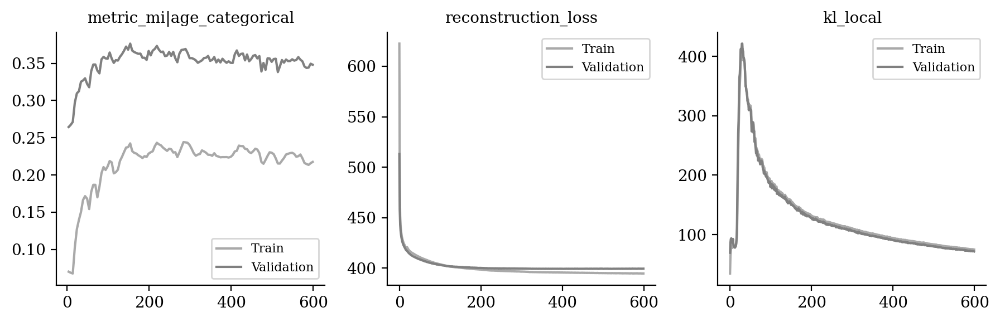

In [11]:
vae.plot_training_history(
    ignore_first=0,
    n_col=4,
    metrics_name=["metric_mi|age_categorical", "reconstruction_loss", "kl_local"]
)

In [12]:
from tardis._disentanglementmanager import DisentanglementManager as DM

In [13]:
sublatent = DM.configurations.get_by_obs_key("age_categorical").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

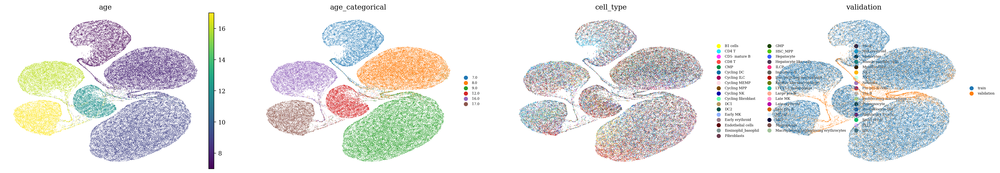

In [14]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['age', 'age_categorical', 'cell_type', 'validation'], 
        ncols=4,
        frameon=False,
        legend_fontsize="xx-small"
    )

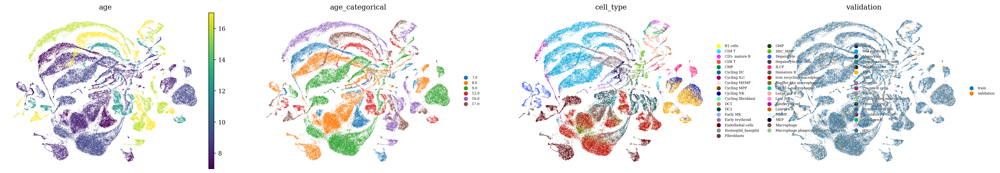

In [15]:
sublatent = DM.configurations.unreserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['age', 'age_categorical', 'cell_type', 'validation'], 
        ncols=4,
        frameon=False,
        legend_fontsize="xx-small"
    )

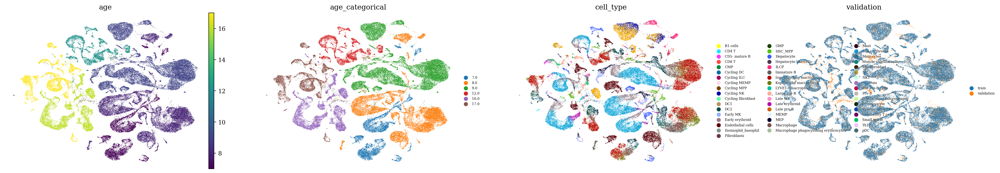

In [16]:
latent = ad.AnnData(X=vae.get_latent_representation(), obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['age', 'age_categorical', 'cell_type', 'validation'], 
        ncols=4,
        frameon=False,
        legend_fontsize="xx-small"
    )